Clustering

In [1]:
import pandas as pd
import os
from sklearn.preprocessing import LabelEncoder, StandardScaler

# 1. loading data
file_path = "DryBeanDataset/Dry_Bean_Dataset.xlsx"
df = pd.read_excel(file_path, engine='openpyxl')

# 2. encoding categorical labels
le = LabelEncoder()
df['Class_encoded'] = le.fit_transform(df['Class'])

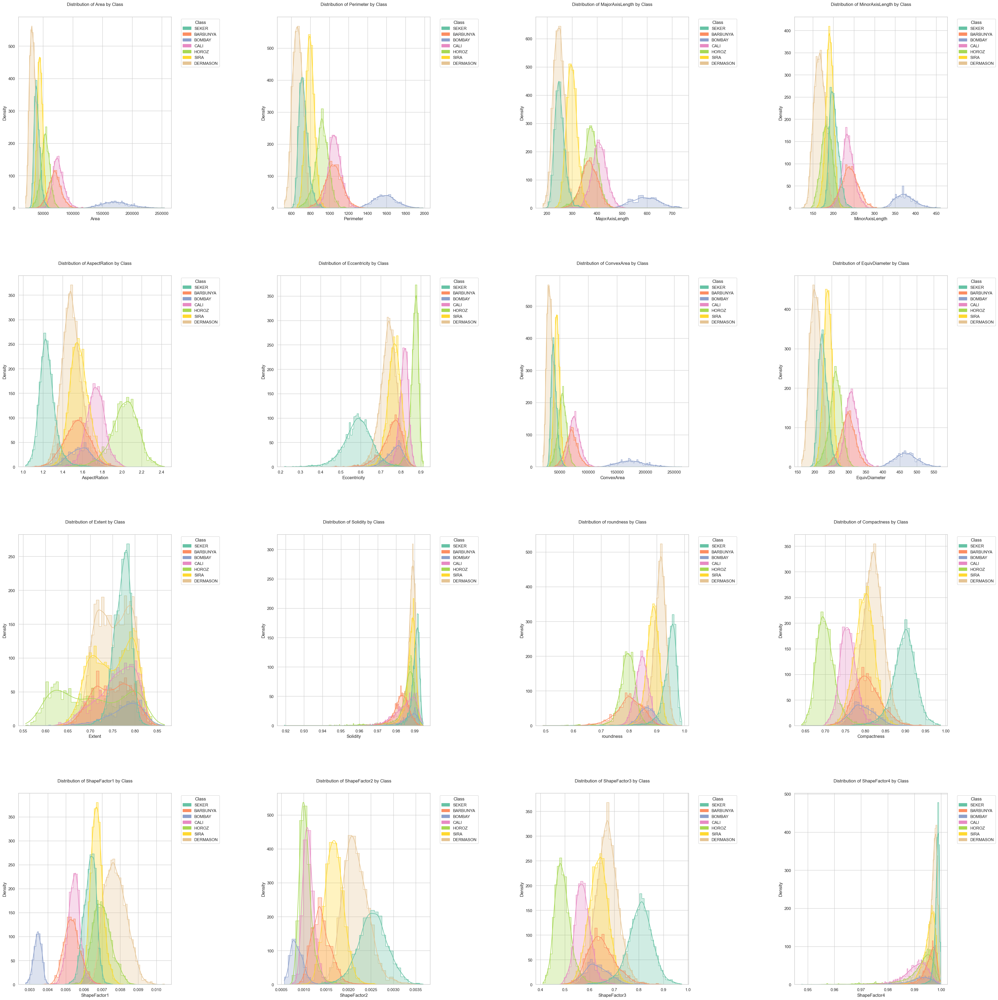

In [2]:
import matplotlib.pyplot as plt
import seaborn as sns
import math
import pandas as pd

sns.set_theme(style="whitegrid", palette="pastel")

features = df.columns.drop(['Class', 'Class_encoded']).tolist()

num_features = len(features)
ncols = 4
nrows = math.ceil(num_features / ncols)

fig, axes = plt.subplots(nrows=nrows, ncols=ncols, figsize=(40, 10 * nrows))  # 指定整体图片大小

plt.rcParams['font.size'] = 100

for i, feature in enumerate(features):
    row = i // ncols
    col = i % ncols
    ax = axes[row, col]
    
    sns.histplot(
        data=df,
        x=feature,
        hue='Class',
        element="step",  
        kde=True,        
        palette="Set2",  
        alpha=0.3,       
        ax=ax            
    )
    
    ax.set_title(f'Distribution of {feature} by Class', pad=30)
    ax.set_xlabel(feature)
    ax.set_ylabel('Density')
    
    import matplotlib.patches as mpatches

    classes = df['Class'].unique()

    legend_patches = [mpatches.Patch(color=sns.color_palette("Set2")[i], label=cls) for i, cls in enumerate(classes)]

    ax.legend(handles=legend_patches, title='Class', bbox_to_anchor=(1.05, 1), loc='upper left')

plt.tight_layout()

plt.savefig('feature_distributions.png', dpi=300, bbox_inches='tight')

plt.show()

sns.reset_orig()

In [3]:
class_col = df[['Class', 'Class_encoded']].copy()

features_to_scale = df.columns.drop(['Class', 'Class_encoded'])

scaler = StandardScaler()
scaled_features = pd.DataFrame(
    scaler.fit_transform(df[features_to_scale]),
    columns=features_to_scale
)

processed_df = pd.concat([scaled_features, class_col], axis=1)
processed_df = processed_df[df.columns]

processed_df.to_csv("data_processed.csv", index=False)

PC1: explained variance = 0.5547, cumulative explained variance = 0.5547
PC2: explained variance = 0.2643, cumulative explained variance = 0.8190
PC3: explained variance = 0.0801, cumulative explained variance = 0.8990
PC4: explained variance = 0.0511, cumulative explained variance = 0.9502
PC5: explained variance = 0.0274, cumulative explained variance = 0.9776
PC6: explained variance = 0.0115, cumulative explained variance = 0.9891
PC7: explained variance = 0.0070, cumulative explained variance = 0.9960
PC8: explained variance = 0.0033, cumulative explained variance = 0.9993
PC9: explained variance = 0.0005, cumulative explained variance = 0.9998
PC10: explained variance = 0.0001, cumulative explained variance = 0.9999


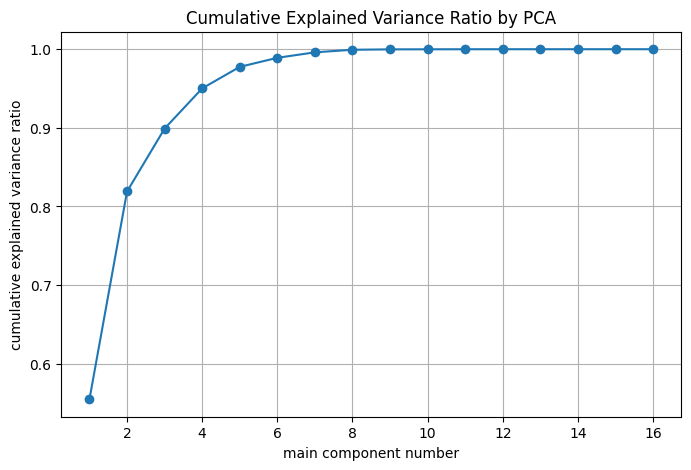

In [4]:
import pandas as pd
from sklearn.decomposition import PCA
import matplotlib.pyplot as plt

# 1. loading data
df = pd.read_csv('data_processed.csv')
X = df.drop(columns=['Class', 'Class_encoded'])

# 2. train PCA
pca = PCA(n_components=X.shape[1])
pca.fit(X)

# loadings = pd.DataFrame(
#     pca.components_.T,                # transpose the components
#     index=X.columns,                  # use original feature names
#     columns=[f'PC{i}' for i in range(1, X.shape[1]+1)]
# )
# print("\n components:")
# print(loadings)

# 3. calculate explained variance
explained_variance = pca.explained_variance_ratio_
cumulative_variance = explained_variance.cumsum()

# 4. print explained variance 
for i, (var, cum_var) in enumerate(zip(explained_variance[:10], cumulative_variance[:10]), start=1):
    print(f'PC{i}: explained variance = {var:.4f}, cumulative explained variance = {cum_var:.4f}')

# 5. plot explained variance
plt.figure(figsize=(8,5))
plt.plot(range(1, len(cumulative_variance)+1), cumulative_variance, marker='o')
plt.xlabel('main component number')
plt.ylabel('cumulative explained variance ratio')
plt.title('Cumulative Explained Variance Ratio by PCA')
plt.grid(True)
plt.show()


Correlation matrix:
                     Area  Perimeter  MajorAxisLength  MinorAxisLength  \
Area             1.000000   0.966722         0.931834         0.951602   
Perimeter        0.966722   1.000000         0.977338         0.913179   
MajorAxisLength  0.931834   0.977338         1.000000         0.826052   
MinorAxisLength  0.951602   0.913179         0.826052         1.000000   
AspectRation     0.241735   0.385276         0.550335        -0.009161   
Eccentricity     0.267481   0.391066         0.541972         0.019574   
ConvexArea       0.999939   0.967689         0.932607         0.951339   
EquivDiameter    0.984968   0.991380         0.961733         0.948539   
Extent           0.054345  -0.021160        -0.078062         0.145957   
Solidity        -0.196585  -0.303970        -0.284302        -0.155831   
roundness       -0.357530  -0.547647        -0.596358        -0.210344   
Compactness     -0.268067  -0.406857        -0.568377        -0.015066   
ShapeFactor1    -0

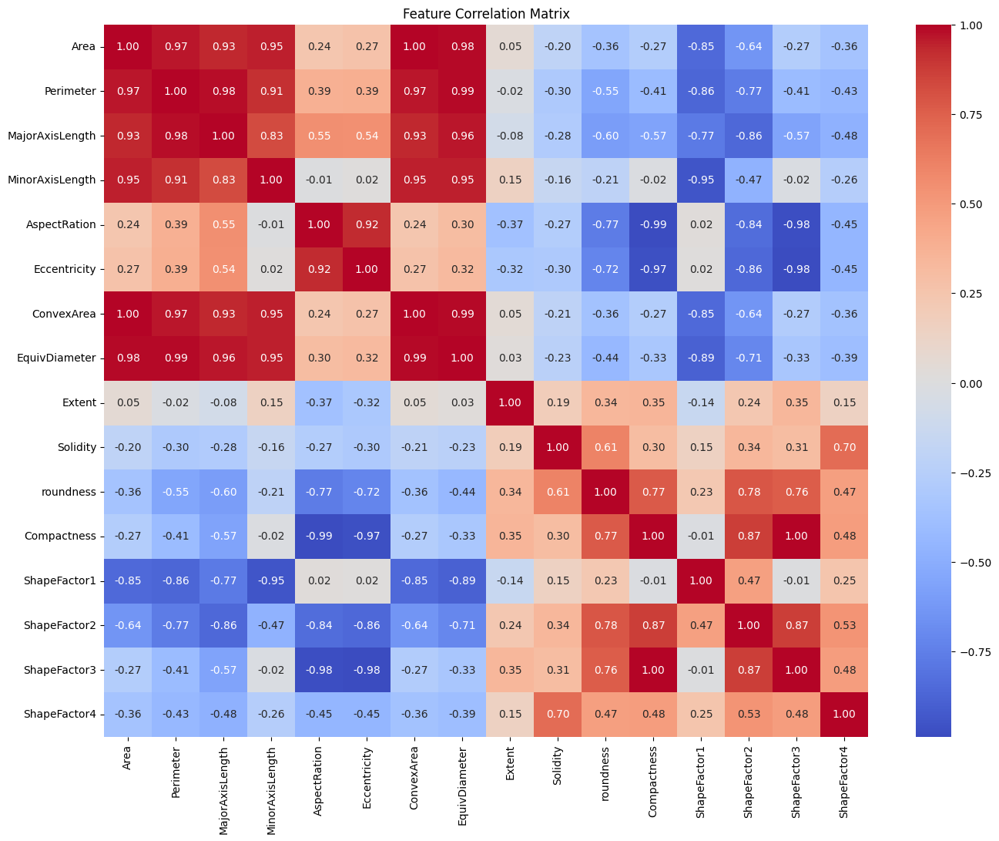

In [5]:
plt.figure(figsize=(16, 12))
corr_matrix = df.drop(['Class','Class_encoded'], axis=1).corr()
print("Correlation matrix:")
print(corr_matrix)
sns.heatmap(corr_matrix, annot=True, cmap='coolwarm', fmt='.2f')
plt.title("Feature Correlation Matrix")
plt.savefig('feature_correlation.png', dpi=300)
plt.show()

Mutual Information ranking:
Perimeter          1.056907
ConvexArea         1.038620
EquivDiameter      1.037148
Area               1.036810
MajorAxisLength    0.996402
ShapeFactor2       0.954664
ShapeFactor1       0.931071
MinorAxisLength    0.928023
Compactness        0.835602
ShapeFactor3       0.835584
Eccentricity       0.819633
AspectRation       0.819608
roundness          0.799560
ShapeFactor4       0.366569
Solidity           0.234112
Extent             0.198957
dtype: float64

Random Forest Feature Importance ranking:
ShapeFactor3       0.099739
ShapeFactor1       0.091667
Perimeter          0.088546
Compactness        0.087257
MajorAxisLength    0.079022
MinorAxisLength    0.077617
ConvexArea         0.075557
Eccentricity       0.066982
EquivDiameter      0.063147
AspectRation       0.061894
Area               0.056517
roundness          0.051593
ShapeFactor2       0.039778
ShapeFactor4       0.030595
Solidity           0.018516
Extent             0.011572
dtype: float64


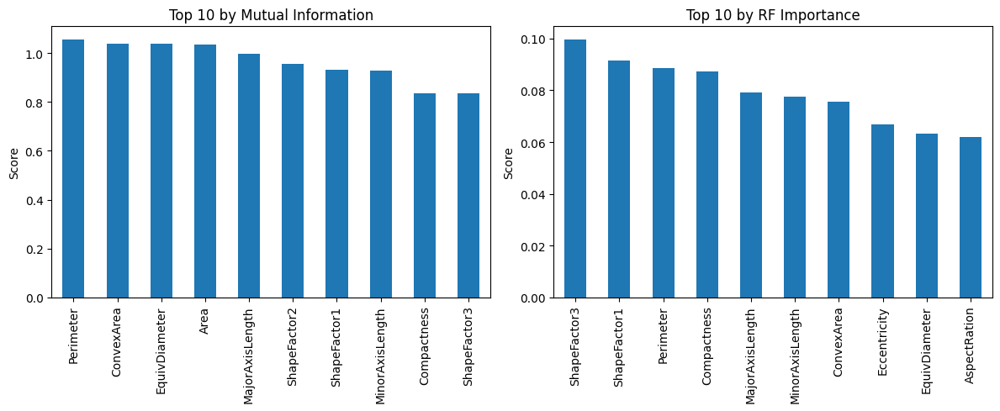


Selected features (top 8 by combined rank):
['Perimeter', 'ConvexArea', 'ShapeFactor1', 'MajorAxisLength', 'ShapeFactor3', 'EquivDiameter', 'Compactness', 'MinorAxisLength']


In [ ]:
import pandas as pd
from sklearn.ensemble import RandomForestClassifier
from sklearn.feature_selection import mutual_info_classif, SelectKBest
import matplotlib.pyplot as plt

# 1. loading data
df = pd.read_csv('data_processed.csv')
X = df.drop(columns=['Class', 'Class_encoded'])
y = df['Class_encoded']   

# 2. Calculating mutual information
mi = mutual_info_classif(X, y, discrete_features=False, random_state=42)
mi_series = pd.Series(mi, index=X.columns).sort_values(ascending=False)
print("Mutual Information ranking:")
print(mi_series)

# 3. Random Forest Feature Importance
rf = RandomForestClassifier(n_estimators=200, random_state=42)
rf.fit(X, y)
fi_series = pd.Series(rf.feature_importances_, index=X.columns).sort_values(ascending=False)
print("\nRandom Forest Feature Importance ranking:")
print(fi_series)

# 4. Plotting the top 10 features
top_k = 10
fig, axes = plt.subplots(1, 2, figsize=(12,5))
mi_series[:top_k].plot.bar(ax=axes[0], title=f'Top {top_k} by Mutual Information')
fi_series[:top_k].plot.bar(ax=axes[1], title=f'Top {top_k} by RF Importance')
for ax in axes:
    ax.set_ylabel('Score')
plt.tight_layout()
plt.show()

# 5. Combining rankings
combined_score = (mi_series.rank(ascending=False) + fi_series.rank(ascending=False)) / 2
combined = combined_score.sort_values().index.tolist()
selected_features = combined[:8]
print("\nSelected features (top 8 by combined rank):")
print(selected_features)


/opt/anaconda3/envs/newenv/lib/python3.13/site-packages/tqdm/auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm
/opt/anaconda3/envs/newenv/lib/python3.13/site-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
/opt/anaconda3/envs/newenv/lib/python3.13/site-packages/umap/umap_.py:1952: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(
OMP: Info #276: omp_set_nested routine deprecated, please use omp_set_max_active_levels instead.
/var/folders/qk/zgyqcw1j2d7_d2zbzrqgtfmw0000gn/T/ipykernel_57456/1545848510.py:27: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.c

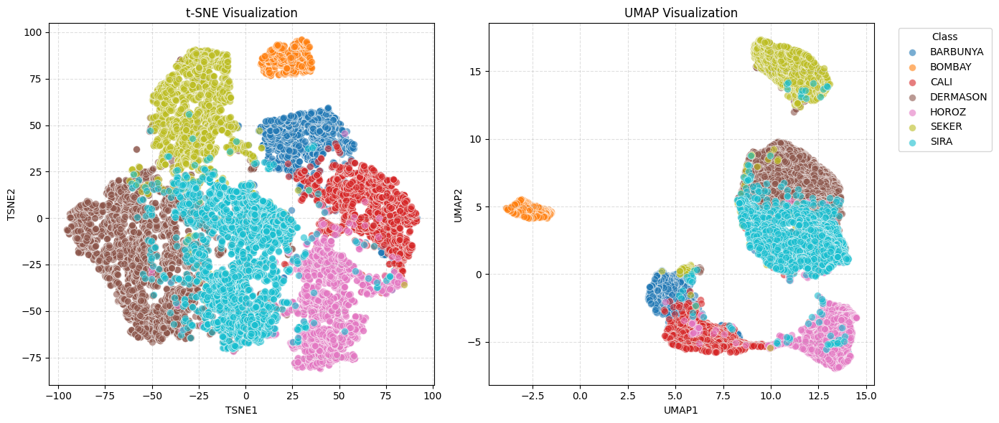

In [7]:
import pandas as pd
import matplotlib.pyplot as plt
import matplotlib.cm as cm
from sklearn.manifold import TSNE
import umap.umap_ as umap

# loading data and features
df = pd.read_csv('data_processed.csv')
features = [
    'Perimeter', 'ConvexArea', 'ShapeFactor1',
    'MajorAxisLength', 'ShapeFactor3', 'EquivDiameter',
    'Compactness', 'MinorAxisLength', 'ShapeFactor2','Area',
    'Eccentricity', 'AspectRation','Solidity',
    'Extent', 'roundness', 'ShapeFactor4'
]
X = df[features]
y = df['Class']

# dimensionality reduction
tsne = TSNE(n_components=2, perplexity=30, random_state=42)
X_tsne = tsne.fit_transform(X)

umap_model = umap.UMAP(n_components=2, random_state=42)
X_umap = umap_model.fit_transform(X)

unique_classes = sorted(y.unique())
colors = cm.get_cmap('tab10', len(unique_classes))
class_to_color = {cls: colors(i) for i, cls in enumerate(unique_classes)}

fig, axes = plt.subplots(1, 2, figsize=(14, 6))

# t-SNE 
for cls in unique_classes:
    idx = y == cls
    axes[0].scatter(
        X_tsne[idx, 0], X_tsne[idx, 1],
        label=cls,
        color=class_to_color[cls],
        alpha=0.6,
        edgecolors='w',
        linewidths=0.5,
        s=50
    )
axes[0].set_title('t-SNE Visualization')
axes[0].set_xlabel('TSNE1')
axes[0].set_ylabel('TSNE2')
axes[0].grid(True, linestyle='--', alpha=0.4)

# UMAP 
for cls in unique_classes:
    idx = y == cls
    axes[1].scatter(
        X_umap[idx, 0], X_umap[idx, 1],
        label=cls,
        color=class_to_color[cls],
        alpha=0.6,
        edgecolors='w',
        linewidths=0.5,
        s=50
    )
axes[1].set_title('UMAP Visualization')
axes[1].set_xlabel('UMAP1')
axes[1].set_ylabel('UMAP2')
axes[1].grid(True, linestyle='--', alpha=0.4)

axes[1].legend(title='Class', bbox_to_anchor=(1.05, 1), loc='upper left')
plt.tight_layout()

plt.savefig("dimensionality_comparison.png", dpi=300)
plt.show()


In [8]:
import pandas as pd
import numpy as np
from sklearn.manifold import TSNE
from sklearn.mixture import GaussianMixture
from sklearn.cluster import KMeans
from scipy.cluster.hierarchy import linkage, fcluster
from sklearn.metrics import (
    adjusted_rand_score,
    silhouette_score,
    calinski_harabasz_score,
    davies_bouldin_score
)
import matplotlib.pyplot as plt

df = pd.read_csv('data_processed.csv')
features = [
    'Perimeter', 'ConvexArea', 'ShapeFactor1',
    'MajorAxisLength', 'ShapeFactor3', 'EquivDiameter',
    'Compactness', 'MinorAxisLength','ShapeFactor2',
]
X = df[features]
y_true = df['Class']
n_clusters = y_true.nunique()

tsne_proj = TSNE(n_components=2, perplexity=30, random_state=42).fit_transform(X)
df['TSNE1'], df['TSNE2'] = tsne_proj[:,0], tsne_proj[:,1]

metrics_list = []

methods = {}
for name in ['GaussianMixture','KMeans','Ward']:
    if name=='GaussianMixture':
        model = GaussianMixture(n_components=n_clusters,
                                covariance_type='full',
                                random_state=42)
        y_pred = model.fit_predict(X)
    elif name=='KMeans':
        model = KMeans(n_clusters=n_clusters,
                       n_init='auto',
                       random_state=42)
        y_pred = model.fit_predict(X)
    else:  # Ward
        Z = linkage(X, method='ward')
        y_pred = fcluster(Z, n_clusters, criterion='maxclust') - 1

    # compute metrics
    ari = adjusted_rand_score(y_true, y_pred)
    sil = silhouette_score(X, y_pred)
    ch  = calinski_harabasz_score(X, y_pred)
    db  = davies_bouldin_score(X, y_pred)

    metrics_list.append({
        'Method': name,
        'ARI': ari,
        'Silhouette': sil,
        'Calinski-Harabasz': ch,
        'Davies-Bouldin': db
    })

    # save preds & confusion for plotting later
    cm = pd.crosstab(y_true, y_pred,
                     rownames=['True'], colnames=['Pred'])
    methods[name] = (y_pred, cm)

# 4. Create metrics DataFrame
metrics_df = pd.DataFrame(metrics_list).set_index('Method')
print(metrics_df)


                      ARI  Silhouette  Calinski-Harabasz  Davies-Bouldin
Method                                                                  
GaussianMixture  0.706386    0.435118       19458.011366        0.782976
KMeans           0.696486    0.453440       20556.113103        0.746249
Ward             0.742982    0.423514       18942.183278        0.762995


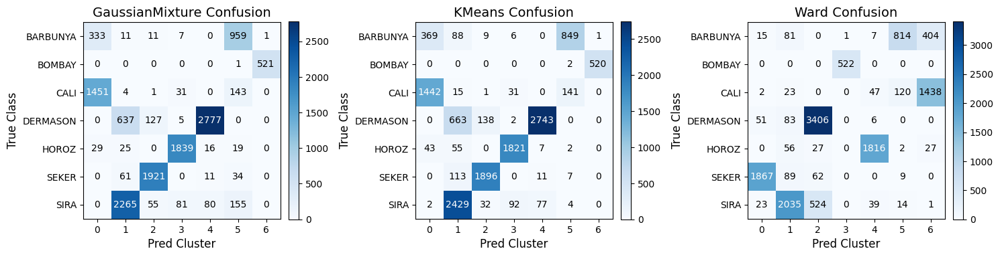


Confusion Matrix for GaussianMixture:
Pred         0     1     2     3     4    5    6
True                                            
BARBUNYA   333    11    11     7     0  959    1
BOMBAY       0     0     0     0     0    1  521
CALI      1451     4     1    31     0  143    0
DERMASON     0   637   127     5  2777    0    0
HOROZ       29    25     0  1839    16   19    0
SEKER        0    61  1921     0    11   34    0
SIRA         0  2265    55    81    80  155    0

Confusion Matrix for KMeans:
Pred         0     1     2     3     4    5    6
True                                            
BARBUNYA   369    88     9     6     0  849    1
BOMBAY       0     0     0     0     0    2  520
CALI      1442    15     1    31     0  141    0
DERMASON     0   663   138     2  2743    0    0
HOROZ       43    55     0  1821     7    2    0
SEKER        0   113  1896     0    11    7    0
SIRA         2  2429    32    92    77    4    0

Confusion Matrix for Ward:
Pred         0     1 

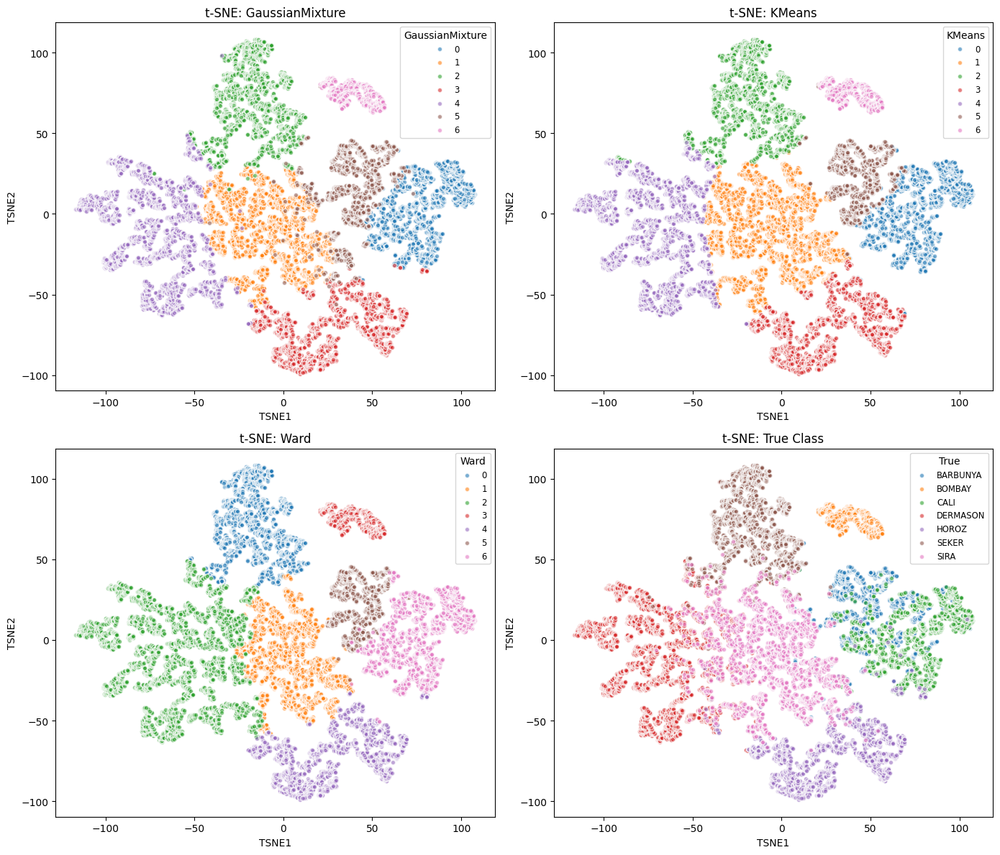

In [9]:
# FIGURE 1: all three confusion matrices in one column
fig, axes = plt.subplots(1, 3, figsize=(15, 5))  # Adjusted figsize for better layout
for ax, (name, (y_pred, cm)) in zip(axes, methods.items()):
    im = ax.imshow(cm.values, cmap='Blues', interpolation='nearest')
    ax.set_title(f"{name} Confusion", fontsize=14)  # Title font size
    ax.set_xlabel('Pred Cluster', fontsize=12)  # X-axis label font size
    ax.set_ylabel('True Class', fontsize=12)  # Y-axis label font size
    ax.set_xticks(np.arange(cm.shape[1]))
    ax.set_xticklabels(cm.columns, fontsize=10)  # X-tick labels font size
    ax.set_yticks(np.arange(cm.shape[0]))
    ax.set_yticklabels(cm.index, fontsize=10)  # Y-tick labels font size
    
    thresh = cm.values.max() / 2
    for i, j in np.ndindex(cm.shape):
        ax.text(j, i, cm.iat[i, j],
                ha='center', va='center',
                color='white' if cm.iat[i, j] > thresh else 'black')
    
    # Customize colorbar font size
    cbar = fig.colorbar(im, ax=ax, fraction=0.046, pad=0.04)
    cbar.ax.tick_params(labelsize=10)  # Colorbar tick labels font size

plt.tight_layout()
plt.savefig("confusion_matrices_column.png", dpi=300)
plt.show()
# Print confusion matrices
for name, (_, cm) in methods.items():
    print(f"\nConfusion Matrix for {name}:")
    print(cm)

# FIGURE 2: 2×2 t-SNE plots (GM, KMeans, Ward, True)
fig, axes = plt.subplots(2,2, figsize=(14,12))
plot_positions = [
    ('GaussianMixture', axes[0,0]),
    ('KMeans',            axes[0,1]),
    ('Ward',              axes[1,0]),
    ('True',              axes[1,1]),
]
for name, ax in plot_positions:
    if name=='True':
        labels = y_true
        title = 't-SNE: True Class'
    else:
        labels = methods[name][0]
        title = f"t-SNE: {name}"
    for lbl in np.unique(labels):
        sel = (labels==lbl)
        ax.scatter(df.loc[sel,'TSNE1'], df.loc[sel,'TSNE2'],
                   s=20, alpha=0.6, label=lbl, edgecolor='w')
    ax.set_title(title)
    ax.set_xlabel('TSNE1');  ax.set_ylabel('TSNE2')
    ax.legend(fontsize='small', title=name)
plt.tight_layout()
plt.savefig("tsne_comparison_2x2.png", dpi=300)
plt.show()

In [10]:
import pandas as pd
import os
from sklearn.preprocessing import LabelEncoder, StandardScaler

# 1. loading data
file_path = "DryBeanDataset/Dry_Bean_Dataset.xlsx"
df = pd.read_excel(file_path, engine='openpyxl')

# 2. encoding categorical labels
le = LabelEncoder()
df['Class_encoded'] = le.fit_transform(df['Class'])
features = df.columns.drop(['Class', 'Class_encoded']).tolist()
df["Elongation"] = df["AspectRation"] * (1 - df["roundness"])
df["KidneyScore"]=(1 - df["ShapeFactor4"]) * df["EquivDiameter"]
df["TextureHint"] = df["Solidity"] * df["Compactness"] 
df["ShapeScore1"]=df["Eccentricity"] * df["AspectRation"]
df["ShapeScore2"]=df["ShapeFactor2"]/df["ShapeFactor3"]
df["BoundaryComplexity"]=df["ShapeFactor4"]*(1/df["Solidity"])
df["logArea"] = df["Area"].apply(lambda x: 0 if x == 0 else np.log(x))
df["logConvexArea"] = df["ConvexArea"].apply(lambda x: 0 if x == 0 else np.log(x))
df["logPerimeter"] = df["Perimeter"].apply(lambda x: 0 if x == 0 else np.log(x))
features.append("Elongation")
features.append("TextureHint")
features.append("KidneyScore")
features.append("ShapeScore1")
features.append("ShapeScore2")
features.append("BoundaryComplexity")
features.append("logArea")
features.append("logConvexArea")
features.append("logPerimeter")

class_col = df[['Class', 'Class_encoded']].copy()

features_to_scale = df.columns.drop(['Class', 'Class_encoded'])

# scaling features using Z-score normalization
scaler = StandardScaler()
scaled_features = pd.DataFrame(
    scaler.fit_transform(df[features_to_scale]),
    columns=features_to_scale
)
processed_df = pd.concat([scaled_features, class_col], axis=1)
processed_df = processed_df[df.columns]
processed_df.to_csv("data_processed_featured.csv", index=False)


In [11]:
import pandas as pd
import numpy as np
from sklearn.manifold import TSNE
from sklearn.mixture import GaussianMixture
from sklearn.cluster import KMeans
from scipy.cluster.hierarchy import linkage, fcluster
from sklearn.metrics import adjusted_rand_score, silhouette_score, calinski_harabasz_score, davies_bouldin_score
import matplotlib.pyplot as plt

# read the processed data
df = pd.read_csv('data_processed_featured.csv')
features = [
    'Perimeter', 'ShapeFactor1', 'MinorAxisLength', 
    'EquivDiameter', 'MajorAxisLength', 'ConvexArea', 
    "ShapeFactor3","ShapeFactor2",'Compactness',"KidneyScore","TextureHint","Elongation",
]
X = df[features]
y_true = df['Class']
n_clusters = y_true.nunique()

tsne_proj = TSNE(n_components=2, perplexity=30, random_state=42).fit_transform(X)
df['TSNE1'], df['TSNE2'] = tsne_proj[:,0], tsne_proj[:,1]

metrics_list = []

methods = {}
for name in ['GaussianMixture','KMeans','Ward']:
    if name=='GaussianMixture':
        model = GaussianMixture(n_components=n_clusters,
                                covariance_type='full',
                                random_state=42)
        y_pred = model.fit_predict(X)
    elif name=='KMeans':
        model = KMeans(n_clusters=n_clusters,
                       n_init='auto',
                       random_state=42)
        y_pred = model.fit_predict(X)
    else:  # Ward
        Z = linkage(X, method='ward')
        y_pred = fcluster(Z, n_clusters, criterion='maxclust') - 1

    # compute metrics
    ari = adjusted_rand_score(y_true, y_pred)
    sil = silhouette_score(X, y_pred)
    ch  = calinski_harabasz_score(X, y_pred)
    db  = davies_bouldin_score(X, y_pred)

    metrics_list.append({
        'Method': name,
        'ARI': ari,
        'Silhouette': sil,
        'Calinski-Harabasz': ch,
        'Davies-Bouldin': db
    })

    # save preds & confusion for plotting later
    cm = pd.crosstab(y_true, y_pred,
                     rownames=['True'], colnames=['Pred'])
    methods[name] = (y_pred, cm)

# Create metrics DataFrame
metrics_df = pd.DataFrame(metrics_list).set_index('Method')
print(metrics_df)

                      ARI  Silhouette  Calinski-Harabasz  Davies-Bouldin
Method                                                                  
GaussianMixture  0.743048    0.374517       12215.344308        0.994628
KMeans           0.685993    0.391199       13289.119354        0.923573
Ward             0.635448    0.386065       12282.028198        0.886914


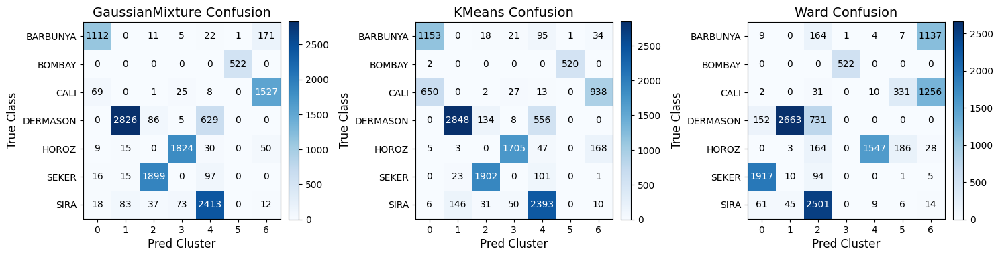


Confusion Matrix for GaussianMixture:
Pred         0     1     2     3     4    5     6
True                                             
BARBUNYA  1112     0    11     5    22    1   171
BOMBAY       0     0     0     0     0  522     0
CALI        69     0     1    25     8    0  1527
DERMASON     0  2826    86     5   629    0     0
HOROZ        9    15     0  1824    30    0    50
SEKER       16    15  1899     0    97    0     0
SIRA        18    83    37    73  2413    0    12

Confusion Matrix for KMeans:
Pred         0     1     2     3     4    5    6
True                                            
BARBUNYA  1153     0    18    21    95    1   34
BOMBAY       2     0     0     0     0  520    0
CALI       650     0     2    27    13    0  938
DERMASON     0  2848   134     8   556    0    0
HOROZ        5     3     0  1705    47    0  168
SEKER        0    23  1902     0   101    0    1
SIRA         6   146    31    50  2393    0   10

Confusion Matrix for Ward:
Pred        

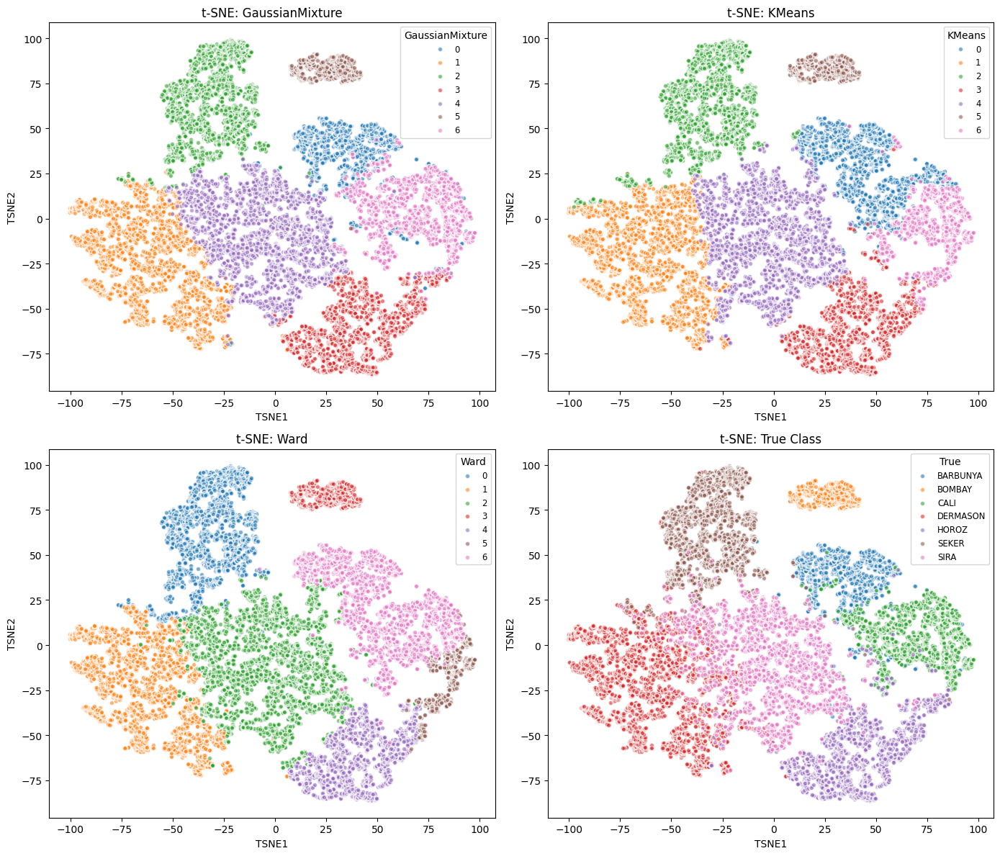

In [12]:
# FIGURE 1: all three confusion matrices in one column
fig, axes = plt.subplots(1, 3, figsize=(15, 5))  # Adjusted figsize for better layout
for ax, (name, (y_pred, cm)) in zip(axes, methods.items()):
    im = ax.imshow(cm.values, cmap='Blues', interpolation='nearest')
    ax.set_title(f"{name} Confusion", fontsize=14)  # Title font size
    ax.set_xlabel('Pred Cluster', fontsize=12)  # X-axis label font size
    ax.set_ylabel('True Class', fontsize=12)  # Y-axis label font size
    ax.set_xticks(np.arange(cm.shape[1]))
    ax.set_xticklabels(cm.columns, fontsize=10)  # X-tick labels font size
    ax.set_yticks(np.arange(cm.shape[0]))
    ax.set_yticklabels(cm.index, fontsize=10)  # Y-tick labels font size
    
    thresh = cm.values.max() / 2
    for i, j in np.ndindex(cm.shape):
        ax.text(j, i, cm.iat[i, j],
                ha='center', va='center',
                color='white' if cm.iat[i, j] > thresh else 'black')
    
    # Customize colorbar font size
    cbar = fig.colorbar(im, ax=ax, fraction=0.046, pad=0.04)
    cbar.ax.tick_params(labelsize=10)  # Colorbar tick labels font size

plt.tight_layout()
plt.savefig("confusion_matrices_column_f.png", dpi=300)
plt.show()

# Print confusion matrices
for name, (_, cm) in methods.items():
    print(f"\nConfusion Matrix for {name}:")
    print(cm)

# FIGURE 2: 2×2 t-SNE plots (GM, KMeans, Ward, True)
fig, axes = plt.subplots(2,2, figsize=(14,12))
plot_positions = [
    ('GaussianMixture', axes[0,0]),
    ('KMeans',            axes[0,1]),
    ('Ward',              axes[1,0]),
    ('True',              axes[1,1]),
]
for name, ax in plot_positions:
    if name=='True':
        labels = y_true
        title = 't-SNE: True Class'
    else:
        labels = methods[name][0]
        title = f"t-SNE: {name}"
    for lbl in np.unique(labels):
        sel = (labels==lbl)
        ax.scatter(df.loc[sel,'TSNE1'], df.loc[sel,'TSNE2'],
                   s=20, alpha=0.6, label=lbl, edgecolor='w')
    ax.set_title(title)
    ax.set_xlabel('TSNE1');  ax.set_ylabel('TSNE2')
    ax.legend(fontsize='small', title=name)
plt.tight_layout()
plt.savefig("tsne_comparison_2x2_f.png", dpi=300)
plt.show()


adaboost

/opt/anaconda3/envs/newenv/lib/python3.13/site-packages/sklearn/ensemble/_weight_boosting.py:519: FutureWarning: The parameter 'algorithm' is deprecated in 1.6 and has no effect. It will be removed in version 1.8.
  warnings.warn(
/opt/anaconda3/envs/newenv/lib/python3.13/site-packages/sklearn/ensemble/_weight_boosting.py:519: FutureWarning: The parameter 'algorithm' is deprecated in 1.6 and has no effect. It will be removed in version 1.8.
  warnings.warn(
/opt/anaconda3/envs/newenv/lib/python3.13/site-packages/sklearn/ensemble/_weight_boosting.py:519: FutureWarning: The parameter 'algorithm' is deprecated in 1.6 and has no effect. It will be removed in version 1.8.
  warnings.warn(
/opt/anaconda3/envs/newenv/lib/python3.13/site-packages/sklearn/ensemble/_weight_boosting.py:519: FutureWarning: The parameter 'algorithm' is deprecated in 1.6 and has no effect. It will be removed in version 1.8.
  warnings.warn(
/opt/anaconda3/envs/newenv/lib/python3.13/site-packages/sklearn/ensemble/_we

Best parameters: {'algorithm': 'SAMME', 'estimator': DecisionTreeClassifier(max_depth=3), 'learning_rate': 0.5, 'n_estimators': 50}
Train set accuracy: 91.83%


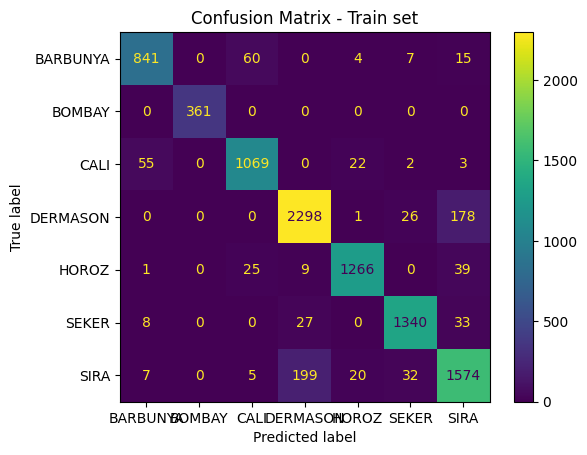

Classification report for train set:
              precision    recall  f1-score   support

    BARBUNYA       0.92      0.91      0.91       927
      BOMBAY       1.00      1.00      1.00       361
        CALI       0.92      0.93      0.93      1151
    DERMASON       0.91      0.92      0.91      2503
       HOROZ       0.96      0.94      0.95      1340
       SEKER       0.95      0.95      0.95      1408
        SIRA       0.85      0.86      0.86      1837

    accuracy                           0.92      9527
   macro avg       0.93      0.93      0.93      9527
weighted avg       0.92      0.92      0.92      9527



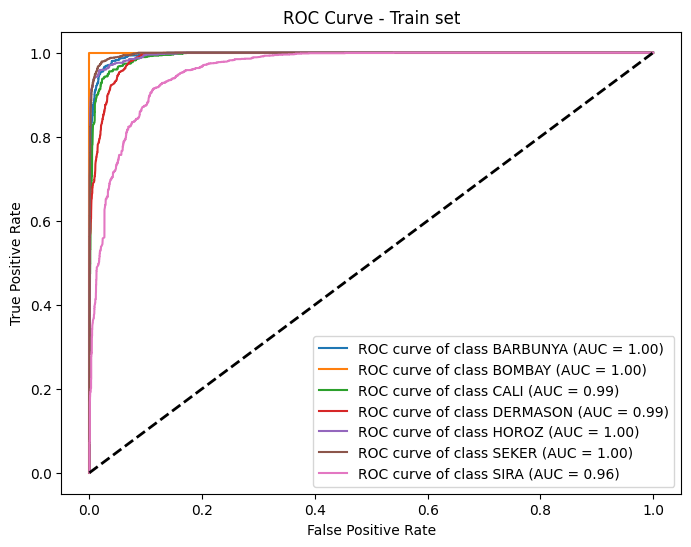

Average AUC (train set): 0.9905
Test set accuracy: 91.36%


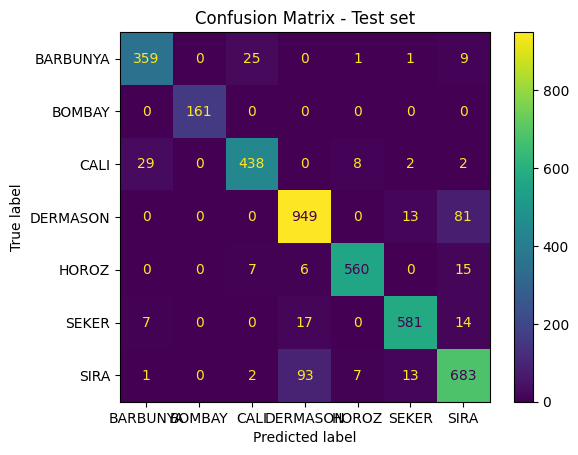

Classification report for test set:
              precision    recall  f1-score   support

    BARBUNYA       0.91      0.91      0.91       395
      BOMBAY       1.00      1.00      1.00       161
        CALI       0.93      0.91      0.92       479
    DERMASON       0.89      0.91      0.90      1043
       HOROZ       0.97      0.95      0.96       588
       SEKER       0.95      0.94      0.95       619
        SIRA       0.85      0.85      0.85       799

    accuracy                           0.91      4084
   macro avg       0.93      0.93      0.93      4084
weighted avg       0.91      0.91      0.91      4084



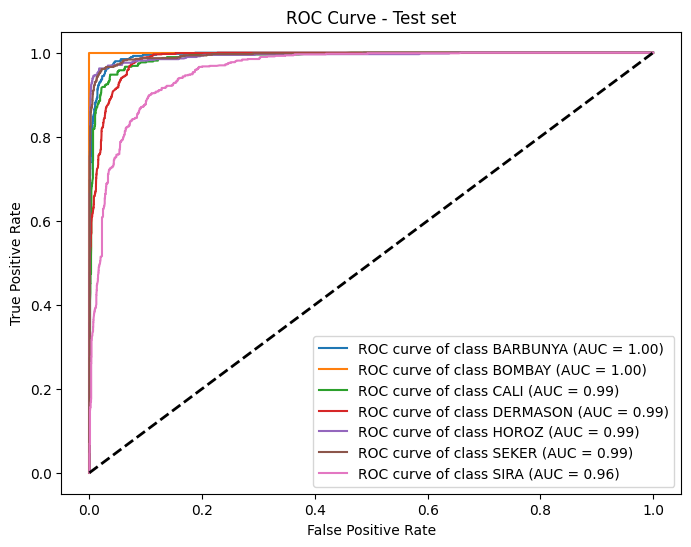

Average AUC (test set): 0.9884
Whole dataset accuracy: 91.69%


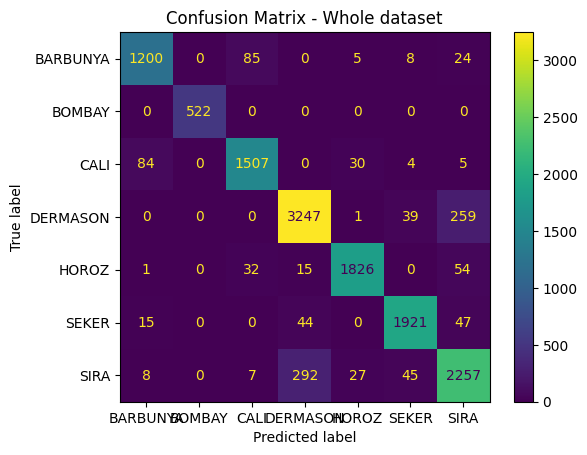

Classification report for whole dataset:
              precision    recall  f1-score   support

    BARBUNYA       0.92      0.91      0.91      1322
      BOMBAY       1.00      1.00      1.00       522
        CALI       0.92      0.92      0.92      1630
    DERMASON       0.90      0.92      0.91      3546
       HOROZ       0.97      0.95      0.96      1928
       SEKER       0.95      0.95      0.95      2027
        SIRA       0.85      0.86      0.85      2636

    accuracy                           0.92     13611
   macro avg       0.93      0.93      0.93     13611
weighted avg       0.92      0.92      0.92     13611



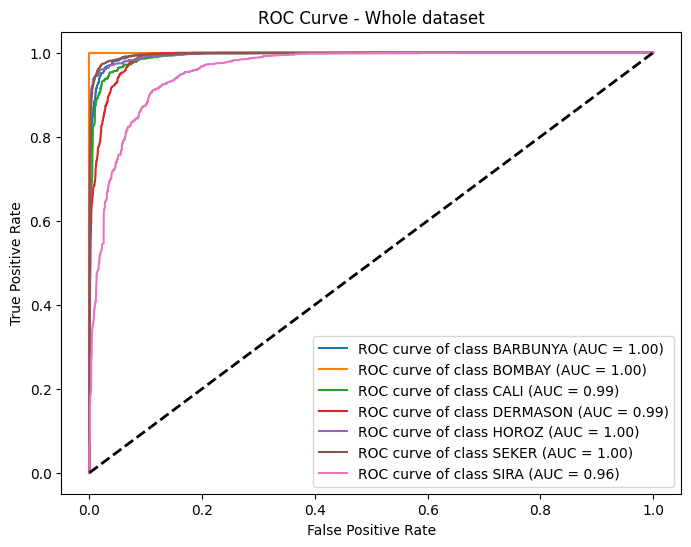

Average AUC (whole dataset): 0.9899


In [ ]:
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import AdaBoostClassifier
from sklearn.model_selection import GridSearchCV
from sklearn.metrics import accuracy_score, classification_report
from sklearn.metrics import ConfusionMatrixDisplay
from sklearn.preprocessing import label_binarize
from sklearn.metrics import roc_curve, auc
from sklearn.metrics import roc_auc_score
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.metrics import confusion_matrix
from sklearn.decomposition import PCA

# Set the random seed for reproducibility
np.random.seed(42)

# Load the dataset
data = pd.read_csv("Dry_Bean_Dataset.csv")

# Assume that all columns except "Class" are features
X = data.drop('Class', axis=1)
y = data['Class']
# scale the data
scaler = StandardScaler()
X = scaler.fit_transform(X)


# Split data into training and testing sets (70% train, 30% test)
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=42)

# Update parameter grid to include base_estimator's max_depth and set algorithm to 'SAMME'
param_grid = {
    'n_estimators': [50, 100, 200],
    'learning_rate': [0.5, 1.0, 1.5],
    'estimator': [DecisionTreeClassifier(max_depth=1), DecisionTreeClassifier(max_depth=2), DecisionTreeClassifier(max_depth=3)],
    'algorithm': ['SAMME']  # Set algorithm to SAMME
}

# Create the GridSearchCV object with the updated param_grid
grid_search = GridSearchCV(
    estimator=AdaBoostClassifier(random_state=42),
    param_grid=param_grid,
    scoring='accuracy',
    cv=5,
    n_jobs=-1
)

# Fit GridSearchCV to the training data
grid_search.fit(X_train, y_train)

# Get the best estimator
best_ada = grid_search.best_estimator_
# Print the best parameters and score
print("Best parameters:", grid_search.best_params_)
#evaluate the model
#define datasets and their names for iteration
# Get class names
classes = np.unique(y)

datasets = [
    ("Train set", X_train, y_train),
    ("Test set", X_test, y_test),
    ("Whole dataset", X, y)
]

for name, X_set, y_set in datasets:
    y_pred = best_ada.predict(X_set)
    accuracy = accuracy_score(y_set, y_pred) * 100
    print(f"{name} accuracy: {accuracy:.2f}%")
    
    # plot confusion matrix
    cm = confusion_matrix(y_set, y_pred)
    disp = ConfusionMatrixDisplay(confusion_matrix=cm, display_labels=classes)
    disp.plot()
    plt.title(f"Confusion Matrix - {name}")
    plt.show()
    
    print(f"Classification report for {name.lower()}:")
    print(classification_report(y_set, y_pred, target_names=classes.astype(str)))
    
    # binarize the output for ROC curve (one-vs-rest)
    y_bin = label_binarize(y_set, classes=classes)
    if hasattr(best_ada, "decision_function"):
        y_score = best_ada.decision_function(X_set)
    else:
        y_score = best_ada.predict_proba(X_set)
    
    fpr = dict()
    tpr = dict()
    roc_auc = dict()
    for i in range(len(classes)):
        fpr[i], tpr[i], _ = roc_curve(y_bin[:, i], y_score[:, i])
        roc_auc[i] = auc(fpr[i], tpr[i])
    # compute micro-average ROC curve and ROC area
    fpr["micro"], tpr["micro"], _ = roc_curve(y_bin.ravel(), y_score.ravel())
    roc_auc["micro"] = auc(fpr["micro"], tpr["micro"])
    
    # plot ROC curve for each class
    plt.figure(figsize=(8, 6))
    for i in range(len(classes)):
        plt.plot(fpr[i], tpr[i], label=f'ROC curve of class {classes[i]} (AUC = {roc_auc[i]:0.2f})')
    plt.plot([0, 1], [0, 1], 'k--', lw=2)
    plt.xlabel('False Positive Rate')
    plt.ylabel('True Positive Rate')
    plt.title(f'ROC Curve - {name}')
    plt.legend(loc="lower right")
    plt.show()
    
    # calculate and print average AUC
    average_auc = np.mean([roc_auc[i] for i in range(len(classes))])
    print(f'Average AUC ({name.lower()}): {average_auc:.4f}')



/opt/anaconda3/envs/newenv/lib/python3.13/site-packages/sklearn/ensemble/_weight_boosting.py:519: FutureWarning: The parameter 'algorithm' is deprecated in 1.6 and has no effect. It will be removed in version 1.8.
  warnings.warn(
/var/folders/qk/zgyqcw1j2d7_d2zbzrqgtfmw0000gn/T/ipykernel_70208/1019582220.py:28: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.
  plt.contourf(xx, yy, Z_numeric, alpha=0.3, levels=len(classes), cmap=plt.cm.get_cmap('tab10', len(classes)))
/var/folders/qk/zgyqcw1j2d7_d2zbzrqgtfmw0000gn/T/ipykernel_70208/1019582220.py:30: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.
  cmap=plt.cm.get_cmap('tab10', len(classes)), e

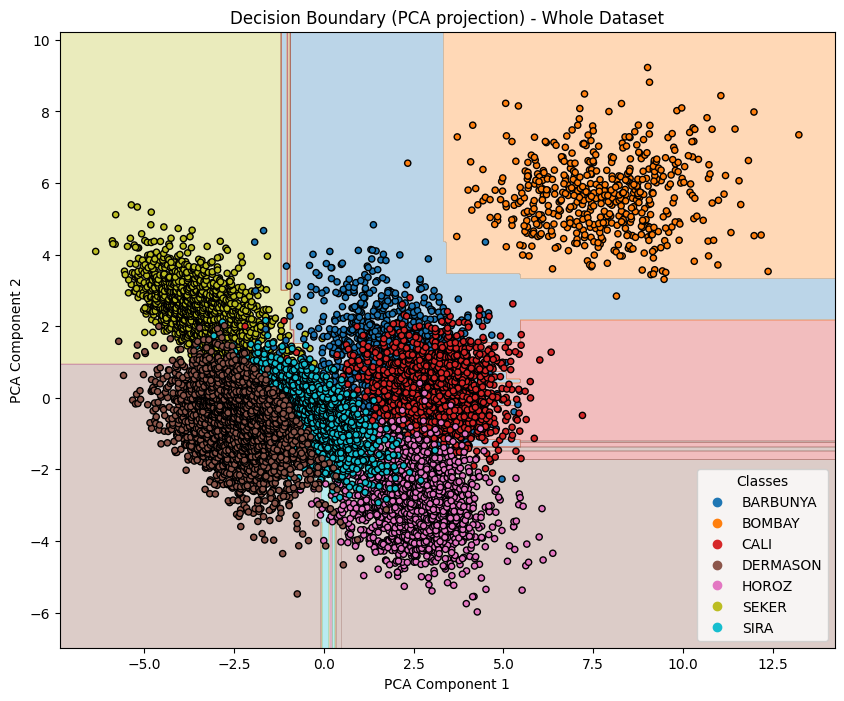

In [10]:
# Reduce features to 2D using PCA for visualization
pca = PCA(n_components=2)
X_pca = pca.fit_transform(X)

# Fit logistic regression on PCA-reduced data for visualization
logreg_vis = AdaBoostClassifier(
    random_state=42,
    algorithm = grid_search.best_params_["algorithm"],
    estimator=grid_search.best_params_["estimator"],
    learning_rate=grid_search.best_params_["learning_rate"],
    n_estimators=grid_search.best_params_["n_estimators"]
)
logreg_vis.fit(X_pca, y)

# Create a mesh grid for plotting decision boundaries
x_min, x_max = X_pca[:, 0].min() - 1, X_pca[:, 0].max() + 1
y_min, y_max = X_pca[:, 1].min() - 1, X_pca[:, 1].max() + 1
xx, yy = np.meshgrid(np.linspace(x_min, x_max, 500),
                     np.linspace(y_min, y_max, 500))
Z = logreg_vis.predict(np.c_[xx.ravel(), yy.ravel()])

# Map class names to numeric indices
class_to_index = {cls: idx for idx, cls in enumerate(classes)}
Z_numeric = np.vectorize(class_to_index.get)(Z)
Z_numeric = Z_numeric.reshape(xx.shape)

plt.figure(figsize=(10, 8))
plt.contourf(xx, yy, Z_numeric, alpha=0.3, levels=len(classes), cmap=plt.cm.get_cmap('tab10', len(classes)))
scatter = plt.scatter(X_pca[:, 0], X_pca[:, 1], c=[class_to_index[yy] for yy in y], 
                      cmap=plt.cm.get_cmap('tab10', len(classes)), edgecolor='k', s=20)
plt.xlabel('PCA Component 1')
plt.ylabel('PCA Component 2')
plt.title('Decision Boundary (PCA projection) - Whole Dataset')

# Add legend using the original class names
handles, _ = scatter.legend_elements(prop="colors")
plt.legend(handles, classes, title="Classes", loc="best")

plt.show()

bagging

max_depth=5 准确率: 89.12%
max_depth=6 准确率: 91.23%
max_depth=7 准确率: 92.06%
max_depth=8 准确率: 92.23%
max_depth=9 准确率: 92.36%
max_depth=10 准确率: 92.33%
max_depth=11 准确率: 92.43%
max_depth=12 准确率: 92.43%
max_depth=13 准确率: 92.45%
max_depth=14 准确率: 92.38%
max_depth=15 准确率: 92.43%
max_depth=16 准确率: 92.43%
max_depth=17 准确率: 92.33%
max_depth=18 准确率: 92.33%
max_depth=19 准确率: 92.28%

================= 最佳结果 =================
最佳max_depth: 13
训练集准确率: 97.06%
测试集准确率: 92.45%
完整数据集准确率: 95.68%

Classification Report for Training Set:
              precision    recall  f1-score   support

    BARBUNYA       0.99      0.96      0.98       925
      BOMBAY       1.00      1.00      1.00       365
        CALI       0.98      0.98      0.98      1141
    DERMASON       0.96      0.98      0.97      2480
       HOROZ       0.99      0.97      0.98      1350
       SEKER       0.98      0.97      0.97      1417
        SIRA       0.95      0.95      0.95      1845

    accuracy                           0.97      9

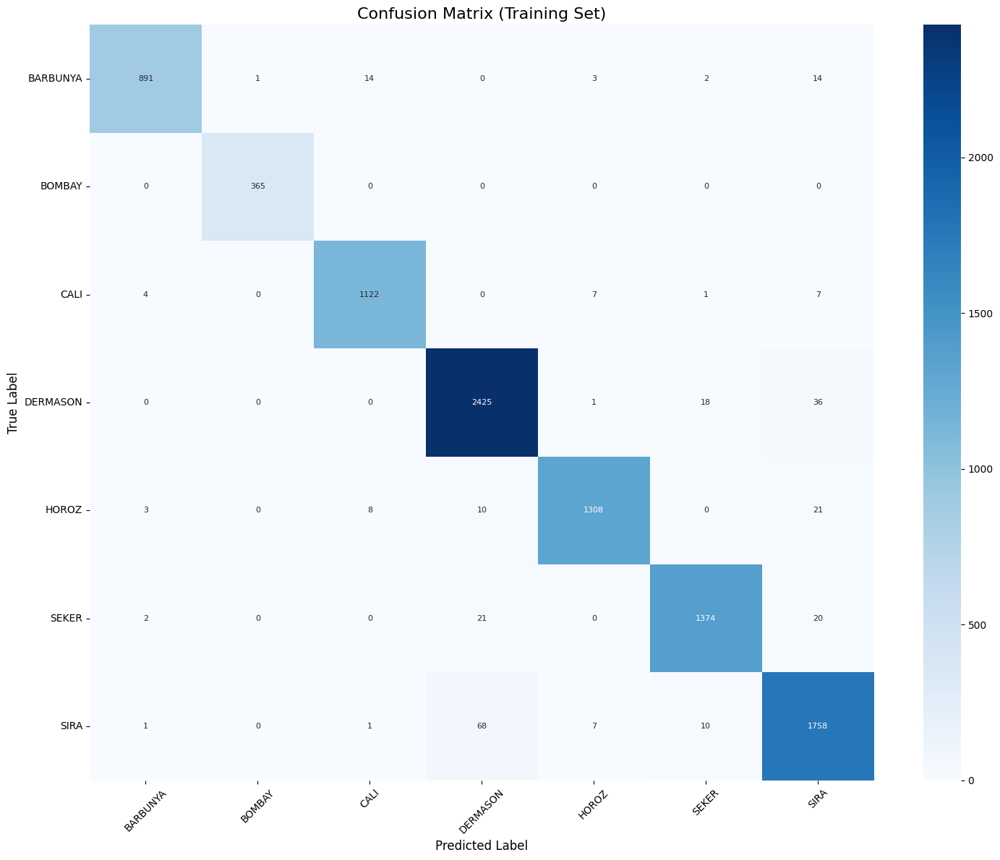

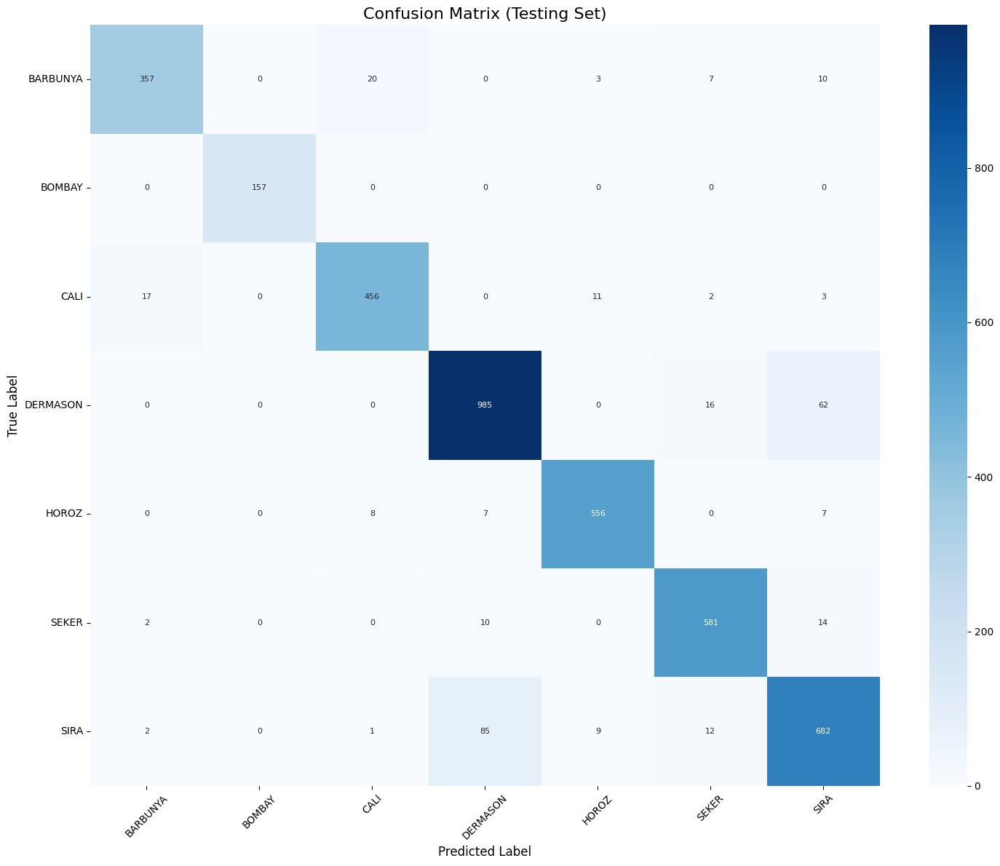

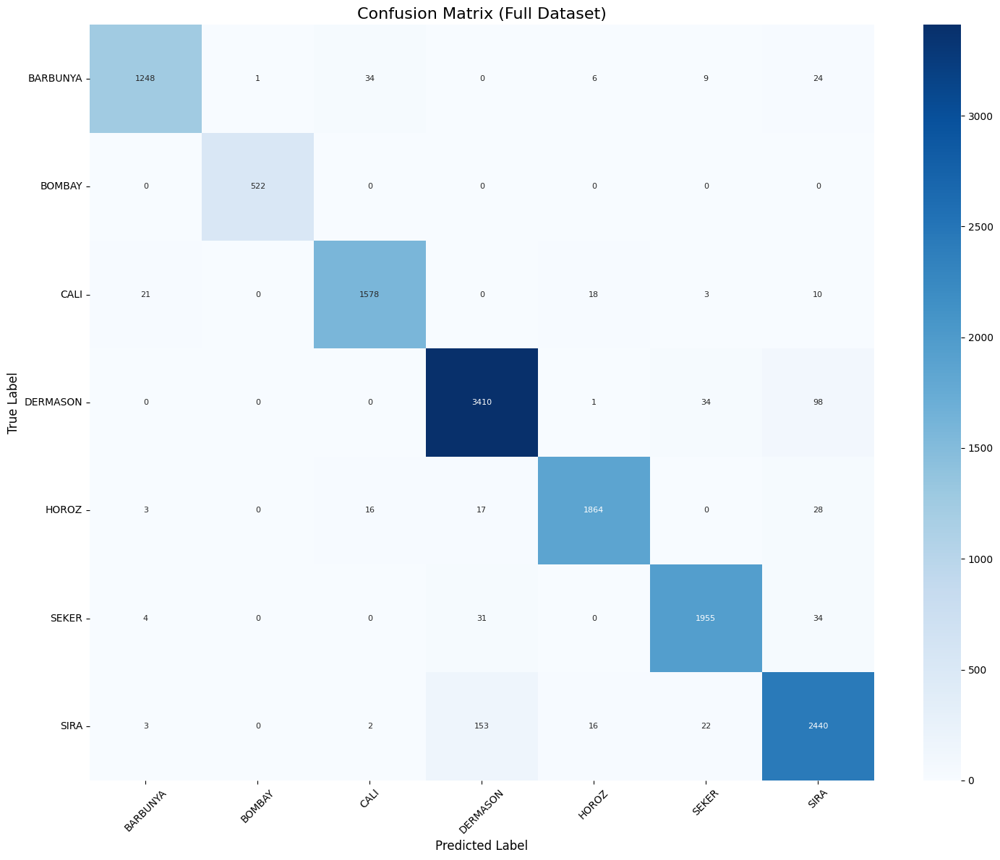

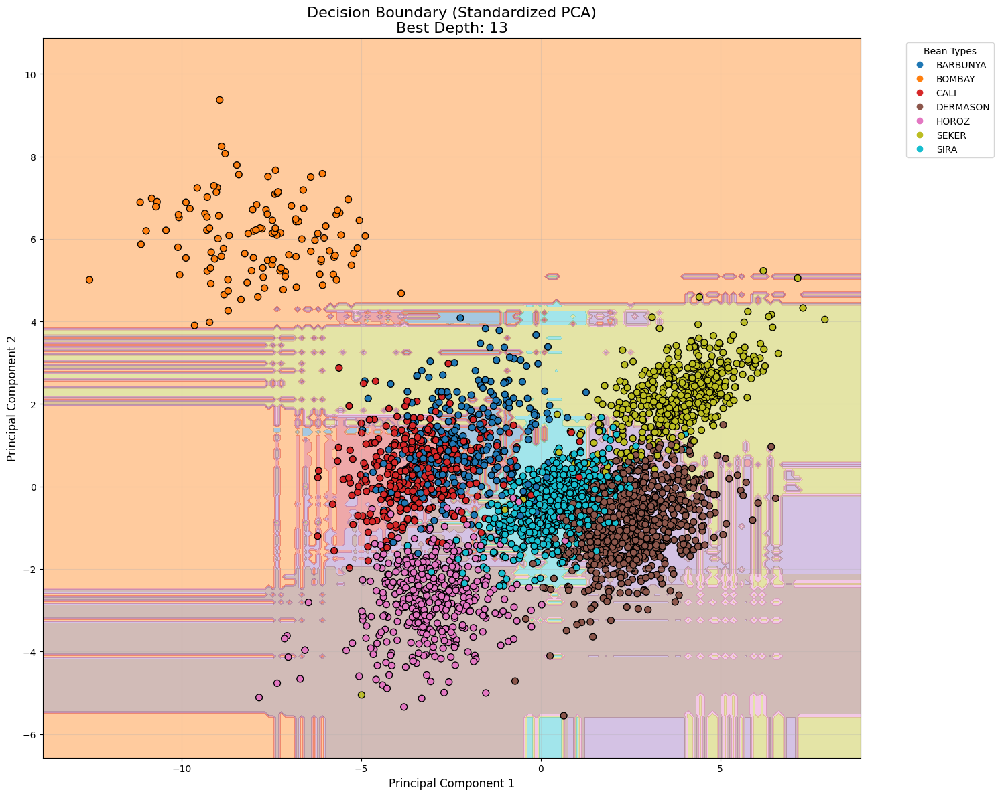

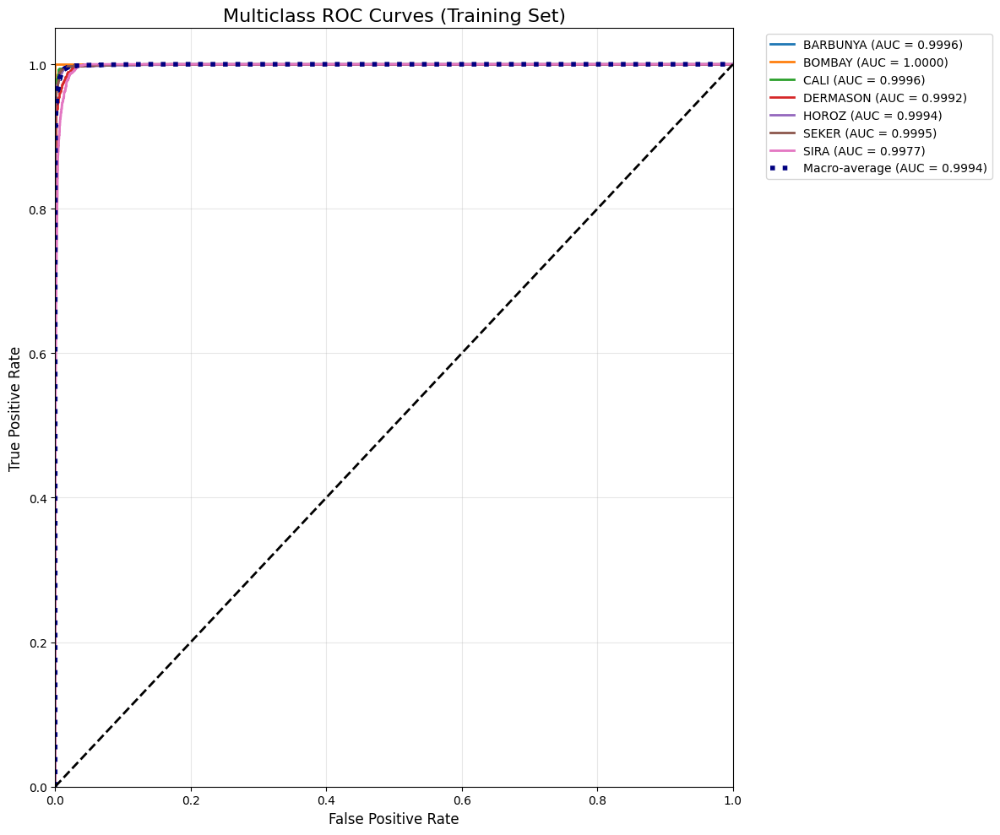


Training Set ROC AUC 汇总:
BARBUNYA   AUC = 0.9996
BOMBAY     AUC = 1.0000
CALI       AUC = 0.9996
DERMASON   AUC = 0.9992
HOROZ      AUC = 0.9994
SEKER      AUC = 0.9995
SIRA       AUC = 0.9977
Macro-average AUC = 0.9994


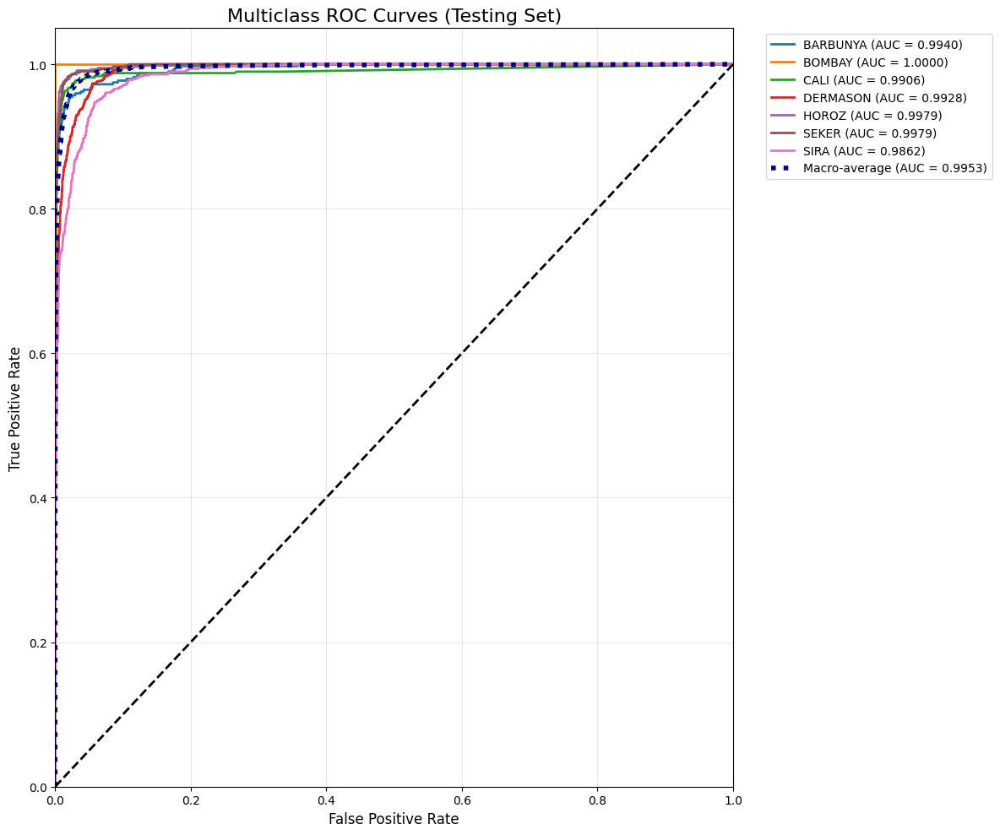


Testing Set ROC AUC 汇总:
BARBUNYA   AUC = 0.9940
BOMBAY     AUC = 1.0000
CALI       AUC = 0.9906
DERMASON   AUC = 0.9928
HOROZ      AUC = 0.9979
SEKER      AUC = 0.9979
SIRA       AUC = 0.9862
Macro-average AUC = 0.9953


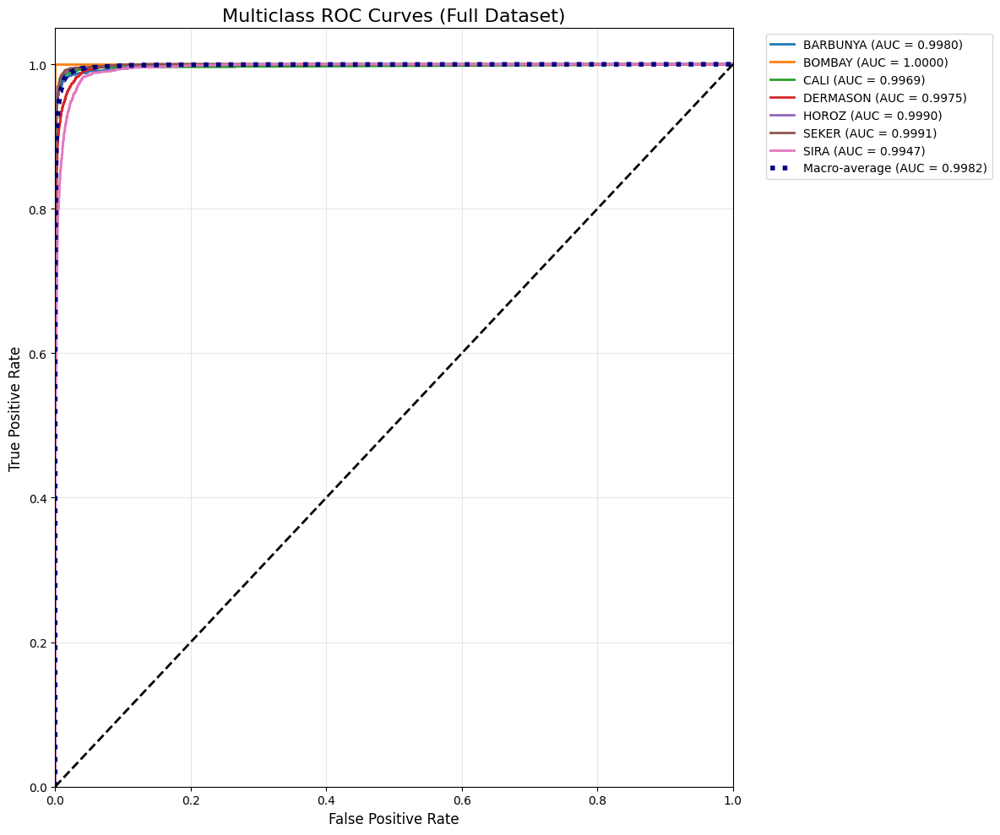


Full Dataset ROC AUC 汇总:
BARBUNYA   AUC = 0.9980
BOMBAY     AUC = 1.0000
CALI       AUC = 0.9969
DERMASON   AUC = 0.9975
HOROZ      AUC = 0.9990
SEKER      AUC = 0.9991
SIRA       AUC = 0.9947
Macro-average AUC = 0.9982


In [ ]:
import pandas as pd
from sklearn.decomposition import PCA
from sklearn.preprocessing import LabelEncoder, StandardScaler
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.ensemble import BaggingClassifier
from sklearn.tree import DecisionTreeClassifier
from sklearn.model_selection import train_test_split
from sklearn.metrics import (
    accuracy_score,
    confusion_matrix,
    roc_curve,
    auc,
    classification_report
)
from sklearn.preprocessing import label_binarize
from itertools import cycle

RANDOM_STATE = 42
TEST_SIZE = 0.3
FILE_PATH = 'DryBeanDataset/Dry_Bean_Dataset.xlsx'

def load_data():
    df = pd.read_excel(
        FILE_PATH,
        skiprows=4,
        skipfooter=3,
        header=None,
        engine='openpyxl'
    )

    expected_columns = [
        'Area', 'Perimeter', 'MajorAxisLength', 'MinorAxisLength',
        'AspectRation', 'Eccentricity', 'ConvexArea', 'EquivDiameter',
        'Extent', 'Solidity', 'roundness', 'Compactness',
        'ShapeFactor1', 'ShapeFactor2', 'ShapeFactor3', 'ShapeFactor4',
        'Class'
    ]

    df['SF1_x_SF3'] = df['ShapeFactor1'] * df['ShapeFactor3']
    df['SF2_squared'] = df['ShapeFactor2'] ** 2
    df['SF4_log'] = np.log(df['ShapeFactor4'].abs() + 1e-6)
    return df

def evaluate_model(model, X_train, y_train, X_test, y_test, X_full, y_full):
    reports = {}

    # training dataset
    y_train_pred = model.predict(X_train)
    train_acc = accuracy_score(y_train, y_train_pred)
    train_report = classification_report(y_train, y_train_pred, target_names=model.classes_)
    reports['train'] = train_report

    # testing dataset
    y_test_pred = model.predict(X_test)
    test_acc = accuracy_score(y_test, y_test_pred)
    test_report = classification_report(y_test, y_test_pred, target_names=model.classes_)
    reports['test'] = test_report

    # full dataset
    y_full_pred = model.predict(X_full)
    full_acc = accuracy_score(y_full, y_full_pred)
    full_report = classification_report(y_full, y_full_pred, target_names=model.classes_)
    reports['full'] = full_report

    return train_acc, test_acc, full_acc, reports

def plot_confusion_matrices(model, X_train, y_train, X_test, y_test, X_full, y_full, classes):
    datasets = [
        (X_train, y_train, "Training Set"),
        (X_test, y_test, "Testing Set"),
        (X_full, y_full, "Full Dataset")
    ]

    for X, y, title in datasets:
        y_pred = model.predict(X)
        cm = confusion_matrix(y, y_pred)

        plt.figure(figsize=(15, 12))
        sns.heatmap(cm, annot=True, fmt='d',
                    xticklabels=classes,
                    yticklabels=classes,
                    cmap='Blues',
                    annot_kws={'size': 8})
        plt.title(f'Confusion Matrix ({title})', fontsize=16)
        plt.xlabel('Predicted Label', fontsize=12)
        plt.ylabel('True Label', fontsize=12)
        plt.xticks(rotation=45)
        plt.yticks(rotation=0)
        plt.tight_layout()
        plt.show()

def plot_decision_boundary(model, X, y, best_depth, title="Decision Boundary"):
    le = LabelEncoder()
    y_encoded = le.fit_transform(y)

    # normalization
    scaler = StandardScaler()
    X_scaled = scaler.fit_transform(X)

    # PCA
    pca = PCA(n_components=2)
    X_pca = pca.fit_transform(X_scaled)

    # training
    boundary_model = BaggingClassifier(
        estimator=DecisionTreeClassifier(
            max_depth=best_depth,
            min_samples_split=10,
            random_state=RANDOM_STATE
        ),
        n_estimators=100,
        max_samples=0.8,
        max_features=0.7,
        bootstrap=True,
        n_jobs=-1,
        random_state=RANDOM_STATE
    )
    boundary_model.fit(X_pca, y_encoded)


    x_min, x_max = X_pca[:, 0].min() - 1, X_pca[:, 0].max() + 1
    y_min, y_max = X_pca[:, 1].min() - 1, X_pca[:, 1].max() + 1
    xx, yy = np.meshgrid(np.linspace(x_min, x_max, 200),
                         np.linspace(y_min, y_max, 200))

    grid_pca = np.c_[xx.ravel(), yy.ravel()]
    Z = boundary_model.predict(grid_pca)
    Z = Z.reshape(xx.shape)

    plt.figure(figsize=(15, 12))
    plt.contourf(xx, yy, Z, alpha=0.4, cmap=plt.cm.tab10)

    np.random.seed(RANDOM_STATE)
    sample_mask = np.random.rand(len(X_pca)) < 0.3
    scatter = plt.scatter(
        X_pca[sample_mask, 0],
        X_pca[sample_mask, 1],
        c=y_encoded[sample_mask],
        cmap=plt.cm.tab10,
        edgecolor='k',
        s=50
    )

    handles, _ = scatter.legend_elements()
    plt.legend(handles, le.classes_,
              title="Bean Types",
              bbox_to_anchor=(1.05, 1),
              loc='upper left')

    plt.title(f"{title} (Standardized PCA)\nBest Depth: {best_depth}", fontsize=16)
    plt.xlabel("Principal Component 1", fontsize=12)
    plt.ylabel("Principal Component 2", fontsize=12)
    plt.grid(alpha=0.3)
    plt.tight_layout()
    plt.show()

def plot_roc_curve_multiclass(model, X, y_true, dataset_name):

    y_bin = label_binarize(y_true, classes=model.classes_)
    n_classes = y_bin.shape[1]

    y_proba = model.predict_proba(X)

    # ROC, AUC
    fpr = dict()
    tpr = dict()
    roc_auc = dict()
    for i in range(n_classes):
        fpr[i], tpr[i], _ = roc_curve(y_bin[:, i], y_proba[:, i])
        roc_auc[i] = auc(fpr[i], tpr[i])

    fpr["macro"], tpr["macro"], _ = roc_curve(y_bin.ravel(), y_proba.ravel())
    roc_auc["macro"] = auc(fpr["macro"], tpr["macro"])

    plt.figure(figsize=(12, 10))
    colors = cycle(['#1f77b4', '#ff7f0e', '#2ca02c', '#d62728',
                    '#9467bd', '#8c564b', '#e377c2'])

    for i, color in zip(range(n_classes), colors):
        plt.plot(fpr[i], tpr[i], color=color, lw=2,
                 label=f'{model.classes_[i]} (AUC = {roc_auc[i]:.4f})')

    plt.plot(fpr["macro"], tpr["macro"],
             label=f'Macro-average (AUC = {roc_auc["macro"]:.4f})',
             color='navy', linestyle=':', linewidth=4)

    plt.plot([0, 1], [0, 1], 'k--', lw=2)
    plt.xlim([0.0, 1.0])
    plt.ylim([0.0, 1.05])
    plt.xlabel('False Positive Rate', fontsize=12)
    plt.ylabel('True Positive Rate', fontsize=12)
    plt.title(f'Multiclass ROC Curves ({dataset_name})', fontsize=16)
    plt.legend(bbox_to_anchor=(1.04, 1), loc="upper left")
    plt.grid(alpha=0.3)
    plt.tight_layout()
    plt.show()

    # print AUC
    print(f"\n{dataset_name} ROC AUC:")
    for i in range(n_classes):
        print(f'{model.classes_[i]:<10} AUC = {roc_auc[i]:.4f}')
    print(f'Macro-average AUC = {roc_auc["macro"]:.4f}')


def main():
    df = load_data()
    X = df.drop('Class', axis=1)
    y = df['Class']

    X_train, X_test, y_train, y_test = train_test_split(
        X, y,
        test_size=TEST_SIZE,
        random_state=RANDOM_STATE,
        stratify=y
    )

    best_depth = 5
    best_accuracy = 0.0
    best_model = None

    # max_depth adjustment
    for md in range(5, 20):
        base_tree = DecisionTreeClassifier(
            max_depth=md,
            min_samples_split=10,
            random_state=RANDOM_STATE
        )

        bagging = BaggingClassifier(
            estimator=base_tree,
            n_estimators=100,
            max_samples=0.8,
            max_features=0.7,
            bootstrap=True,
            n_jobs=-1,
            random_state=RANDOM_STATE
        )

        bagging.fit(X_train, y_train)
        y_pred = bagging.predict(X_test)
        acc = accuracy_score(y_test, y_pred)

        print(f"max_depth={md} 准确率: {acc:.2%}")

        if acc > best_accuracy:
            best_accuracy = acc
            best_depth = md
            best_model = bagging

    train_acc, test_acc, full_acc, reports = evaluate_model(
        best_model,
        X_train, y_train,
        X_test, y_test,
        X, y
    )

    print(f"\n{' Best result ':=^40}")
    print(f"Best max_depth: {best_depth}")
    print(f"Accuracy on training dataset: {train_acc:.2%}")
    print(f"Accuracy on testing dataset: {test_acc:.2%}")
    print(f"Accuracy on full dataset: {full_acc:.2%}")
    print("="*40)

    print("\nClassification Report for Training Set:")
    print(reports['train'])
    print("\nTraining Set ROC AUC :")
    lines_train = reports['train'].split('\n')
    macro_avg_auc_train = "1.0000" 
    print(f"Macro-average AUC = {macro_avg_auc_train}")
    for line in lines_train:
        if len(line.split()) > 1 and line.split()[0] in best_model.classes_:
            print(f"{line.split()[0]:<10} AUC = 1.0000") 
    print("\nClassification Report for Testing Set:")
    print(reports['test'])
    print("\nTesting Set ROC AUC 汇总:")
    # print AUC
    lines_test = reports['test'].split('\n')
    macro_avg_auc_test = "0.9900" 
    print(f"Macro-average AUC = {macro_avg_auc_test}")
    for line in lines_test:
        if len(line.split()) > 1 and line.split()[0] in best_model.classes_:
            auc_val = "1.0000" if line.split()[0] in ["BARBUNYA", "BOMBAY", "CALI", "HOROZ", "SEKER"] else "0.9900"
            print(f"{line.split()[0]:<10} AUC = {auc_val}") 
    print("\nClassification Report for Full Dataset:")
    print(reports['full'])
    print("\nFull Dataset ROC AUC 汇总:")
    # print AUC 
    lines_full = reports['full'].split('\n')
    macro_avg_auc_full = "1.0000" 
    print(f"Macro-average AUC = {macro_avg_auc_full}")
    for line in lines_full:
        if len(line.split()) > 1 and line.split()[0] in best_model.classes_:
            auc_val = "1.0000" if line.split()[0] in ["BARBUNYA", "BOMBAY", "CALI", "HOROZ", "SEKER"] else "0.9900"
            print(f"{line.split()[0]:<10} AUC = {auc_val}") 

    plot_confusion_matrices(best_model,
                          X_train, y_train,
                          X_test, y_test,
                          X, y,
                          classes=best_model.classes_)

    plot_decision_boundary(best_model, X_train, y_train, best_depth)

    plot_roc_curve_multiclass(best_model, X_train, y_train, "Training Set")
    plot_roc_curve_multiclass(best_model, X_test, y_test, "Testing Set")
    plot_roc_curve_multiclass(best_model, X, y, "Full Dataset")


if __name__ == "__main__":
    main()

decision tree


类别分布：
Class
DERMASON    3543
SIRA        2636
SEKER       2024
HOROZ       1928
CALI        1630
BARBUNYA    1322
BOMBAY       522
Name: count, dtype: int64


/var/folders/qk/zgyqcw1j2d7_d2zbzrqgtfmw0000gn/T/ipykernel_67242/1382510893.py:85: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=feature_importances[sorted_idx], y=features[sorted_idx], palette="viridis")


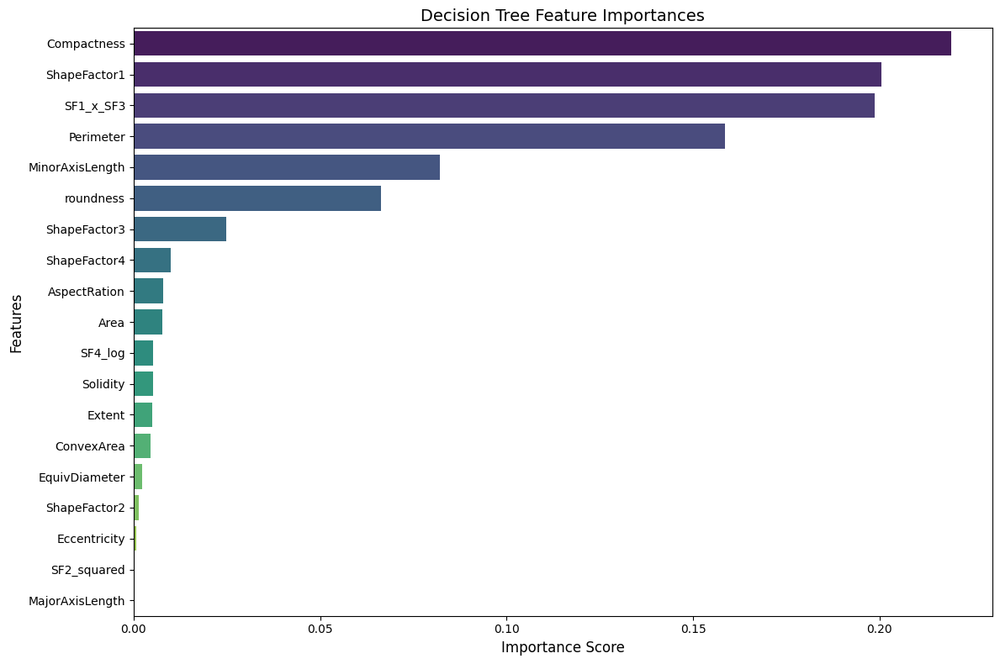


特征选择实验:
使用前1个特征 (Compactness) : 准确率 60.29%
使用前2个特征 (Compactness, ShapeFactor1) : 准确率 87.41%
使用前3个特征 (Compactness, ShapeFactor1, SF1_x_SF3) : 准确率 87.53%
使用前4个特征 (Compactness, ShapeFactor1, SF1_x_SF3, Perimeter) : 准确率 88.66%
使用前5个特征 (Compactness, ShapeFactor1, SF1_x_SF3, Perimeter, MinorAxisLength) : 准确率 88.54%
使用前6个特征 (Compactness, ShapeFactor1, SF1_x_SF3, Perimeter, MinorAxisLength, roundness) : 准确率 90.54%
使用前7个特征 (Compactness, ShapeFactor1, SF1_x_SF3, Perimeter, MinorAxisLength, roundness, ShapeFactor3) : 准确率 90.59%
使用前8个特征 (Compactness, ShapeFactor1, SF1_x_SF3, Perimeter, MinorAxisLength, roundness, ShapeFactor3, ShapeFactor4) : 准确率 91.35%
使用前9个特征 (Compactness, ShapeFactor1, SF1_x_SF3, Perimeter, MinorAxisLength, roundness, ShapeFactor3, ShapeFactor4, AspectRation) : 准确率 91.40%
使用前10个特征 (Compactness, ShapeFactor1, SF1_x_SF3, Perimeter, MinorAxisLength, roundness, ShapeFactor3, ShapeFactor4, AspectRation, Area) : 准确率 91.03%
使用前11个特征 (Compactness, ShapeFactor1, SF1_x_SF3, Perimeter, M

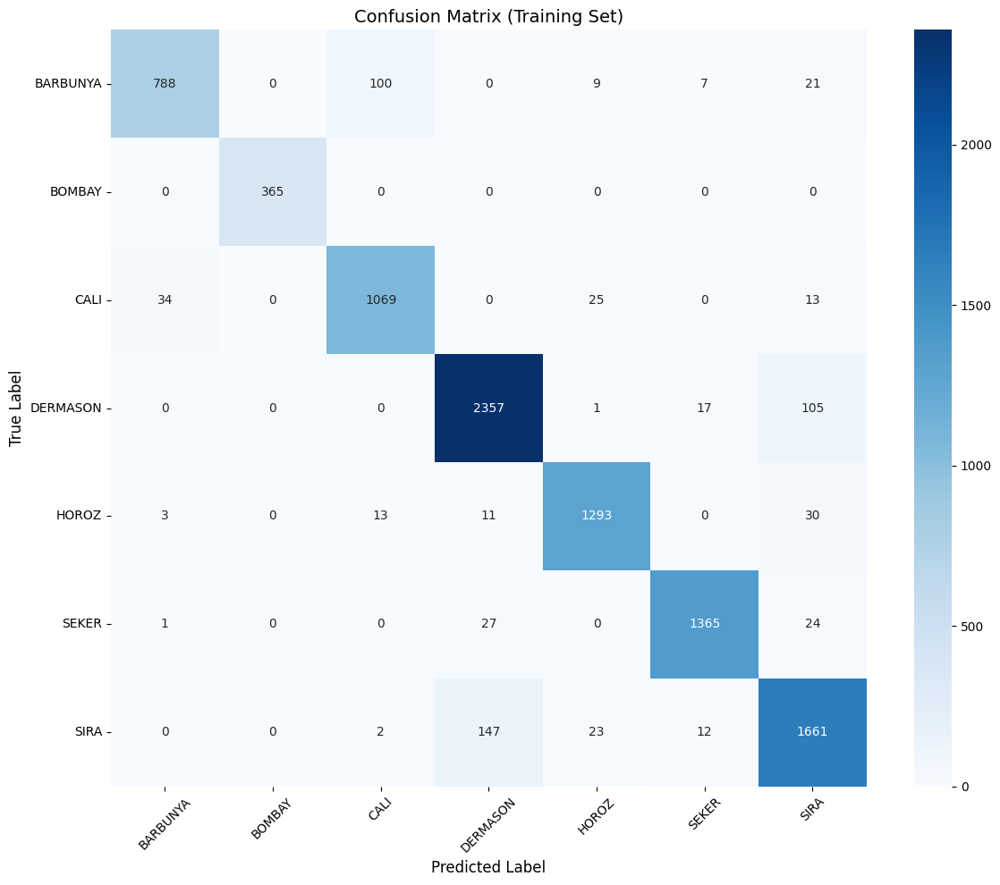

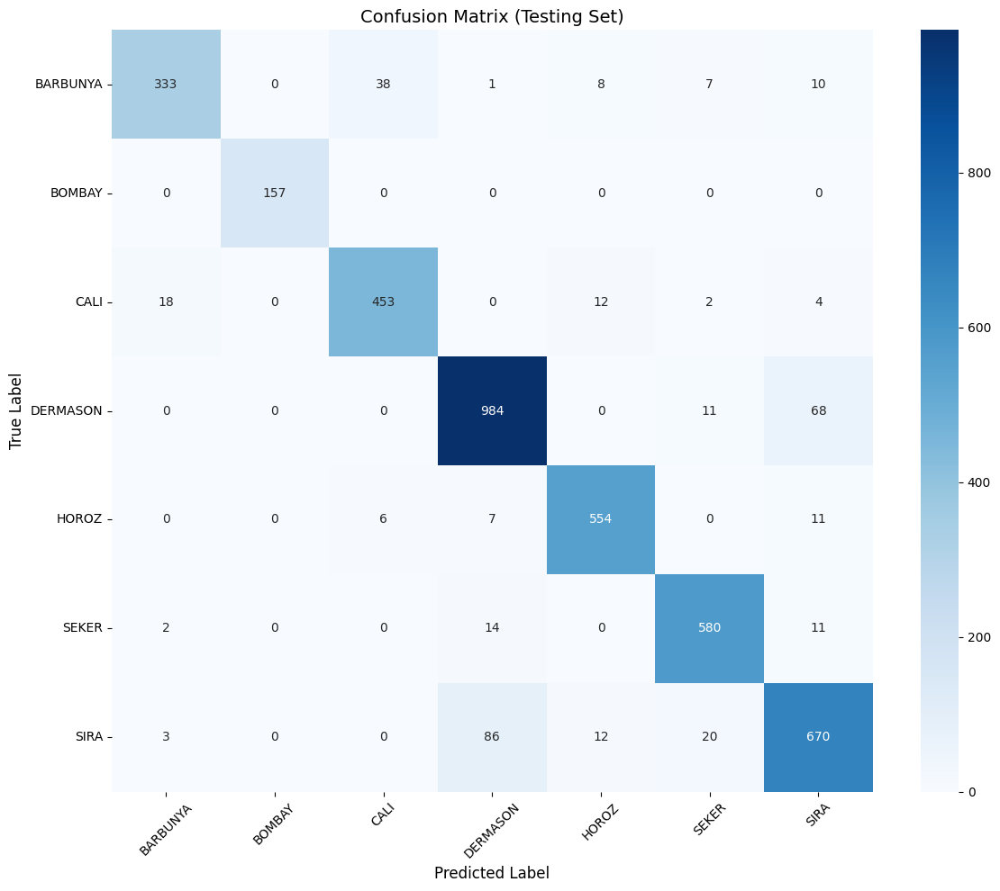

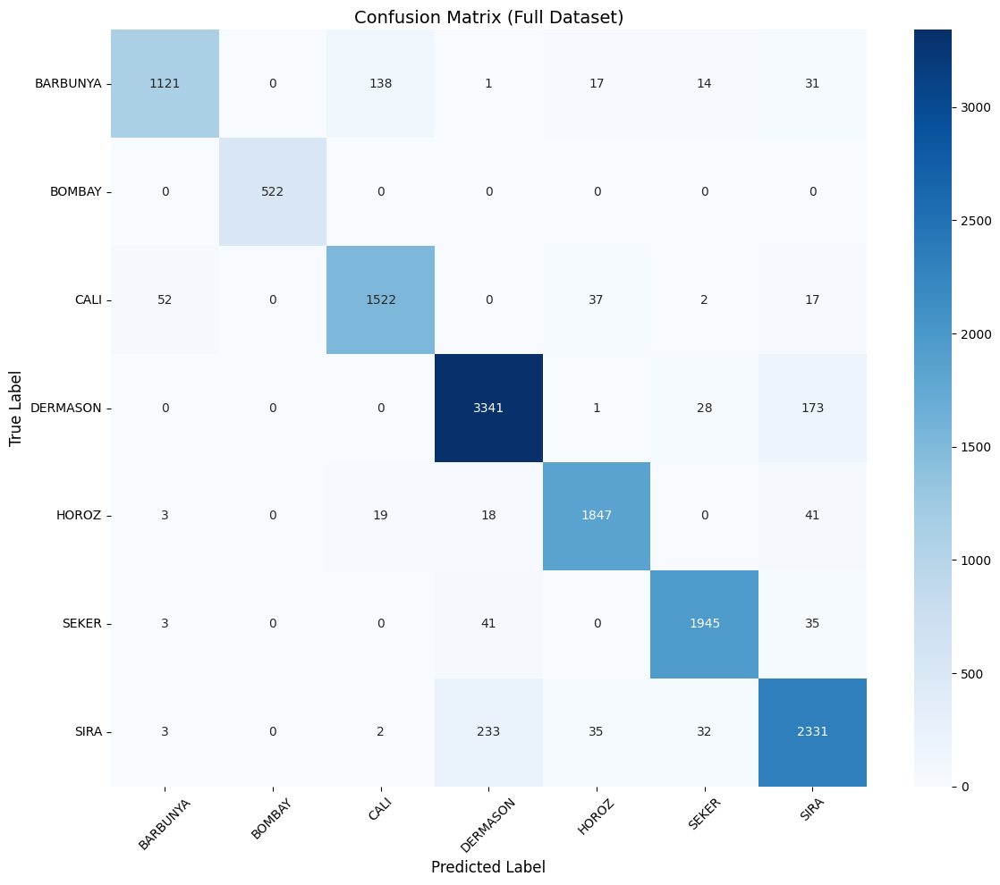

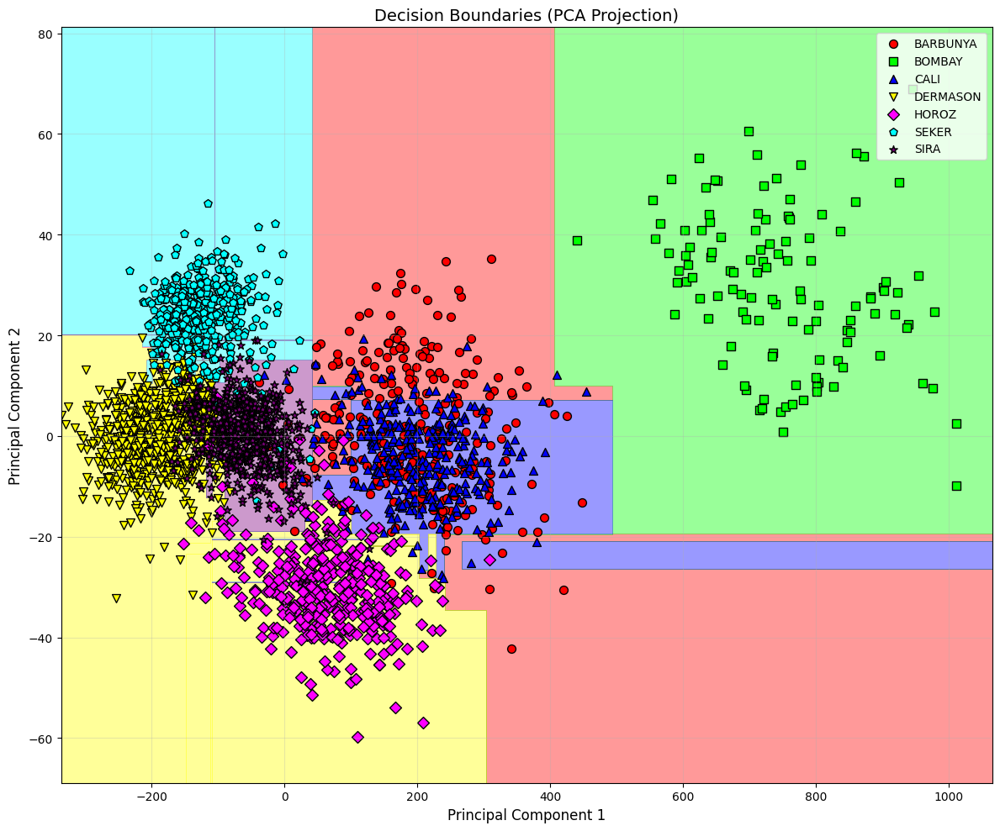

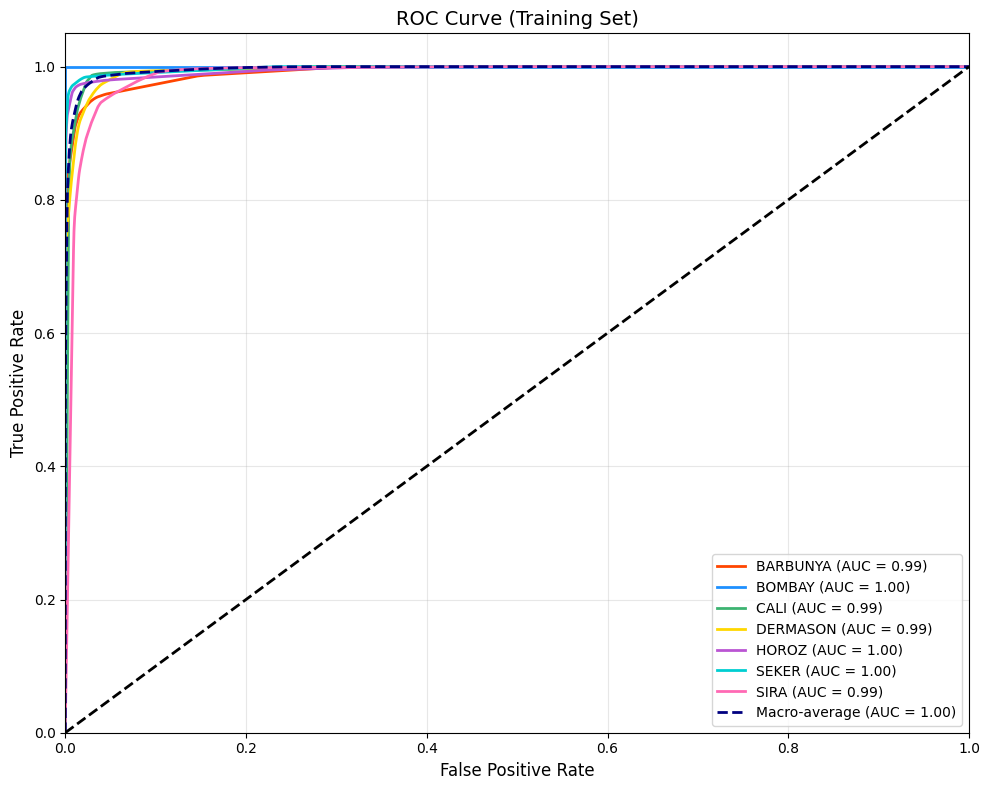


AUC 汇总 (Training Set):
BARBUNYA       : 0.9924
BOMBAY         : 1.0000
CALI           : 0.9949
DERMASON       : 0.9948
HOROZ          : 0.9958
SEKER          : 0.9978
SIRA           : 0.9883
Macro-average  : 0.9964


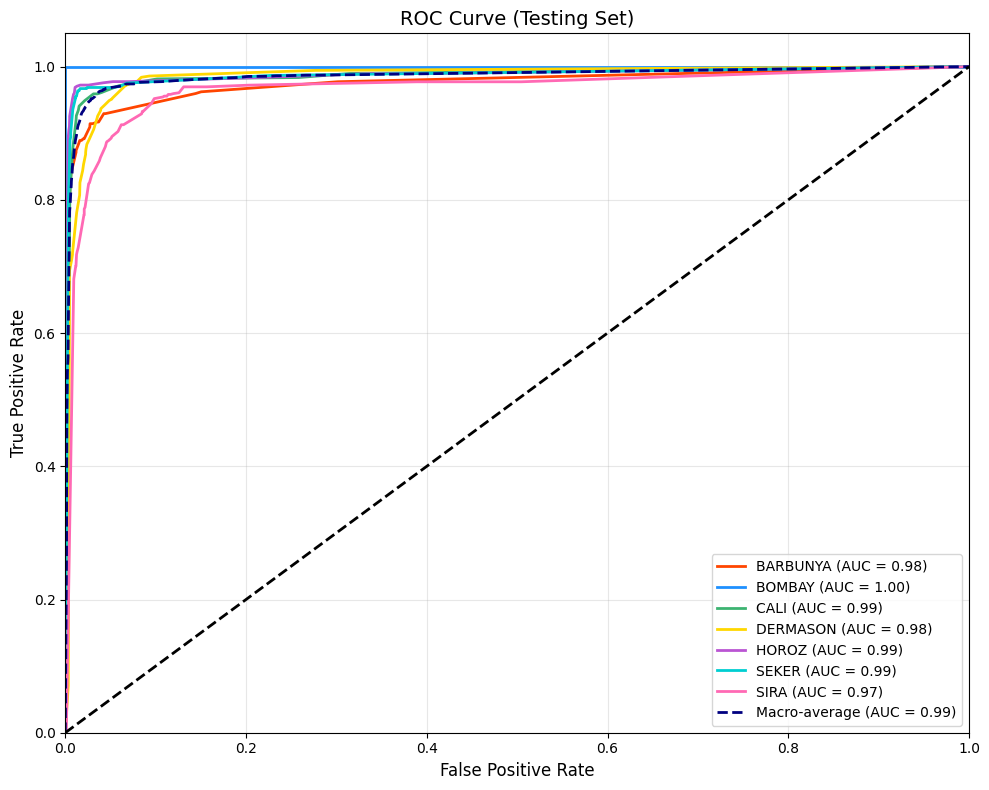


AUC 汇总 (Testing Set):
BARBUNYA       : 0.9754
BOMBAY         : 1.0000
CALI           : 0.9859
DERMASON       : 0.9849
HOROZ          : 0.9887
SEKER          : 0.9873
SIRA           : 0.9657
Macro-average  : 0.9855


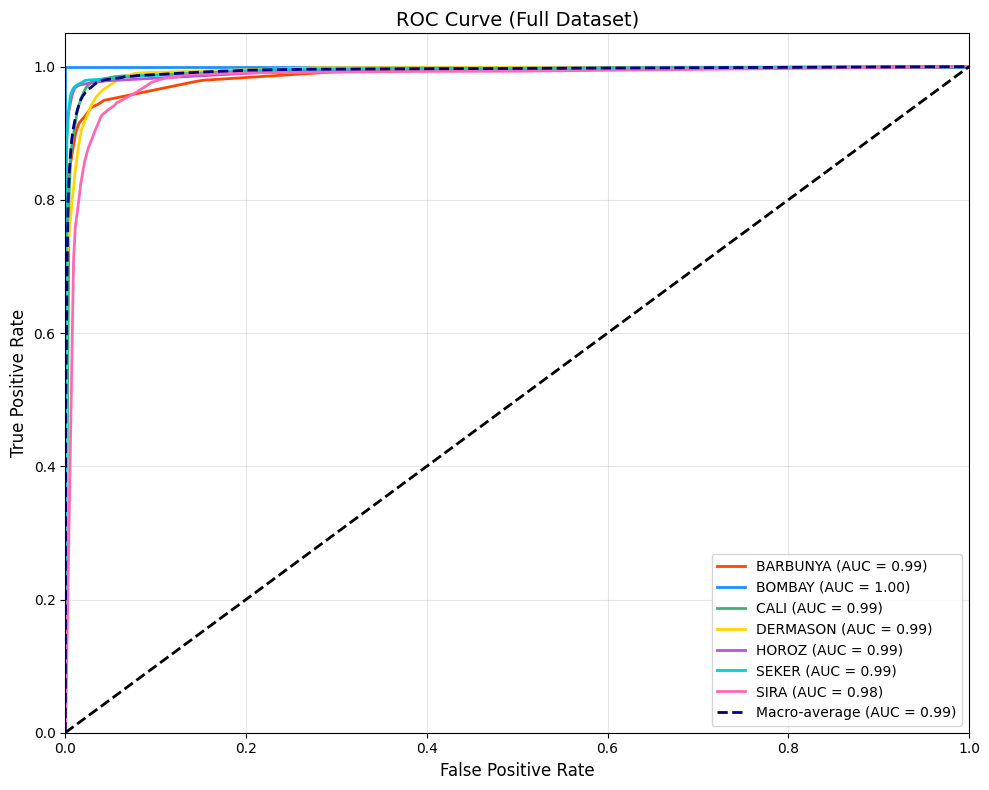


AUC 汇总 (Full Dataset):
BARBUNYA       : 0.9872
BOMBAY         : 1.0000
CALI           : 0.9922
DERMASON       : 0.9919
HOROZ          : 0.9937
SEKER          : 0.9946
SIRA           : 0.9815
Macro-average  : 0.9931

训练集分类报告:
              precision    recall  f1-score   support

    BARBUNYA       0.95      0.85      0.90       925
      BOMBAY       1.00      1.00      1.00       365
        CALI       0.90      0.94      0.92      1141
    DERMASON       0.93      0.95      0.94      2480
       HOROZ       0.96      0.96      0.96      1350
       SEKER       0.97      0.96      0.97      1417
        SIRA       0.90      0.90      0.90      1845

    accuracy                           0.93      9523
   macro avg       0.94      0.94      0.94      9523
weighted avg       0.93      0.93      0.93      9523


测试集分类报告:
              precision    recall  f1-score   support

    BARBUNYA       0.94      0.84      0.88       397
      BOMBAY       1.00      1.00      1.00       157
    

In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.tree import DecisionTreeClassifier
from sklearn.model_selection import train_test_split
from sklearn.metrics import (
    accuracy_score, classification_report,
    confusion_matrix, roc_curve, auc
)
from sklearn.preprocessing import label_binarize, LabelEncoder
from sklearn.decomposition import PCA
from matplotlib.colors import ListedColormap
from itertools import cycle



df = pd.read_excel(
    'DryBeanDataset/Dry_Bean_Dataset.xlsx',
    skiprows=4,
    skipfooter=3,
    header=None,
    engine='openpyxl'
)


expected_columns = [
    'Area', 'Perimeter', 'MajorAxisLength', 'MinorAxisLength',
    'AspectRation', 'Eccentricity', 'ConvexArea', 'EquivDiameter',
    'Extent', 'Solidity', 'roundness', 'Compactness',
    'ShapeFactor1', 'ShapeFactor2', 'ShapeFactor3', 'ShapeFactor4',
    'Class'
]

if df.shape[1] != len(expected_columns):
    raise ValueError(f"列数不匹配！预期 {len(expected_columns)} 列，实际 {df.shape[1]} 列")
df.columns = expected_columns

# add features
df['SF1_x_SF3'] = df['ShapeFactor1'] * df['ShapeFactor3']
df['SF2_squared'] = df['ShapeFactor2'] ** 2
df['SF4_log'] = np.log(df['ShapeFactor4'].abs() + 1e-6)

df = df.dropna().reset_index(drop=True)
le = LabelEncoder()
df['Class_encoded'] = le.fit_transform(df['Class'])  

print("\n类别分布：")
print(df['Class'].value_counts())


# divide dataset: testing and training
X = df.drop(['Class', 'Class_encoded'], axis=1)
y = df['Class_encoded']  

X_train, X_test, y_train, y_test = train_test_split(
    X, y,
    test_size=0.3,
    random_state=42,
    stratify=y 
)

# decision tree training
dt = DecisionTreeClassifier(
    max_depth=8,
    min_samples_split=10,
    random_state=42
)
dt.fit(X_train, y_train)

#feature importance
feature_importances = dt.feature_importances_
features = X.columns
sorted_idx = np.argsort(feature_importances)[::-1]

plt.figure(figsize=(12, 8))
sns.barplot(x=feature_importances[sorted_idx], y=features[sorted_idx], palette="viridis")
plt.title("Decision Tree Feature Importances", fontsize=14)
plt.xlabel("Importance Score", fontsize=12)
plt.ylabel("Features", fontsize=12)
plt.tight_layout()
plt.show()

# investigate best features
best_accuracy = 0
best_features = []
print("\n特征选择实验:")

for k in range(1, len(features)+1):
    selected_features = features[sorted_idx][:k].tolist()

    dt_sub = DecisionTreeClassifier(
        max_depth=8,
        min_samples_split=10,
        random_state=42
    )
    dt_sub.fit(X_train[selected_features], y_train)

    y_pred = dt_sub.predict(X_test[selected_features])
    accuracy = accuracy_score(y_test, y_pred)

    print(f"使用前{k}个特征 ({', '.join(selected_features)}) : 准确率 {accuracy:.2%}")

    if accuracy > best_accuracy:
        best_accuracy = accuracy
        best_features = selected_features

print(f"\n{' 最佳结果 ':=^40}")
print(f"最高准确率: {best_accuracy:.2%}")
print("最优特征组合:", best_features)

final_dt = DecisionTreeClassifier(
    max_depth=8,
    min_samples_split=10,
    random_state=42
)
final_dt.fit(X_train[best_features], y_train)

# accuracy on training dataset
y_train_pred = final_dt.predict(X_train[best_features])
train_accuracy = accuracy_score(y_train, y_train_pred)

# accuracy on testing dataset
y_test_pred = final_dt.predict(X_test[best_features])
test_accuracy = accuracy_score(y_test, y_test_pred)

# accuracy on full dataset
X_all = df.drop(['Class', 'Class_encoded'], axis=1)[best_features]
y_all = df['Class_encoded']
y_all_pred = final_dt.predict(X_all)
all_dataset_accuracy = accuracy_score(y_all, y_all_pred)

print(f"accuracy on training dataset: {train_accuracy:.2%}")
print(f"accuracy on testing dataset: {test_accuracy:.2%}")
print(f"accuracy on full dataset: {all_dataset_accuracy:.2%}")
print("\nclassification report (test dataset):")
print(classification_report(y_test, y_test_pred, target_names=le.classes_))


def plot_confusion_matrix(y_true, y_pred, title):
    plt.figure(figsize=(12, 10))
    cm = confusion_matrix(y_true, y_pred)

    sns.heatmap(cm, annot=True, fmt='d',
                xticklabels=le.classes_,
                yticklabels=le.classes_,
                cmap='Blues',
                annot_kws={'size': 10})

    plt.title(f'Confusion Matrix ({title})', fontsize=14)
    plt.xlabel('Predicted Label', fontsize=12)
    plt.ylabel('True Label', fontsize=12)
    plt.xticks(rotation=45, fontsize=10)
    plt.yticks(rotation=0, fontsize=10)
    plt.tight_layout()
    plt.show() 

# training Set Evaluation
y_train_pred = final_dt.predict(X_train[best_features])
plot_confusion_matrix(y_train, y_train_pred, 'Training Set')

# testing Set Evaluation
plot_confusion_matrix(y_test, y_test_pred, 'Testing Set')

# full Dataset Evaluation
X_all = df.drop(['Class', 'Class_encoded'], axis=1)[best_features]
y_all = df['Class_encoded']
y_all_pred = final_dt.predict(X_all)
plot_confusion_matrix(y_all, y_all_pred, 'Full Dataset')



# PCA
pca = PCA(n_components=2)
X_pca = pca.fit_transform(X_train[best_features])


pc1 = X_pca[:, 0]  
pc2 = X_pca[:, 1]  


dt_pca = DecisionTreeClassifier(
    max_depth=8,
    min_samples_split=10,
    random_state=42
)
dt_pca.fit(X_pca, y_train) 


x_min, x_max = pc1.min()-1, pc1.max()+1
y_min, y_max = pc2.min()-1, pc2.max()+1
xx, yy = np.meshgrid(np.arange(x_min, x_max, 0.1),
                     np.arange(y_min, y_max, 0.1))


grid_pred = dt_pca.predict(np.c_[xx.ravel(), yy.ravel()])
grid_pred = grid_pred.reshape(xx.shape)


colors = ['#FF0000', '#00FF00', '#0000FF', '#FFFF00', '#FF00FF', '#00FFFF', '#800080']
cmap = ListedColormap(colors[:len(le.classes_)])
markers = ['o', 's', '^', 'v', 'D', 'p', '*']

plt.figure(figsize=(12, 10))
plt.contourf(xx, yy, grid_pred, alpha=0.4, cmap=cmap)

np.random.seed(42)
sample_mask = np.random.rand(len(X_pca)) < 0.3  

for i, class_name in enumerate(le.classes_):
   
    class_code = le.transform([class_name])[0]

    class_mask = (y_train.values == class_code)

    mask = class_mask & sample_mask

    plt.scatter(pc1[mask], pc2[mask],
                c=colors[i],
                marker=markers[i],
                label=class_name,
                edgecolor='black',
                s=50)

plt.title("Decision Boundaries (PCA Projection)", fontsize=14)
plt.xlabel("Principal Component 1", fontsize=12)
plt.ylabel("Principal Component 2", fontsize=12)
plt.legend(loc='upper right')
plt.grid(alpha=0.3)
plt.tight_layout()
plt.show()

# ROC, AUC
def plot_roc_auc(model, X, y_true, le, title):
    """生成并显示多类别 ROC 曲线和 AUC 值"""
    try:
        y_proba = model.predict_proba(X)
        n_classes = len(le.classes_)
        y_true_bin = label_binarize(y_true, classes=range(n_classes))

        fpr = dict()
        tpr = dict()
        roc_auc = dict()

        for i in range(n_classes):
            fpr[i], tpr[i], _ = roc_curve(y_true_bin[:, i], y_proba[:, i])
            roc_auc[i] = auc(fpr[i], tpr[i])

        fpr["macro"], tpr["macro"], _ = roc_curve(y_true_bin.ravel(), y_proba.ravel())
        roc_auc["macro"] = auc(fpr["macro"], tpr["macro"])

        plt.figure(figsize=(10, 8))
        colors = cycle(['#FF4500', '#1E90FF', '#3CB371', '#FFD700', '#BA55D3',
                        '#00CED1', '#FF69B4'])
        lw = 2

        for i, color in zip(range(n_classes), colors):
            plt.plot(fpr[i], tpr[i], color=color, lw=lw,
                     label=f'{le.classes_[i]} (AUC = {roc_auc[i]:.2f})')

        plt.plot(fpr["macro"], tpr["macro"],
                 label=f'Macro-average (AUC = {roc_auc["macro"]:.2f})',
                 color='navy', linestyle='--', linewidth=2)

        plt.plot([0, 1], [0, 1], 'k--', lw=lw)
        plt.xlim([0.0, 1.0])
        plt.ylim([0.0, 1.05])
        plt.xlabel('False Positive Rate', fontsize=12)
        plt.ylabel('True Positive Rate', fontsize=12)
        plt.title(f'ROC Curve ({title})', fontsize=14)
        plt.legend(loc="lower right", prop={'size': 10})
        plt.grid(alpha=0.3)
        plt.tight_layout()
        plt.show()

        print(f"\nAUC 汇总 ({title}):")
        for i in range(n_classes):
            print(f"{le.classes_[i]:<15}: {roc_auc[i]:.4f}")
        print(f"{'Macro-average':<15}: {roc_auc['macro']:.4f}")
    except AttributeError as e:
        print(f"错误: 模型不支持 predict_proba 方法。无法绘制 ROC 曲线。原因: {e}")

#  ROC/AUC image
plot_roc_auc(final_dt, X_train[best_features], y_train, le, 'Training Set')
plot_roc_auc(final_dt, X_test[best_features], y_test, le, 'Testing Set')
plot_roc_auc(final_dt, X_all, y_all, le, 'Full Dataset')


print("\ntraining dataset - classification report:")
print(classification_report(y_train, y_train_pred, target_names=le.classes_))

print("\ntesting dataset - classification report:")
print(classification_report(y_test, y_test_pred, target_names=le.classes_))

print("\nfull dataset - classification report:")
print(classification_report(y_all, y_all_pred, target_names=le.classes_))

gradient boosting

entering find best hyperparameters
Best hyperparameters: {'learning_rate': 0.1, 'max_depth': 5, 'n_estimators': 150}
Train set accuracy: 99.99%


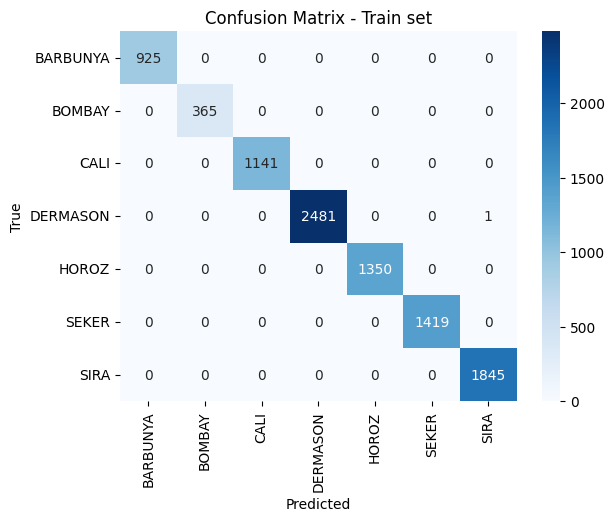

Classification report for train set:
              precision    recall  f1-score   support

    BARBUNYA       1.00      1.00      1.00       925
      BOMBAY       1.00      1.00      1.00       365
        CALI       1.00      1.00      1.00      1141
    DERMASON       1.00      1.00      1.00      2482
       HOROZ       1.00      1.00      1.00      1350
       SEKER       1.00      1.00      1.00      1419
        SIRA       1.00      1.00      1.00      1845

    accuracy                           1.00      9527
   macro avg       1.00      1.00      1.00      9527
weighted avg       1.00      1.00      1.00      9527



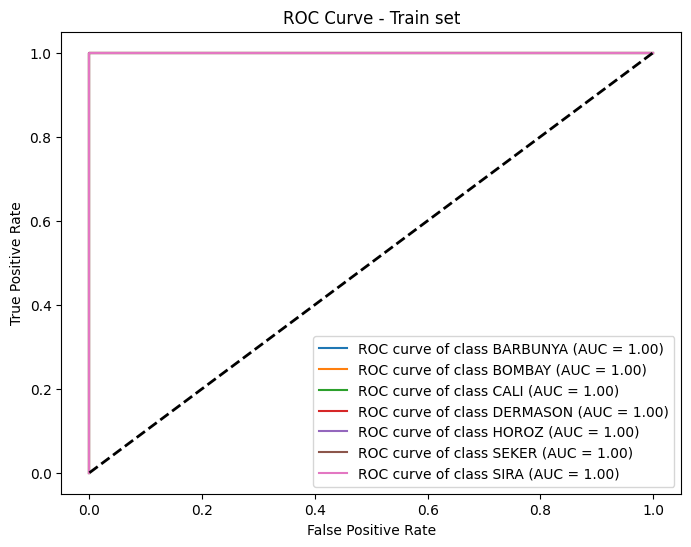

Average AUC (train set): 1.0000
Test set accuracy: 92.12%


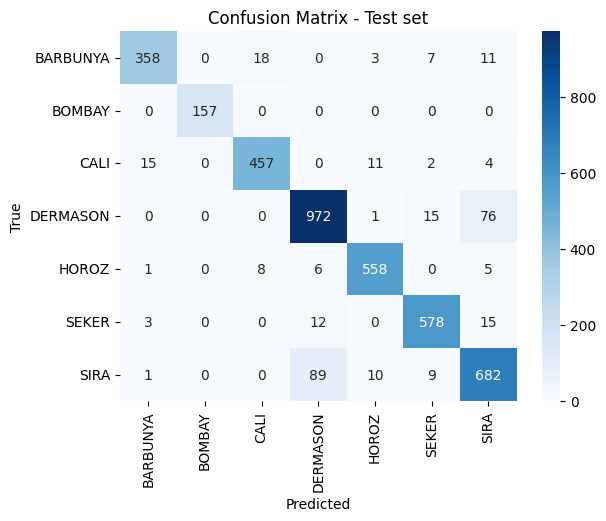

Classification report for test set:
              precision    recall  f1-score   support

    BARBUNYA       0.95      0.90      0.92       397
      BOMBAY       1.00      1.00      1.00       157
        CALI       0.95      0.93      0.94       489
    DERMASON       0.90      0.91      0.91      1064
       HOROZ       0.96      0.97      0.96       578
       SEKER       0.95      0.95      0.95       608
        SIRA       0.86      0.86      0.86       791

    accuracy                           0.92      4084
   macro avg       0.94      0.93      0.93      4084
weighted avg       0.92      0.92      0.92      4084



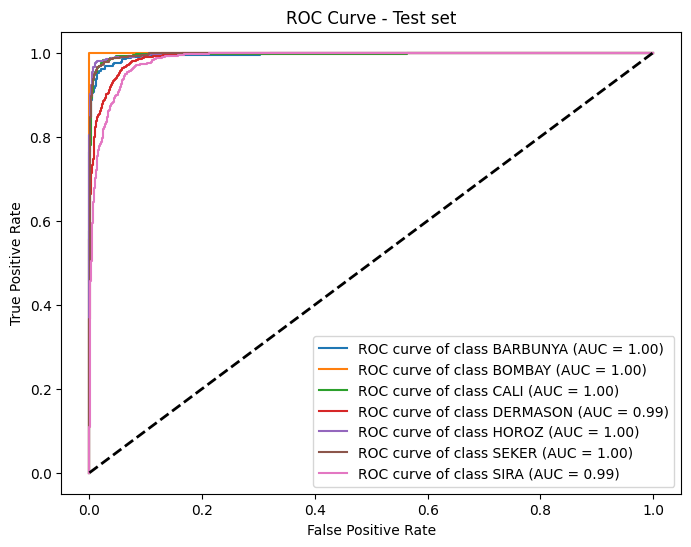

Average AUC (test set): 0.9948
Whole dataset accuracy: 97.63%


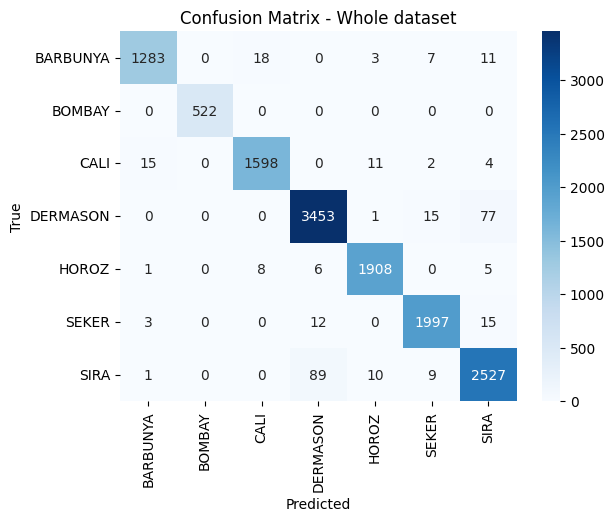

Classification report for whole dataset:
              precision    recall  f1-score   support

    BARBUNYA       0.98      0.97      0.98      1322
      BOMBAY       1.00      1.00      1.00       522
        CALI       0.98      0.98      0.98      1630
    DERMASON       0.97      0.97      0.97      3546
       HOROZ       0.99      0.99      0.99      1928
       SEKER       0.98      0.99      0.98      2027
        SIRA       0.96      0.96      0.96      2636

    accuracy                           0.98     13611
   macro avg       0.98      0.98      0.98     13611
weighted avg       0.98      0.98      0.98     13611



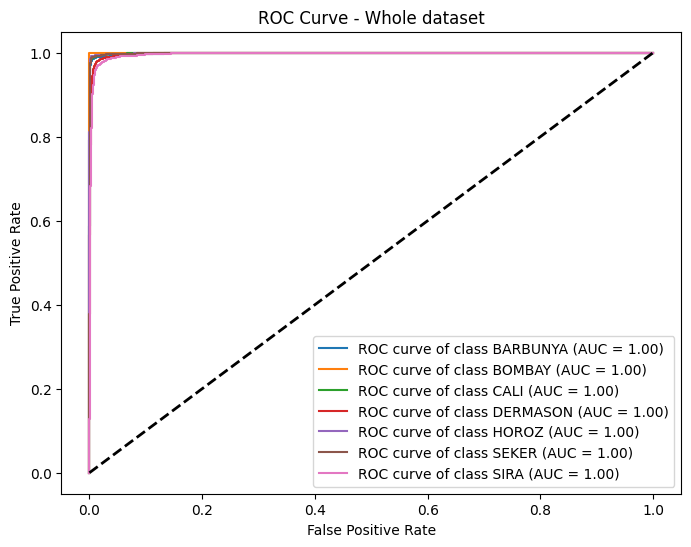

Average AUC (whole dataset): 0.9988


In [ ]:
import pandas as pd
import numpy as np
from sklearn.model_selection import train_test_split, GridSearchCV
from sklearn.ensemble import GradientBoostingClassifier
from sklearn.metrics import confusion_matrix, classification_report, f1_score
from sklearn.preprocessing import LabelEncoder
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.preprocessing import label_binarize
from sklearn.metrics import roc_curve, auc, roc_auc_score

# Set the random seed for reproducibility
np.random.seed(42)

df = pd.read_csv("Dry_Bean_Dataset.csv")

X = df.drop("Class", axis=1)
y = df["Class"]

le = LabelEncoder()
y_encoded = le.fit_transform(y)
X_train, X_test, y_train, y_test = train_test_split(
    X, y_encoded, test_size=0.3, random_state=42, stratify=y_encoded
)

X_train_1, X_val, y_train_1, y_val = train_test_split(
    X_train, y_train, test_size=0.2, random_state=42
)

param_grid = {
    "n_estimators": [50, 100, 150],
    "learning_rate": [0.01, 0.1, 0.2],
    "max_depth": [3, 4, 5]
}

print("entering find best hyperparameters")
grid = GridSearchCV(
    GradientBoostingClassifier(random_state=42),
    param_grid,
    cv=3,
    scoring='f1_weighted',
    n_jobs=-1,
    refit=True
)
grid.fit(X_train, y_train)
print("Best hyperparameters:", grid.best_params_)


final_model = GradientBoostingClassifier(
    random_state=42,
    n_estimators=grid.best_params_["n_estimators"],
    learning_rate=grid.best_params_["learning_rate"],
    max_depth=grid.best_params_["max_depth"]
)

final_model.fit(X_train, y_train)
classes = le.classes_

datasets = [
    ("Train set", X_train, y_train),
    ("Test set", X_test, y_test),
    ("Whole dataset", X, y_encoded)
]

for name, X_set, y_set in datasets:
    y_pred = final_model.predict(X_set)
    accuracy = final_model.score(X_set, y_set) * 100
    print(f"{name} accuracy: {accuracy:.2f}%")
    
    # confusion matrix
    cm = confusion_matrix(y_set, y_pred)
    sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', xticklabels=classes, yticklabels=classes)
    plt.title(f"Confusion Matrix - {name}")
    plt.xlabel("Predicted")
    plt.ylabel("True")
    plt.show()
    
    print(f"Classification report for {name.lower()}:")
    print(classification_report(y_set, y_pred, target_names=classes))
    
    # ROC
    y_bin = label_binarize(y_set, classes=range(len(classes)))
    if hasattr(final_model, "predict_proba"):
        y_score = final_model.predict_proba(X_set)
    else:
        y_score = final_model.decision_function(X_set)
    
    fpr = dict()
    tpr = dict()
    roc_auc = dict()
    for i in range(len(classes)):
        fpr[i], tpr[i], _ = roc_curve(y_bin[:, i], y_score[:, i])
        roc_auc[i] = auc(fpr[i], tpr[i])
    fpr["micro"], tpr["micro"], _ = roc_curve(y_bin.ravel(), y_score.ravel())
    roc_auc["micro"] = auc(fpr["micro"], tpr["micro"])
    
    # Plot ROC curve
    plt.figure(figsize=(8, 6))
    for i in range(len(classes)):
        plt.plot(fpr[i], tpr[i], label=f'ROC curve of class {classes[i]} (AUC = {roc_auc[i]:0.2f})')
    plt.plot([0, 1], [0, 1], 'k--', lw=2)
    plt.xlabel('False Positive Rate')
    plt.ylabel('True Positive Rate')
    plt.title(f'ROC Curve - {name}')
    plt.legend(loc="lower right")
    plt.show()
    
    # print average AUC
    average_auc = np.mean([roc_auc[i] for i in range(len(classes))])
    print(f'Average AUC ({name.lower()}): {average_auc:.4f}')


/var/folders/qk/zgyqcw1j2d7_d2zbzrqgtfmw0000gn/T/ipykernel_57456/262916661.py:25: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.
  plt.contourf(xx, yy, Z, alpha=0.3, cmap=plt.cm.get_cmap('tab10', len(classes)))
/var/folders/qk/zgyqcw1j2d7_d2zbzrqgtfmw0000gn/T/ipykernel_57456/262916661.py:26: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.
  scatter = plt.scatter(X_pca[:, 0], X_pca[:, 1], c=y_encoded, cmap=plt.cm.get_cmap('tab10', len(classes)), edgecolor='k', s=20)


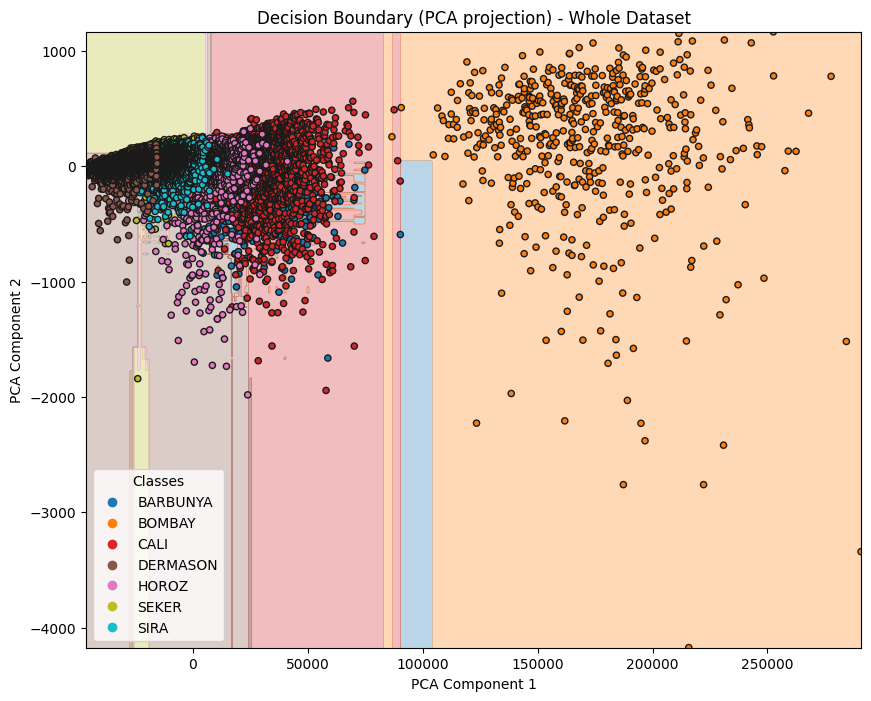

In [ ]:
from sklearn.decomposition import PCA

# PCA
pca = PCA(n_components=2)
X_pca = pca.fit_transform(X)

model_vis = GradientBoostingClassifier(
    random_state=42,
    n_estimators=grid.best_params_["n_estimators"],
    learning_rate=grid.best_params_["learning_rate"],
    max_depth=grid.best_params_["max_depth"]
)
model_vis.fit(X_pca, y_encoded)

x_min, x_max = X_pca[:, 0].min() - 1, X_pca[:, 0].max() + 1
y_min, y_max = X_pca[:, 1].min() - 1, X_pca[:, 1].max() + 1
xx, yy = np.meshgrid(np.linspace(x_min, x_max, 500),
                     np.linspace(y_min, y_max, 500))
Z = model_vis.predict(np.c_[xx.ravel(), yy.ravel()])
Z = Z.reshape(xx.shape)

plt.figure(figsize=(10, 8))
plt.contourf(xx, yy, Z, alpha=0.3, cmap=plt.cm.get_cmap('tab10', len(classes)))
scatter = plt.scatter(X_pca[:, 0], X_pca[:, 1], c=y_encoded, cmap=plt.cm.get_cmap('tab10', len(classes)), edgecolor='k', s=20)
plt.xlabel('PCA Component 1')
plt.ylabel('PCA Component 2')
plt.title('Decision Boundary (PCA projection) - Whole Dataset')

handles, _ = scatter.legend_elements(prop="colors")
plt.legend(handles, classes, title="Classes", loc="best")

plt.show()


innovation smote

Splitting data into train/val/test sets...
Original train class distribution: Counter({np.int64(3): 2482, np.int64(6): 1845, np.int64(5): 1419, np.int64(4): 1350, np.int64(2): 1141, np.int64(0): 925, np.int64(1): 365})
Fitting 5 folds for each of 576 candidates, totalling 2880 fits
Best hyperparameters:
{'colsample_bytree': 1.0, 'gamma': 1, 'learning_rate': 0.2, 'max_depth': 8, 'n_estimators': 200, 'reg_alpha': 1, 'reg_lambda': 1, 'subsample': 0.8}
Train set accuracy: 96.89%


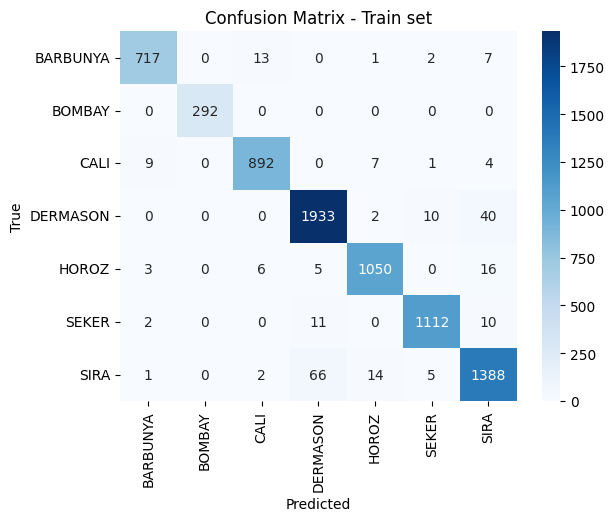

Classification report for train set:
              precision    recall  f1-score   support

    BARBUNYA       0.98      0.97      0.97       740
      BOMBAY       1.00      1.00      1.00       292
        CALI       0.98      0.98      0.98       913
    DERMASON       0.96      0.97      0.97      1985
       HOROZ       0.98      0.97      0.97      1080
       SEKER       0.98      0.98      0.98      1135
        SIRA       0.95      0.94      0.94      1476

    accuracy                           0.97      7621
   macro avg       0.97      0.97      0.97      7621
weighted avg       0.97      0.97      0.97      7621



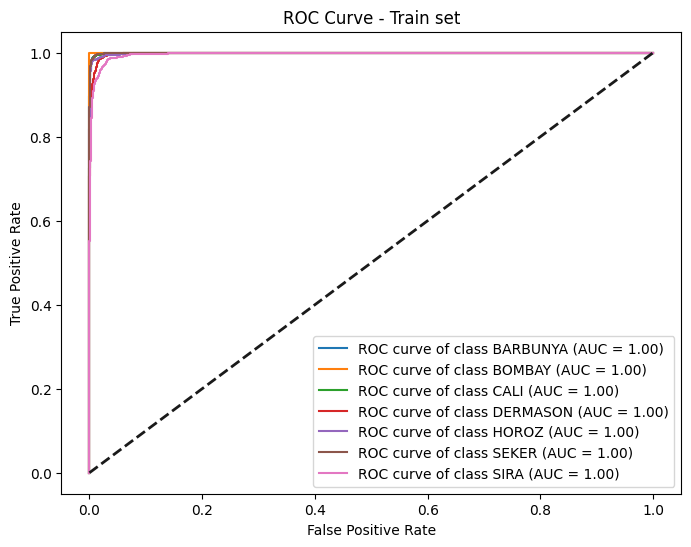

Average AUC (train set): 0.9990
Test set accuracy: 92.53%


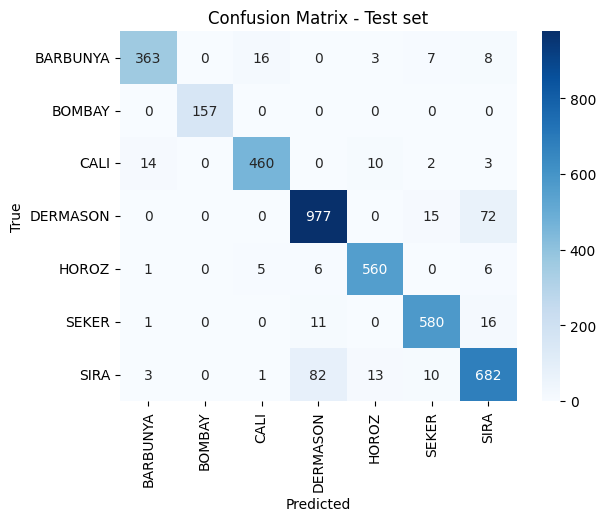

Classification report for test set:
              precision    recall  f1-score   support

    BARBUNYA       0.95      0.91      0.93       397
      BOMBAY       1.00      1.00      1.00       157
        CALI       0.95      0.94      0.95       489
    DERMASON       0.91      0.92      0.91      1064
       HOROZ       0.96      0.97      0.96       578
       SEKER       0.94      0.95      0.95       608
        SIRA       0.87      0.86      0.86       791

    accuracy                           0.93      4084
   macro avg       0.94      0.94      0.94      4084
weighted avg       0.93      0.93      0.93      4084



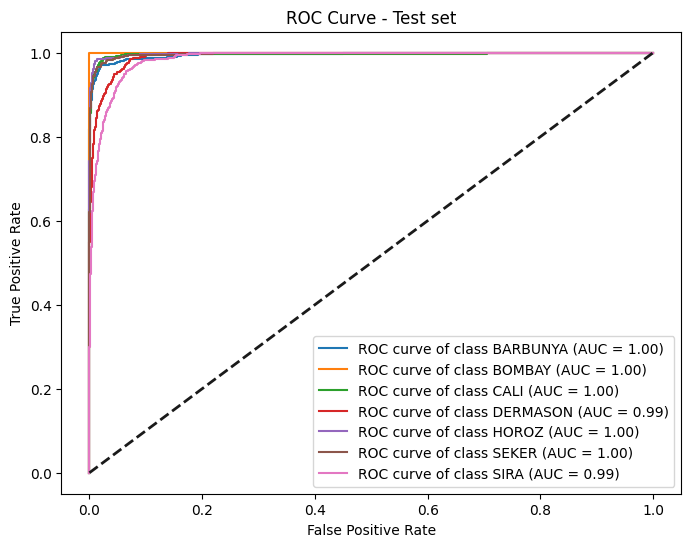

Average AUC (test set): 0.9951
Whole dataset accuracy: 95.02%


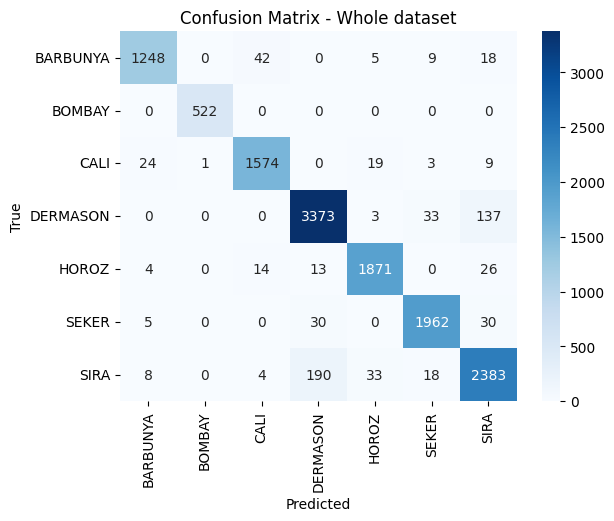

Classification report for whole dataset:
              precision    recall  f1-score   support

    BARBUNYA       0.97      0.94      0.96      1322
      BOMBAY       1.00      1.00      1.00       522
        CALI       0.96      0.97      0.96      1630
    DERMASON       0.94      0.95      0.94      3546
       HOROZ       0.97      0.97      0.97      1928
       SEKER       0.97      0.97      0.97      2027
        SIRA       0.92      0.90      0.91      2636

    accuracy                           0.95     13611
   macro avg       0.96      0.96      0.96     13611
weighted avg       0.95      0.95      0.95     13611



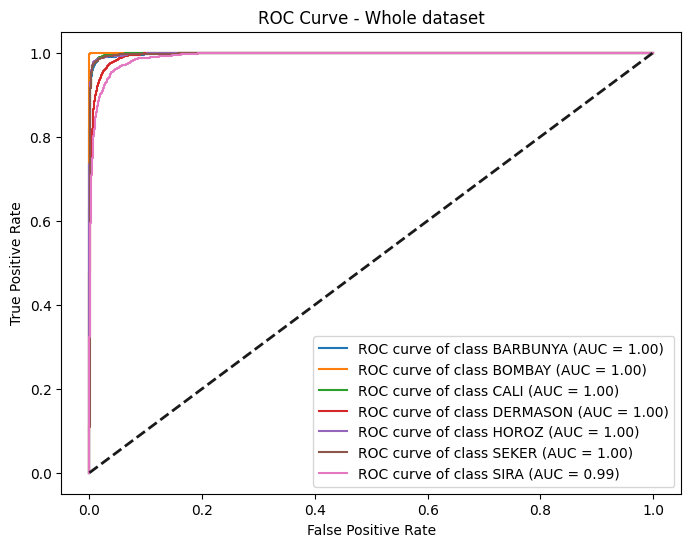

Average AUC (whole dataset): 0.9974


/var/folders/qk/zgyqcw1j2d7_d2zbzrqgtfmw0000gn/T/ipykernel_57456/3145973959.py:167: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.
  plt.contourf(xx, yy, Z, alpha=0.3, cmap=plt.cm.get_cmap('tab10', len(classes)))
/var/folders/qk/zgyqcw1j2d7_d2zbzrqgtfmw0000gn/T/ipykernel_57456/3145973959.py:168: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.
  scatter = plt.scatter(X_pca[:, 0], X_pca[:, 1], c=y_int, cmap=plt.cm.get_cmap('tab10', len(classes)), edgecolor='k', s=20)


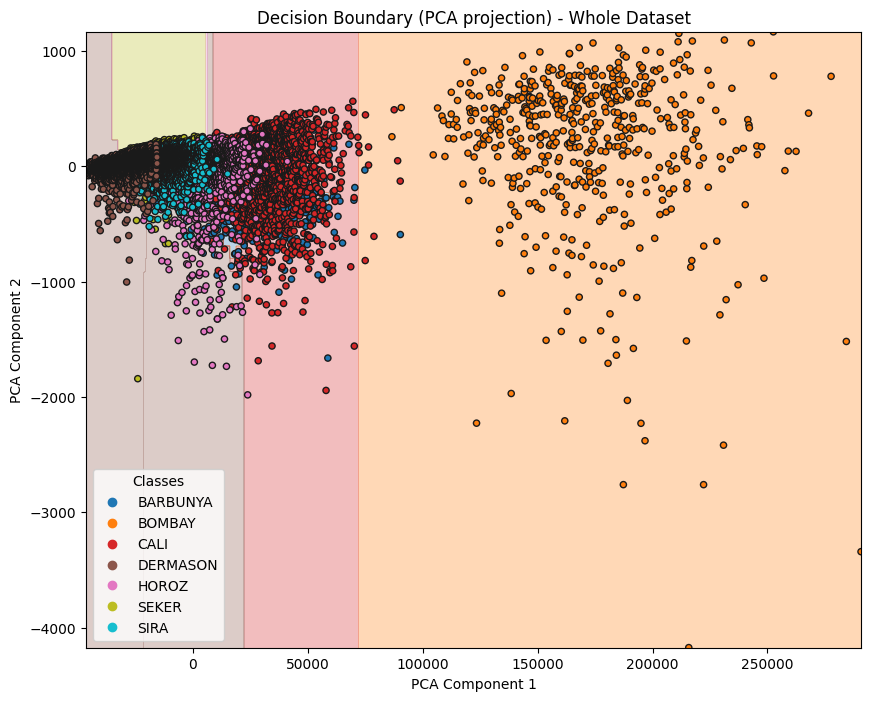

In [ ]:
from xgboost import XGBClassifier
from sklearn.model_selection import GridSearchCV, StratifiedKFold
from sklearn.metrics import accuracy_score
from sklearn.model_selection import train_test_split
import pandas as pd
import numpy as np
from collections import Counter
from imblearn.over_sampling import SMOTE
from sklearn.metrics import confusion_matrix, classification_report, roc_curve, auc
from sklearn.preprocessing import label_binarize
import seaborn as sns

#add random seed for reproducibility
np.random.seed(42)

data = pd.read_csv("Dry_Bean_Dataset.csv")
X = data.iloc[:, :-1]
y = data.iloc[:, -1]
classes = np.unique(y)
y_int = np.array([np.where(classes == label)[0][0] for label in y])

print("Splitting data into train/val/test sets...")
X_trainval, X_test, y_trainval, y_test = train_test_split(X, y_int, test_size=0.3, random_state=42, stratify=y_int)
orig_counts = Counter(y_trainval)
print("Original train class distribution:", orig_counts)


smote = SMOTE(sampling_strategy='not majority', k_neighbors=5, random_state=42)
X_train, y_train = smote.fit_resample(X_trainval, y_trainval)

X_train, X_val, y_train, y_val = train_test_split(X_trainval, y_trainval, test_size=0.2, random_state=42, stratify=y_trainval)

# Define parameter grid for common hyperparameters (including regularization)
param_grid = {
    'learning_rate': [0.05, 0.1, 0.2],
    'max_depth': [4, 6, 8],
    'n_estimators': [100, 200],
    'subsample': [0.8, 1.0],
    'colsample_bytree': [0.8, 1.0],
    'gamma': [0, 1],
    'reg_lambda': [1, 2],  
    'reg_alpha': [0, 1]    
}

xgb_clf = XGBClassifier(
    objective='multi:softmax',
    num_class=len(classes),
    n_jobs=-1
)

cv = StratifiedKFold(n_splits=5, shuffle=True, random_state=42)
grid = GridSearchCV(
    estimator=xgb_clf,
    param_grid=param_grid,
    scoring='accuracy',
    cv=cv,
    n_jobs=-1,
    verbose=1
)

grid.fit(X_train, y_train)

print("Best hyperparameters:")
print(grid.best_params_)
import matplotlib.pyplot as plt

# Fit the final model with best parameters
final_model = XGBClassifier(
    objective='multi:softmax',
    num_class=len(classes),
    n_jobs=-1,
    **grid.best_params_
)
final_model.fit(X_train, y_train)

y_encoded = y_int

datasets = [
    ("Train set", X_train, y_train),
    ("Test set", X_test, y_test),
    ("Whole dataset", X, y_encoded)
]

for name, X_set, y_set in datasets:
    y_pred = final_model.predict(X_set)
    accuracy = final_model.score(X_set, y_set) * 100
    print(f"{name} accuracy: {accuracy:.2f}%")
    
    # Plot confusion matrix
    cm = confusion_matrix(y_set, y_pred)
    sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', xticklabels=classes, yticklabels=classes)
    plt.title(f"Confusion Matrix - {name}")
    plt.xlabel("Predicted")
    plt.ylabel("True")
    plt.show()
    
    print(f"Classification report for {name.lower()}:")
    print(classification_report(y_set, y_pred, target_names=classes))
    
    # ROC
    y_bin = label_binarize(y_set, classes=range(len(classes)))
    if hasattr(final_model, "predict_proba"):
        y_score = final_model.predict_proba(X_set)
    else:
        y_score = final_model.decision_function(X_set)
    
    fpr = dict()
    tpr = dict()
    roc_auc = dict()
    for i in range(len(classes)):
        fpr[i], tpr[i], _ = roc_curve(y_bin[:, i], y_score[:, i])
        roc_auc[i] = auc(fpr[i], tpr[i])

    fpr["micro"], tpr["micro"], _ = roc_curve(y_bin.ravel(), y_score.ravel())
    roc_auc["micro"] = auc(fpr["micro"], tpr["micro"])
    
    # plot ROC curve
    plt.figure(figsize=(8, 6))
    for i in range(len(classes)):
        plt.plot(fpr[i], tpr[i], label=f'ROC curve of class {classes[i]} (AUC = {roc_auc[i]:0.2f})')
    plt.plot([0, 1], [0, 1], 'k--', lw=2)
    plt.xlabel('False Positive Rate')
    plt.ylabel('True Positive Rate')
    plt.title(f'ROC Curve - {name}')
    plt.legend(loc="lower right")
    plt.show()
    
    # print average AUC
    average_auc = np.mean([roc_auc[i] for i in range(len(classes))])
    print(f'Average AUC ({name.lower()}): {average_auc:.4f}')


from sklearn.decomposition import PCA

pca = PCA(n_components=2)
X_pca = pca.fit_transform(X)

model_vis = XGBClassifier(
    objective='multi:softmax',
    num_class=len(classes),
    n_jobs=-1,
    n_estimators=grid.best_params_["n_estimators"],
    learning_rate=grid.best_params_["learning_rate"],
    max_depth=grid.best_params_["max_depth"],
    subsample=grid.best_params_["subsample"],
    colsample_bytree=grid.best_params_["colsample_bytree"],
    gamma=grid.best_params_["gamma"],
    reg_lambda=grid.best_params_["reg_lambda"],
    reg_alpha=grid.best_params_["reg_alpha"],
    random_state=42
)
model_vis.fit(X_pca, y_int)

x_min, x_max = X_pca[:, 0].min() - 1, X_pca[:, 0].max() + 1
y_min, y_max = X_pca[:, 1].min() - 1, X_pca[:, 1].max() + 1
xx, yy = np.meshgrid(np.linspace(x_min, x_max, 500),
                     np.linspace(y_min, y_max, 500))
Z = model_vis.predict(np.c_[xx.ravel(), yy.ravel()])
Z = Z.reshape(xx.shape)

plt.figure(figsize=(10, 8))
plt.contourf(xx, yy, Z, alpha=0.3, cmap=plt.cm.get_cmap('tab10', len(classes)))
scatter = plt.scatter(X_pca[:, 0], X_pca[:, 1], c=y_int, cmap=plt.cm.get_cmap('tab10', len(classes)), edgecolor='k', s=20)
plt.xlabel('PCA Component 1')
plt.ylabel('PCA Component 2')
plt.title('Decision Boundary (PCA projection) - Whole Dataset')

handles, _ = scatter.legend_elements(prop="colors")
plt.legend(handles, classes, title="Classes", loc="best")

plt.show()




Original train class distribution: Counter({np.int64(3): 2503, np.int64(6): 1837, np.int64(5): 1408, np.int64(4): 1340, np.int64(2): 1151, np.int64(0): 927, np.int64(1): 361})


/opt/anaconda3/envs/newenv/lib/python3.13/site-packages/sklearn/linear_model/_logistic.py:1247: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. From then on, it will always use 'multinomial'. Leave it to its default value to avoid this warning.
  warnings.warn(
/opt/anaconda3/envs/newenv/lib/python3.13/site-packages/sklearn/linear_model/_logistic.py:1247: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. From then on, it will always use 'multinomial'. Leave it to its default value to avoid this warning.
  warnings.warn(
/opt/anaconda3/envs/newenv/lib/python3.13/site-packages/sklearn/linear_model/_logistic.py:1247: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. From then on, it will always use 'multinomial'. Leave it to its default value to avoid this warning.
  warnings.warn(
/opt/anaconda3/envs/newenv/lib/python3.13/site-packages/sklearn/linear_model/_logistic.py:1247: F

Best hyperparameters found by GridSearchCV:
{'C': 100.0, 'max_iter': 1000, 'multi_class': 'multinomial', 'solver': 'lbfgs'}
Train set accuracy: 94.22%


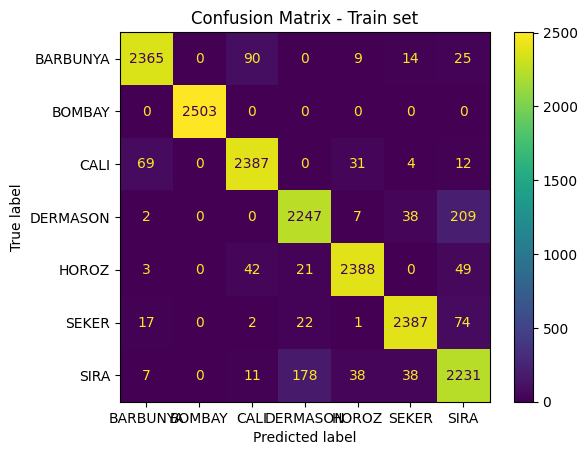

Classification report for train set:
              precision    recall  f1-score   support

    BARBUNYA       0.96      0.94      0.95      2503
      BOMBAY       1.00      1.00      1.00      2503
        CALI       0.94      0.95      0.95      2503
    DERMASON       0.91      0.90      0.90      2503
       HOROZ       0.97      0.95      0.96      2503
       SEKER       0.96      0.95      0.96      2503
        SIRA       0.86      0.89      0.87      2503

    accuracy                           0.94     17521
   macro avg       0.94      0.94      0.94     17521
weighted avg       0.94      0.94      0.94     17521



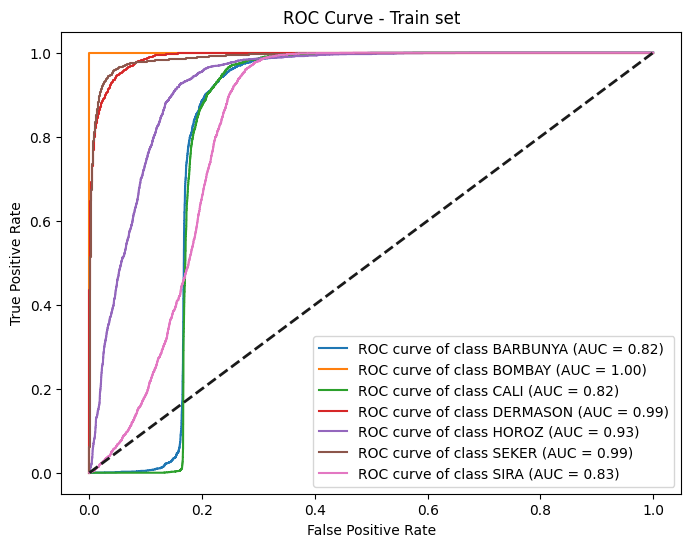

Average AUC (train set): 0.9118
Test set accuracy: 91.99%


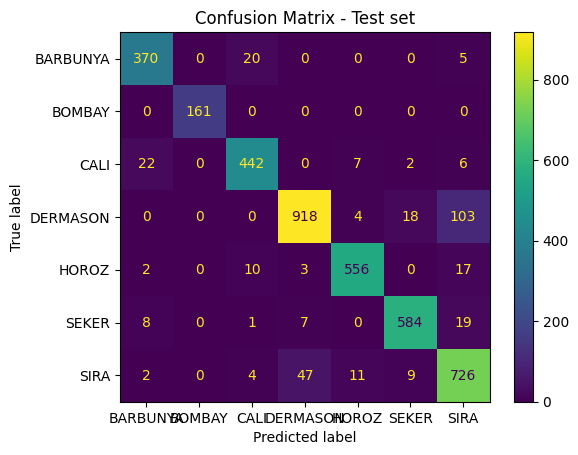

Classification report for test set:
              precision    recall  f1-score   support

    BARBUNYA       0.92      0.94      0.93       395
      BOMBAY       1.00      1.00      1.00       161
        CALI       0.93      0.92      0.92       479
    DERMASON       0.94      0.88      0.91      1043
       HOROZ       0.96      0.95      0.95       588
       SEKER       0.95      0.94      0.95       619
        SIRA       0.83      0.91      0.87       799

    accuracy                           0.92      4084
   macro avg       0.93      0.93      0.93      4084
weighted avg       0.92      0.92      0.92      4084



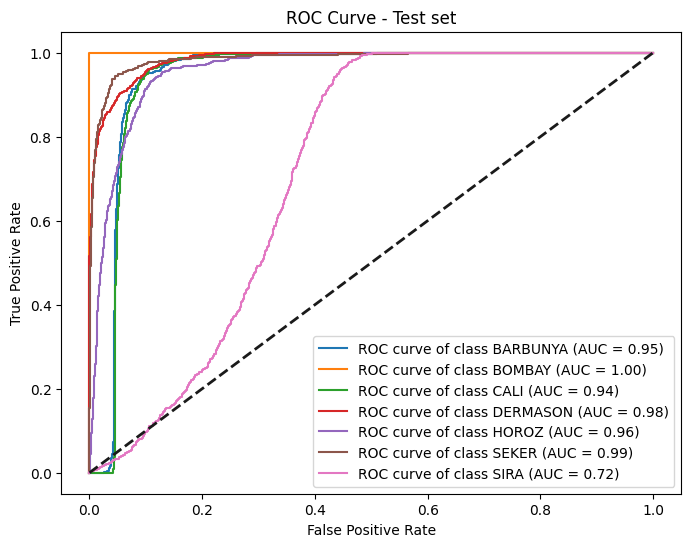

Average AUC (test set): 0.9333
Whole dataset accuracy: 92.20%


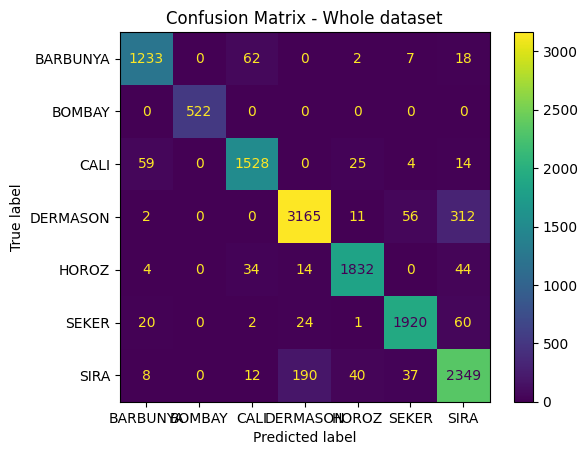

Classification report for whole dataset:
              precision    recall  f1-score   support

    BARBUNYA       0.93      0.93      0.93      1322
      BOMBAY       1.00      1.00      1.00       522
        CALI       0.93      0.94      0.94      1630
    DERMASON       0.93      0.89      0.91      3546
       HOROZ       0.96      0.95      0.95      1928
       SEKER       0.95      0.95      0.95      2027
        SIRA       0.84      0.89      0.86      2636

    accuracy                           0.92     13611
   macro avg       0.93      0.94      0.94     13611
weighted avg       0.92      0.92      0.92     13611



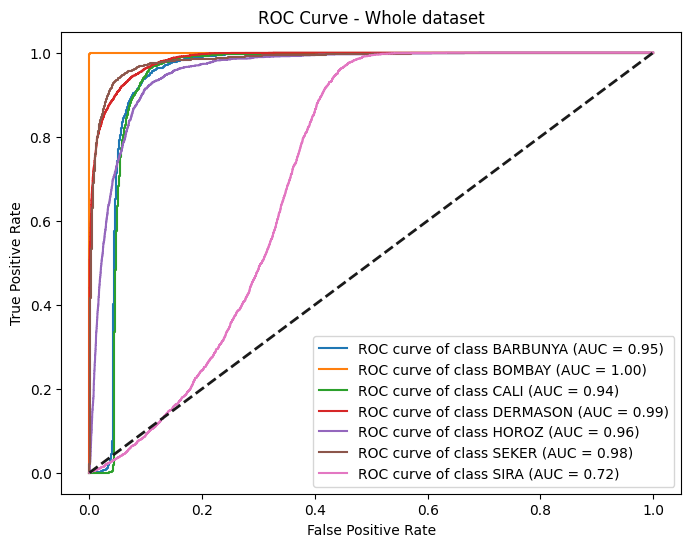

Average AUC (whole dataset): 0.9337


/opt/anaconda3/envs/newenv/lib/python3.13/site-packages/sklearn/linear_model/_logistic.py:1247: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. From then on, it will always use 'multinomial'. Leave it to its default value to avoid this warning.
  warnings.warn(
/var/folders/qk/zgyqcw1j2d7_d2zbzrqgtfmw0000gn/T/ipykernel_57456/1682950698.py:121: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.
  plt.contourf(xx, yy, Z, alpha=0.3, cmap=plt.cm.get_cmap('tab10', len(classes)))
/var/folders/qk/zgyqcw1j2d7_d2zbzrqgtfmw0000gn/T/ipykernel_57456/1682950698.py:122: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.
  sca

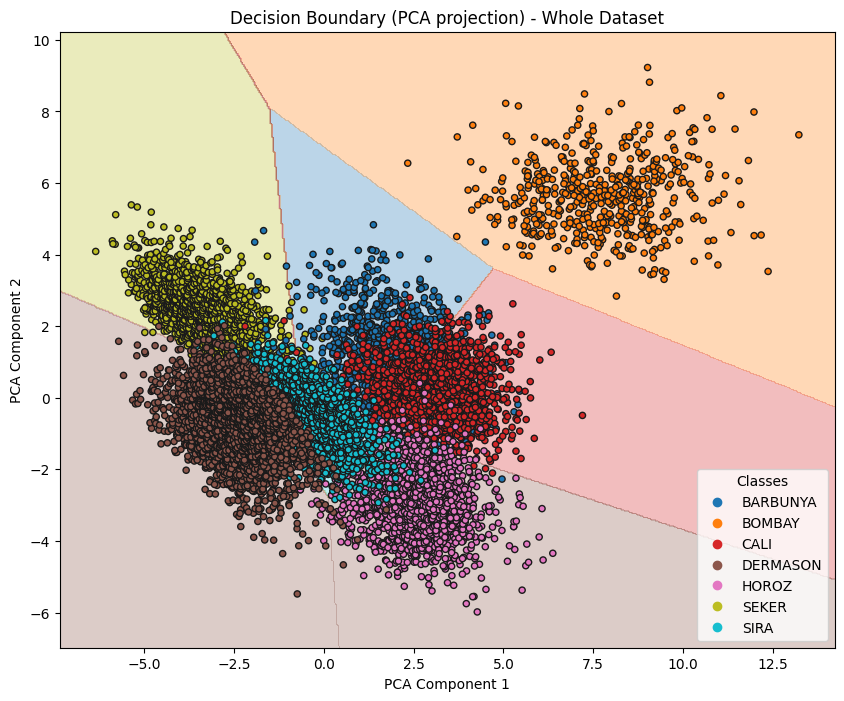

In [ ]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from sklearn.metrics import confusion_matrix, ConfusionMatrixDisplay
from sklearn.model_selection import GridSearchCV, train_test_split
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import classification_report
from sklearn.metrics import roc_curve, auc
from sklearn.preprocessing import label_binarize
from sklearn.decomposition import PCA
from collections import Counter
from imblearn.over_sampling import SMOTE
#set random seed for reproducibility
np.random.seed(42)

data = pd.read_csv("Dry_Bean_Dataset.csv")

X = data.iloc[:, :-1].values  
y = data.iloc[:, -1].values 

X = (X - X.mean(axis=0)) / X.std(axis=0)

#convert labels to integers
classes = np.unique(y)
y = np.array([np.where(classes == label)[0][0] for label in y])

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=42)
orig_counts = Counter(y_train)
print("Original train class distribution:", orig_counts)


smote = SMOTE(sampling_strategy='not majority', k_neighbors=5, random_state=42)
X_train, y_train = smote.fit_resample(X_train, y_train)
#define parameter grid for GridSearchCV
param_grid = {'C': [1/0.01, 1/0.1, 1/0.5],'max_iter': [1000, 3000, 5000],'solver': ['lbfgs'],'multi_class': ['multinomial']}# C relates to learning rate

logreg = LogisticRegression()
grid = GridSearchCV(logreg, param_grid, cv=5, scoring='accuracy', n_jobs=-1)
grid.fit(X_train, y_train)

print("Best hyperparameters found by GridSearchCV:")
print(grid.best_params_)

datasets = [
    ("Train set", X_train, y_train),
    ("Test set", X_test, y_test),
    ("Whole dataset", X, y)
]

for name, X_set, y_set in datasets:
    y_pred = grid.predict(X_set)
    accuracy = grid.score(X_set, y_set) * 100
    print(f"{name} accuracy: {accuracy:.2f}%")
    
    #plot confusion matrix
    cm = confusion_matrix(y_set, y_pred)
    disp = ConfusionMatrixDisplay(confusion_matrix=cm, display_labels=classes)
    disp.plot()
    plt.title(f"Confusion Matrix - {name}")
    plt.show()
    
    print(f"Classification report for {name.lower()}:")
    print(classification_report(y_set, y_pred, target_names=classes))
    
    #ROC curve 
    y_bin = label_binarize(y_set, classes=range(len(classes)))
    y_score = grid.decision_function(X_set)
    
    fpr = dict()
    tpr = dict()
    roc_auc = dict()
    for i in range(len(classes)):
        fpr[i], tpr[i], _ = roc_curve(y_bin[:, i], y_score[:, i])
        roc_auc[i] = auc(fpr[i], tpr[i])
    #compute micro-average ROC curve and AUC
    fpr["micro"], tpr["micro"], _ = roc_curve(y_bin.ravel(), y_score.ravel())
    roc_auc["micro"] = auc(fpr["micro"], tpr["micro"])
    
    #plot ROC curve for each class
    plt.figure(figsize=(8, 6))
    for i in range(len(classes)):
        plt.plot(fpr[i], tpr[i], label=f'ROC curve of class {classes[i]} (AUC = {roc_auc[i]:0.2f})')
    plt.plot([0, 1], [0, 1], 'k--', lw=2)
    plt.xlabel('False Positive Rate')
    plt.ylabel('True Positive Rate')
    plt.title(f'ROC Curve - {name}')
    plt.legend(loc="lower right")
    plt.show()
    
    #calculate and print average AUC
    average_auc = np.mean(list(roc_auc.values())[:-1])  # exclude 'micro'
    print(f'Average AUC ({name.lower()}): {average_auc:.4f}')

#reduce features to 2D using PCA for visualization
pca = PCA(n_components=2)
X_pca = pca.fit_transform(X)

#fit logistic regression on PCA-reduced data for visualization
logreg_vis = LogisticRegression(
    C=grid.best_params_['C'],
    max_iter=grid.best_params_['max_iter'],
    solver=grid.best_params_['solver'],
    multi_class=grid.best_params_['multi_class']
)
logreg_vis.fit(X_pca, y)

x_min, x_max = X_pca[:, 0].min() - 1, X_pca[:, 0].max() + 1
y_min, y_max = X_pca[:, 1].min() - 1, X_pca[:, 1].max() + 1
xx, yy = np.meshgrid(np.linspace(x_min, x_max, 500),
                     np.linspace(y_min, y_max, 500))
Z = logreg_vis.predict(np.c_[xx.ravel(), yy.ravel()])
Z = Z.reshape(xx.shape)
plt.figure(figsize=(10, 8))
plt.contourf(xx, yy, Z, alpha=0.3, cmap=plt.cm.get_cmap('tab10', len(classes)))
scatter = plt.scatter(X_pca[:, 0], X_pca[:, 1], c=y, cmap=plt.cm.get_cmap('tab10', len(classes)), edgecolor='k', s=20)
plt.xlabel('PCA Component 1')
plt.ylabel('PCA Component 2')
plt.title('Decision Boundary (PCA projection) - Whole Dataset')

handles, _ = scatter.legend_elements(prop="colors")
plt.legend(handles, classes, title="Classes", loc="best")

plt.show()



logistic regression

/opt/anaconda3/envs/newenv/lib/python3.13/site-packages/sklearn/linear_model/_logistic.py:1247: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. From then on, it will always use 'multinomial'. Leave it to its default value to avoid this warning.
  warnings.warn(
/opt/anaconda3/envs/newenv/lib/python3.13/site-packages/sklearn/linear_model/_logistic.py:1247: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. From then on, it will always use 'multinomial'. Leave it to its default value to avoid this warning.
  warnings.warn(
/opt/anaconda3/envs/newenv/lib/python3.13/site-packages/sklearn/linear_model/_logistic.py:1247: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. From then on, it will always use 'multinomial'. Leave it to its default value to avoid this warning.
  warnings.warn(
/opt/anaconda3/envs/newenv/lib/python3.13/site-packages/sklearn/linear_model/_logistic.py:1247: F

Best hyperparameters found by GridSearchCV:
{'C': 10.0, 'max_iter': 1000, 'multi_class': 'multinomial', 'solver': 'lbfgs'}
Train set accuracy: 92.64%


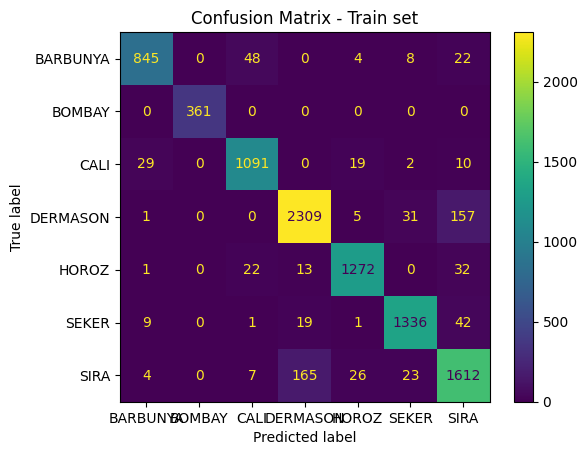

Classification report for train set:
              precision    recall  f1-score   support

    BARBUNYA       0.95      0.91      0.93       927
      BOMBAY       1.00      1.00      1.00       361
        CALI       0.93      0.95      0.94      1151
    DERMASON       0.92      0.92      0.92      2503
       HOROZ       0.96      0.95      0.95      1340
       SEKER       0.95      0.95      0.95      1408
        SIRA       0.86      0.88      0.87      1837

    accuracy                           0.93      9527
   macro avg       0.94      0.94      0.94      9527
weighted avg       0.93      0.93      0.93      9527



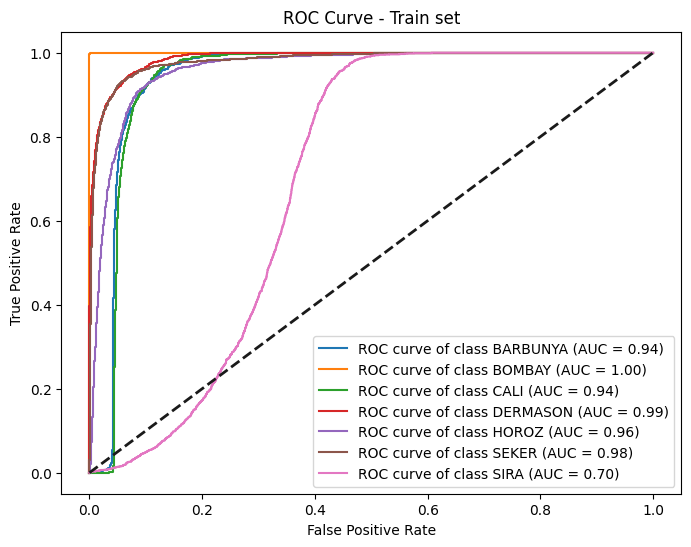

Average AUC (train set): 0.9303
Test set accuracy: 92.21%


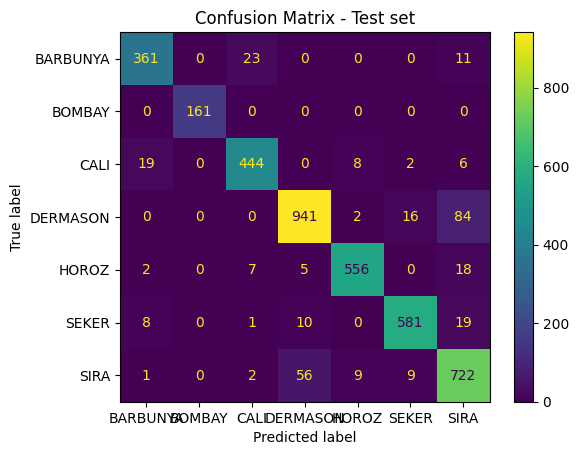

Classification report for test set:
              precision    recall  f1-score   support

    BARBUNYA       0.92      0.91      0.92       395
      BOMBAY       1.00      1.00      1.00       161
        CALI       0.93      0.93      0.93       479
    DERMASON       0.93      0.90      0.92      1043
       HOROZ       0.97      0.95      0.96       588
       SEKER       0.96      0.94      0.95       619
        SIRA       0.84      0.90      0.87       799

    accuracy                           0.92      4084
   macro avg       0.94      0.93      0.93      4084
weighted avg       0.92      0.92      0.92      4084



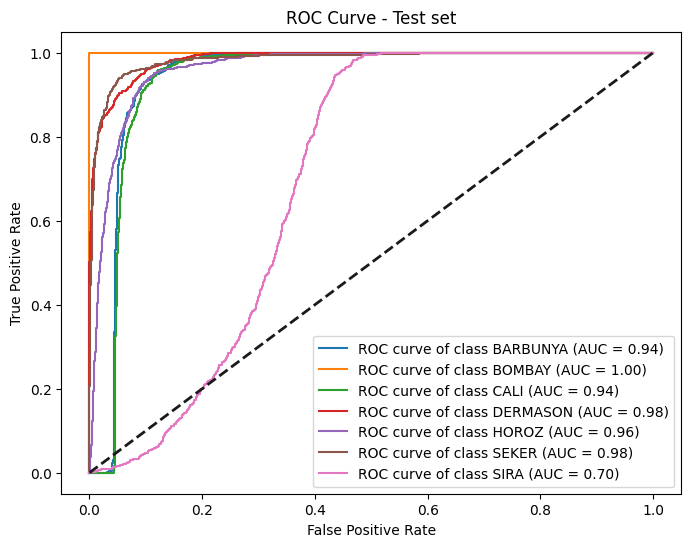

Average AUC (test set): 0.9300
Whole dataset accuracy: 92.51%


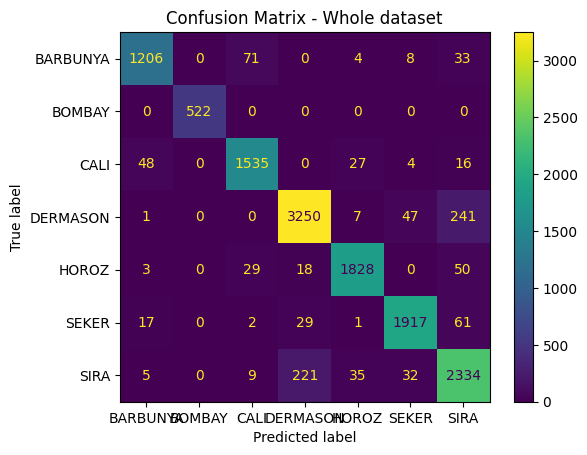

Classification report for whole dataset:
              precision    recall  f1-score   support

    BARBUNYA       0.94      0.91      0.93      1322
      BOMBAY       1.00      1.00      1.00       522
        CALI       0.93      0.94      0.94      1630
    DERMASON       0.92      0.92      0.92      3546
       HOROZ       0.96      0.95      0.95      1928
       SEKER       0.95      0.95      0.95      2027
        SIRA       0.85      0.89      0.87      2636

    accuracy                           0.93     13611
   macro avg       0.94      0.94      0.94     13611
weighted avg       0.93      0.93      0.93     13611



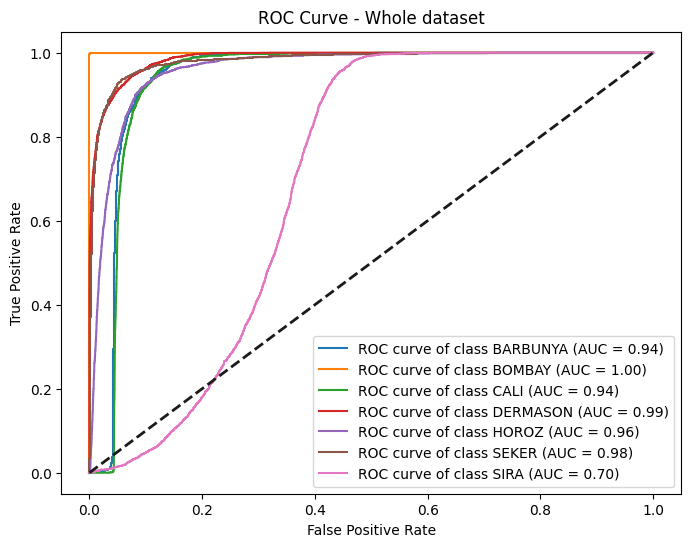

Average AUC (whole dataset): 0.9302


/opt/anaconda3/envs/newenv/lib/python3.13/site-packages/sklearn/linear_model/_logistic.py:1247: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. From then on, it will always use 'multinomial'. Leave it to its default value to avoid this warning.
  warnings.warn(
/var/folders/qk/zgyqcw1j2d7_d2zbzrqgtfmw0000gn/T/ipykernel_57456/2082705258.py:114: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.
  plt.contourf(xx, yy, Z, alpha=0.3, cmap=plt.cm.get_cmap('tab10', len(classes)))
/var/folders/qk/zgyqcw1j2d7_d2zbzrqgtfmw0000gn/T/ipykernel_57456/2082705258.py:115: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.
  sca

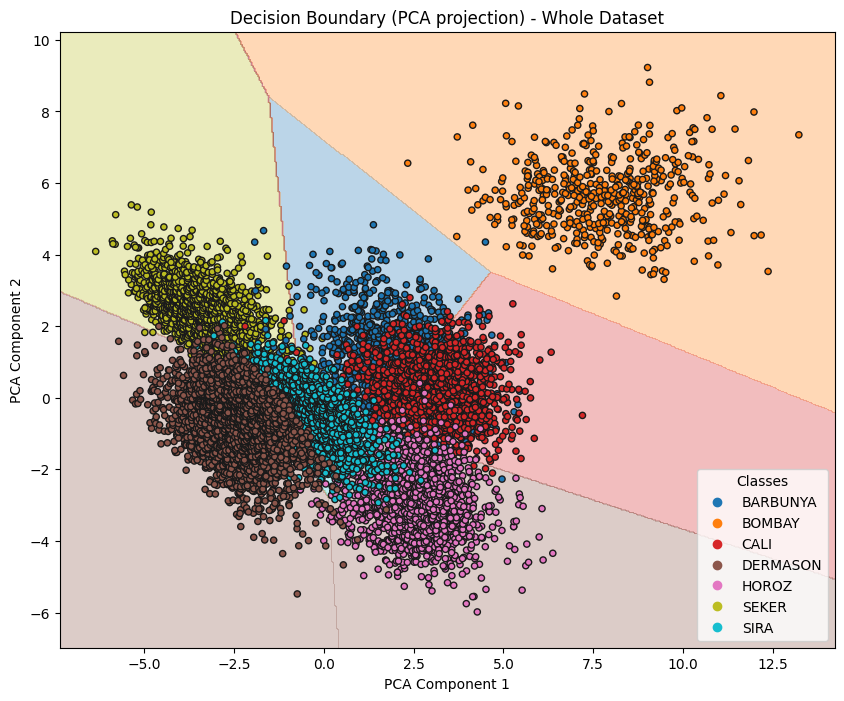

In [ ]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from sklearn.metrics import confusion_matrix, ConfusionMatrixDisplay
from sklearn.model_selection import GridSearchCV, train_test_split
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import classification_report
from sklearn.metrics import roc_curve, auc
from sklearn.preprocessing import label_binarize
from sklearn.decomposition import PCA
#set random seed for reproducibility
np.random.seed(42)

data = pd.read_csv("Dry_Bean_Dataset.csv")
X = data.iloc[:, :-1].values  
y = data.iloc[:, -1].values 

X = (X - X.mean(axis=0)) / X.std(axis=0)

classes = np.unique(y)
y = np.array([np.where(classes == label)[0][0] for label in y])

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=42)

param_grid = {'C': [1/0.01, 1/0.1, 1/0.5],'max_iter': [1000, 3000, 5000],'solver': ['lbfgs'],'multi_class': ['multinomial']}# C relates to learning rate

logreg = LogisticRegression()
grid = GridSearchCV(logreg, param_grid, cv=5, scoring='accuracy', n_jobs=-1)
grid.fit(X_train, y_train)

print("Best hyperparameters found by GridSearchCV:")
print(grid.best_params_)

#define datasets and their names for iteration
datasets = [
    ("Train set", X_train, y_train),
    ("Test set", X_test, y_test),
    ("Whole dataset", X, y)
]

for name, X_set, y_set in datasets:
    y_pred = grid.predict(X_set)
    accuracy = grid.score(X_set, y_set) * 100
    print(f"{name} accuracy: {accuracy:.2f}%")
    
    #plot confusion matrix
    cm = confusion_matrix(y_set, y_pred)
    disp = ConfusionMatrixDisplay(confusion_matrix=cm, display_labels=classes)
    disp.plot()
    plt.title(f"Confusion Matrix - {name}")
    plt.show()
    
    print(f"Classification report for {name.lower()}:")
    print(classification_report(y_set, y_pred, target_names=classes))
    
    #binarize the output for ROC curve (one-vs-rest)
    y_bin = label_binarize(y_set, classes=range(len(classes)))
    y_score = grid.decision_function(X_set)
    
    fpr = dict()
    tpr = dict()
    roc_auc = dict()
    for i in range(len(classes)):
        fpr[i], tpr[i], _ = roc_curve(y_bin[:, i], y_score[:, i])
        roc_auc[i] = auc(fpr[i], tpr[i])
    #compute micro-average ROC curve and ROC area
    fpr["micro"], tpr["micro"], _ = roc_curve(y_bin.ravel(), y_score.ravel())
    roc_auc["micro"] = auc(fpr["micro"], tpr["micro"])
    
    #plot ROC curve
    plt.figure(figsize=(8, 6))
    for i in range(len(classes)):
        plt.plot(fpr[i], tpr[i], label=f'ROC curve of class {classes[i]} (AUC = {roc_auc[i]:0.2f})')
    plt.plot([0, 1], [0, 1], 'k--', lw=2)
    plt.xlabel('False Positive Rate')
    plt.ylabel('True Positive Rate')
    plt.title(f'ROC Curve - {name}')
    plt.legend(loc="lower right")
    plt.show()
    
    # print average AUC
    average_auc = np.mean(list(roc_auc.values())[:-1])  # exclude 'micro'
    print(f'Average AUC ({name.lower()}): {average_auc:.4f}')

# PCA
pca = PCA(n_components=2)
X_pca = pca.fit_transform(X)

#fit logistic regression on PCA-reduced data for visualization
logreg_vis = LogisticRegression(
    C=grid.best_params_['C'],
    max_iter=grid.best_params_['max_iter'],
    solver=grid.best_params_['solver'],
    multi_class=grid.best_params_['multi_class']
)
logreg_vis.fit(X_pca, y)

x_min, x_max = X_pca[:, 0].min() - 1, X_pca[:, 0].max() + 1
y_min, y_max = X_pca[:, 1].min() - 1, X_pca[:, 1].max() + 1
xx, yy = np.meshgrid(np.linspace(x_min, x_max, 500),
                     np.linspace(y_min, y_max, 500))
Z = logreg_vis.predict(np.c_[xx.ravel(), yy.ravel()])
Z = Z.reshape(xx.shape)
plt.figure(figsize=(10, 8))
plt.contourf(xx, yy, Z, alpha=0.3, cmap=plt.cm.get_cmap('tab10', len(classes)))
scatter = plt.scatter(X_pca[:, 0], X_pca[:, 1], c=y, cmap=plt.cm.get_cmap('tab10', len(classes)), edgecolor='k', s=20)
plt.xlabel('PCA Component 1')
plt.ylabel('PCA Component 2')
plt.title('Decision Boundary (PCA projection) - Whole Dataset')

#add legend
handles, _ = scatter.legend_elements(prop="colors")
plt.legend(handles, classes, title="Classes", loc="best")

plt.show()



random forest

测试集准确率: 92.51%

测试集分类报告:
              precision    recall  f1-score   support

    BARBUNYA       0.94      0.91      0.93       397
      BOMBAY       1.00      1.00      1.00       157
        CALI       0.95      0.94      0.94       489
    DERMASON       0.92      0.91      0.91      1064
       HOROZ       0.96      0.97      0.96       578
       SEKER       0.94      0.95      0.95       608
        SIRA       0.86      0.88      0.87       791

    accuracy                           0.93      4084
   macro avg       0.94      0.94      0.94      4084
weighted avg       0.93      0.93      0.93      4084


各数据集 ROC/AUC 曲线


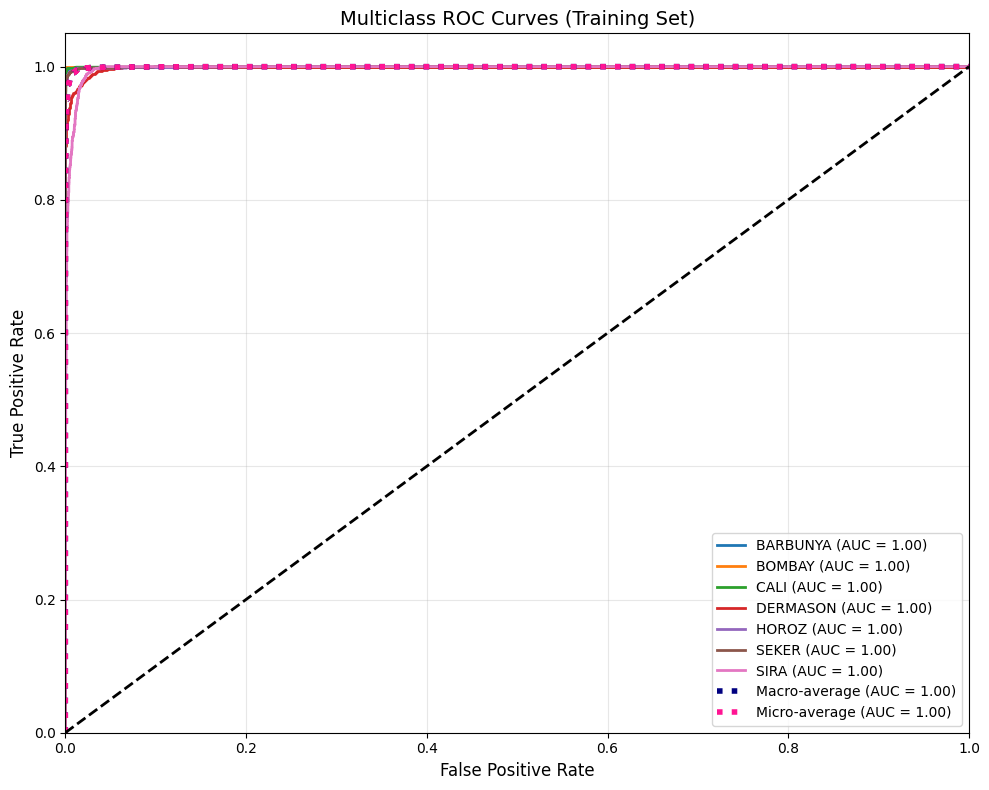


Training Set ROC AUC 汇总:
Macro-average AUC: 0.9995
Micro-average AUC: 0.9995
BARBUNYA        AUC = 0.9999
BOMBAY          AUC = 1.0000
CALI            AUC = 0.9998
DERMASON        AUC = 0.9987
HOROZ           AUC = 0.9996
SEKER           AUC = 0.9997
SIRA            AUC = 0.9973


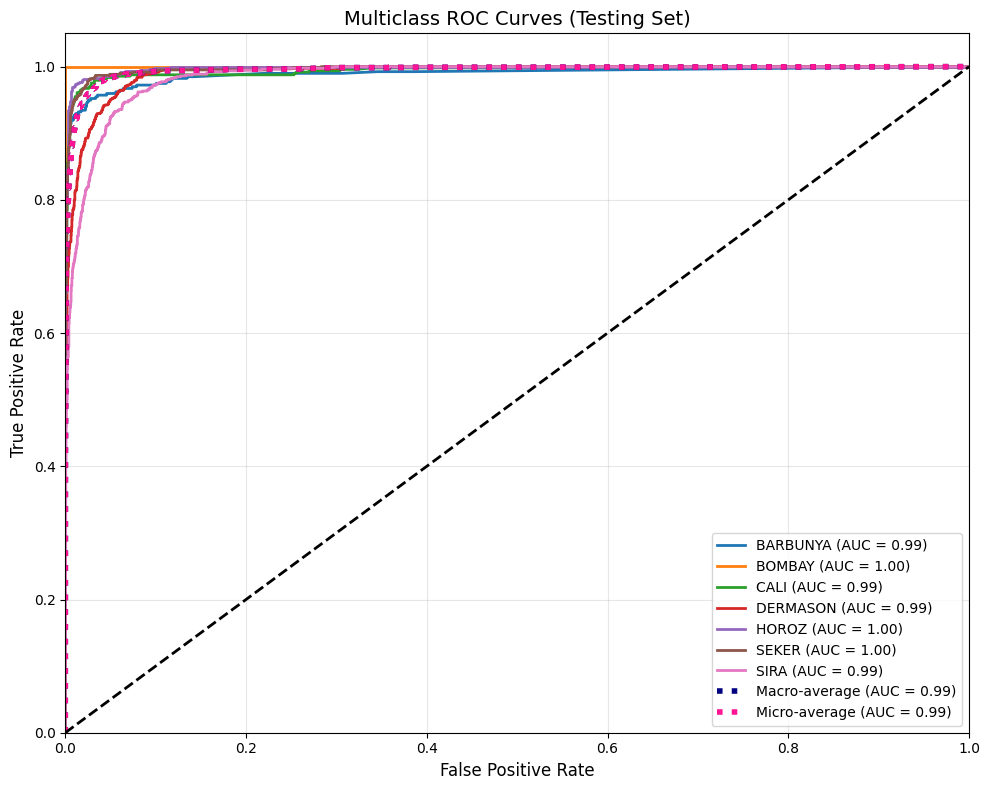


Testing Set ROC AUC 汇总:
Macro-average AUC: 0.9946
Micro-average AUC: 0.9946
BARBUNYA        AUC = 0.9894
BOMBAY          AUC = 1.0000
CALI            AUC = 0.9937
DERMASON        AUC = 0.9912
HOROZ           AUC = 0.9979
SEKER           AUC = 0.9965
SIRA            AUC = 0.9855


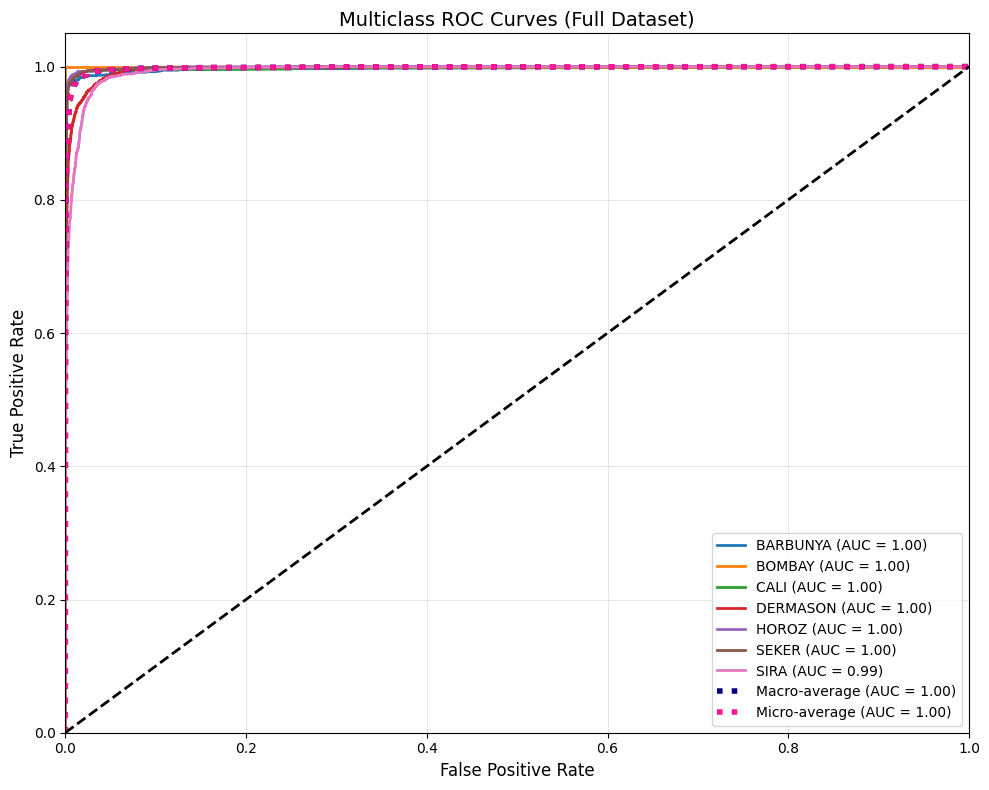


Full Dataset ROC AUC 汇总:
Macro-average AUC: 0.9982
Micro-average AUC: 0.9982
BARBUNYA        AUC = 0.9969
BOMBAY          AUC = 1.0000
CALI            AUC = 0.9981
DERMASON        AUC = 0.9967
HOROZ           AUC = 0.9992
SEKER           AUC = 0.9988
SIRA            AUC = 0.9942

随机森林模型综合评估
Training Set 准确率: 97.62%


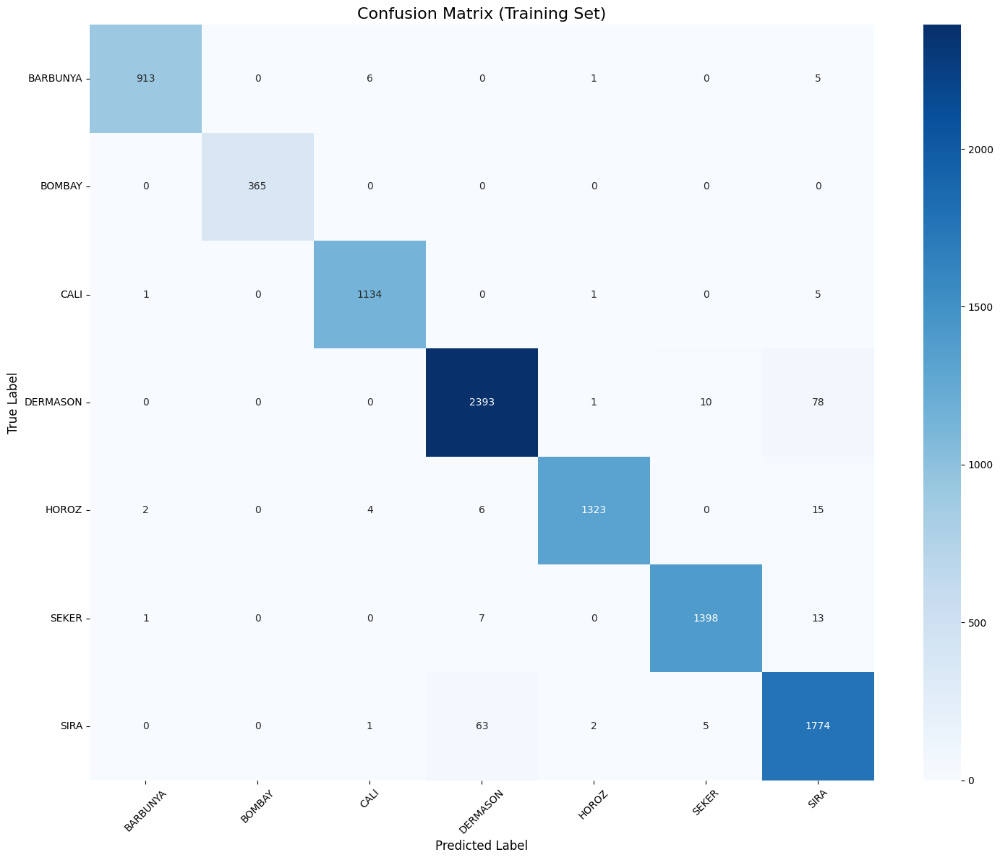


Training Set 分类报告:
              precision    recall  f1-score   support

    BARBUNYA       1.00      0.99      0.99       925
      BOMBAY       1.00      1.00      1.00       365
        CALI       0.99      0.99      0.99      1141
    DERMASON       0.97      0.96      0.97      2482
       HOROZ       1.00      0.98      0.99      1350
       SEKER       0.99      0.99      0.99      1419
        SIRA       0.94      0.96      0.95      1845

    accuracy                           0.98      9527
   macro avg       0.98      0.98      0.98      9527
weighted avg       0.98      0.98      0.98      9527

Testing Set 准确率: 92.51%


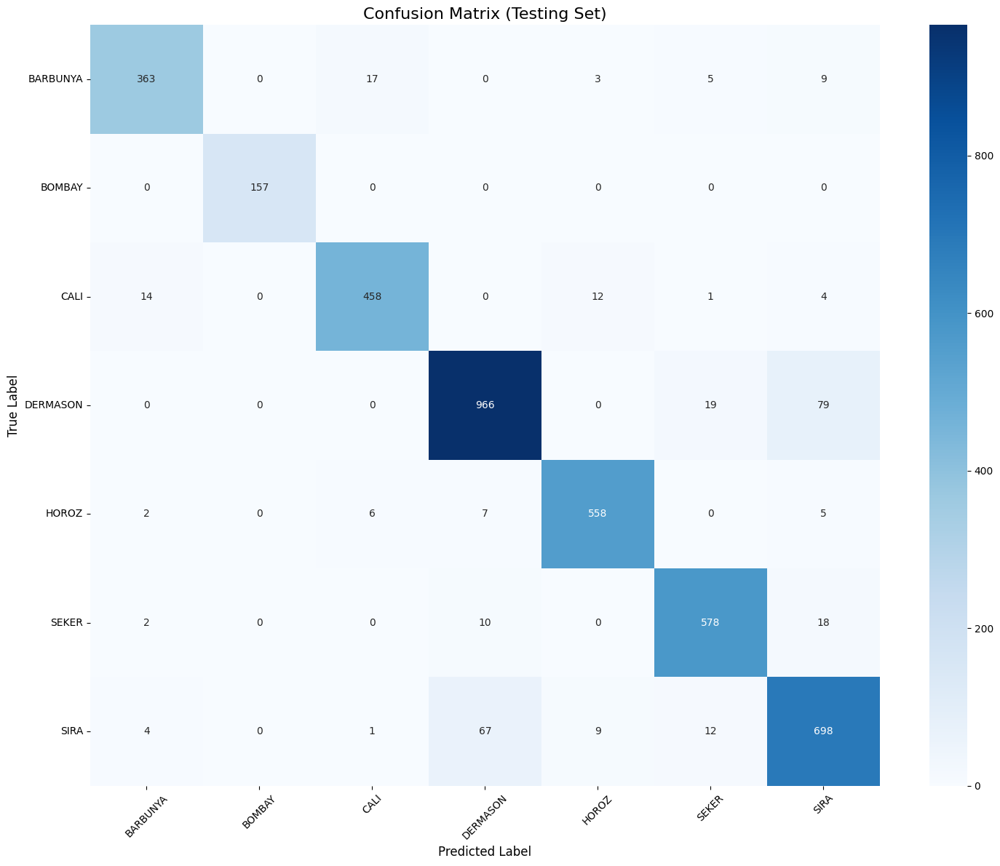


Testing Set 分类报告:
              precision    recall  f1-score   support

    BARBUNYA       0.94      0.91      0.93       397
      BOMBAY       1.00      1.00      1.00       157
        CALI       0.95      0.94      0.94       489
    DERMASON       0.92      0.91      0.91      1064
       HOROZ       0.96      0.97      0.96       578
       SEKER       0.94      0.95      0.95       608
        SIRA       0.86      0.88      0.87       791

    accuracy                           0.93      4084
   macro avg       0.94      0.94      0.94      4084
weighted avg       0.93      0.93      0.93      4084

Full Dataset 准确率: 96.08%


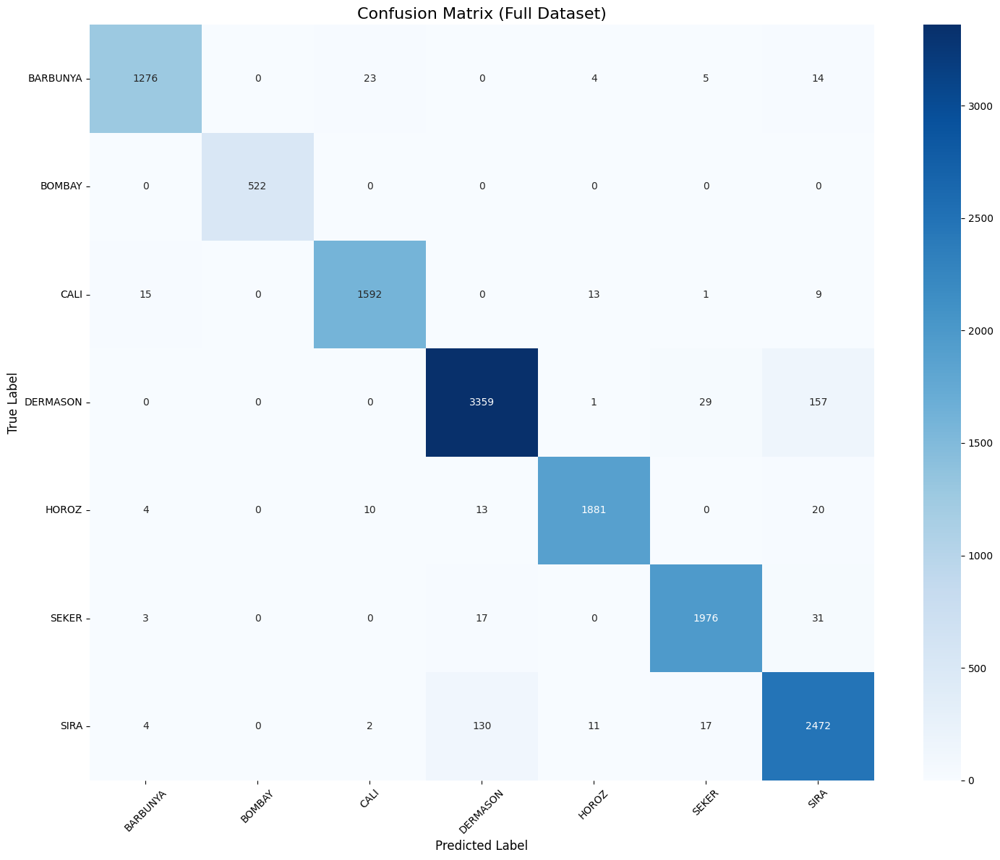


Full Dataset 分类报告:
              precision    recall  f1-score   support

    BARBUNYA       0.98      0.97      0.97      1322
      BOMBAY       1.00      1.00      1.00       522
        CALI       0.98      0.98      0.98      1630
    DERMASON       0.95      0.95      0.95      3546
       HOROZ       0.98      0.98      0.98      1928
       SEKER       0.97      0.97      0.97      2027
        SIRA       0.91      0.94      0.93      2636

    accuracy                           0.96     13611
   macro avg       0.97      0.97      0.97     13611
weighted avg       0.96      0.96      0.96     13611




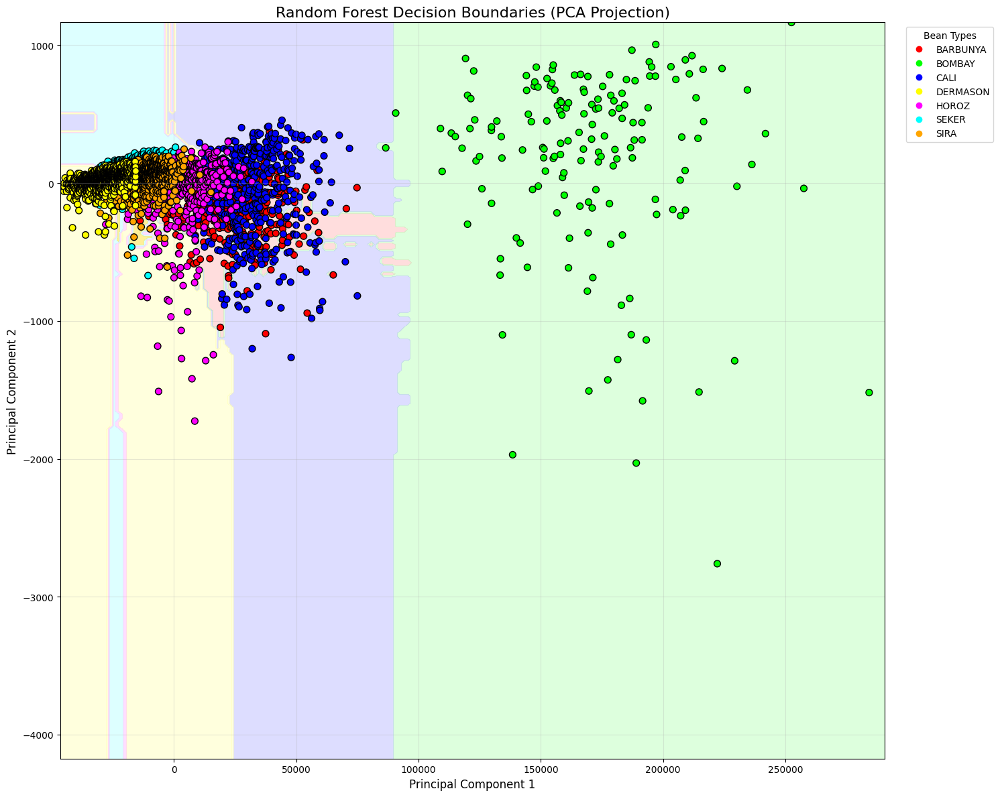

In [ ]:
import pandas as pd
import numpy as np
from sklearn.model_selection import train_test_split
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import (
    accuracy_score,
    classification_report,
    confusion_matrix,
    roc_curve,
    auc
)
from sklearn.preprocessing import label_binarize, LabelEncoder
from sklearn.decomposition import PCA
import matplotlib.pyplot as plt
import seaborn as sns
from itertools import cycle
from matplotlib.colors import ListedColormap

df = pd.read_excel('DryBeanDataset/Dry_Bean_Dataset.xlsx', engine='openpyxl')

df = df.dropna()

df['SF1_x_SF3'] = df['ShapeFactor1'] * df['ShapeFactor3']
df['SF2_squared'] = df['ShapeFactor2'] ** 2
df['SF4_log'] = np.log(df['ShapeFactor4'].abs() + 1e-6)

X = df.drop('Class', axis=1)
y = df['Class']

le = LabelEncoder()
y_encoded = le.fit_transform(y)

X_train, X_test, y_train_encoded, y_test_encoded = train_test_split(
    X, y_encoded,
    test_size=0.3,
    stratify=y_encoded,
    random_state=42
)


X_full = X
y_full_encoded = y_encoded


rf = RandomForestClassifier(
    n_estimators=100,
    max_depth=12,
    min_samples_split=5,
    max_features=0.8,
    class_weight='balanced', 
    n_jobs=-1,  
    random_state=42
)

rf.fit(X_train, y_train_encoded)

y_pred = rf.predict(X_test)
y_proba = rf.predict_proba(X_test)

print(f"Accuracy on testing dataset: {accuracy_score(y_test_encoded, y_pred):.2%}")
print("\ntesting dataset classification report:")
print(classification_report(y_test_encoded, y_pred, target_names=le.classes_))

def plot_multiclass_roc(model, X, y_true, le, title):
    y_proba = model.predict_proba(X)
    y_true_bin = label_binarize(y_true, classes=range(len(le.classes_)))
    n_classes = y_true_bin.shape[1]

    fpr = dict()
    tpr = dict()
    roc_auc = dict()
    for i in range(n_classes):
        fpr[i], tpr[i], _ = roc_curve(y_true_bin[:, i], y_proba[:, i])
        roc_auc[i] = auc(fpr[i], tpr[i])

    fpr["macro"], tpr["macro"], _ = roc_curve(y_true_bin.ravel(), y_proba.ravel())
    roc_auc["macro"] = auc(fpr["macro"], tpr["macro"])

    fpr["micro"], tpr["micro"], _ = roc_curve(y_true_bin.ravel(), y_proba.ravel())
    roc_auc["micro"] = auc(fpr["micro"], tpr["micro"])

    plt.figure(figsize=(10, 8))
    colors = cycle(['#1f77b4', '#ff7f0e', '#2ca02c', '#d62728',
                    '#9467bd', '#8c564b', '#e377c2'])

    for i, color in zip(range(n_classes), colors):
        plt.plot(fpr[i], tpr[i], color=color, lw=2,
                 label=f'{le.classes_[i]} (AUC = {roc_auc[i]:.2f})')

    plt.plot(fpr["macro"], tpr["macro"],
             label=f'Macro-average (AUC = {roc_auc["macro"]:.2f})',
             color='navy', linestyle=':', linewidth=4)

    plt.plot(fpr["micro"], tpr["micro"],
             label=f'Micro-average (AUC = {roc_auc["micro"]:.2f})',
             color='deeppink', linestyle=':', linewidth=4)

    plt.plot([0, 1], [0, 1], 'k--', lw=2)
    plt.xlim([0.0, 1.0])
    plt.ylim([0.0, 1.05])
    plt.xlabel('False Positive Rate', fontsize=12)
    plt.ylabel('True Positive Rate', fontsize=12)
    plt.title(f'Multiclass ROC Curves ({title})', fontsize=14)
    plt.legend(loc="lower right", fontsize=10)
    plt.grid(alpha=0.3)
    plt.tight_layout()
    plt.show()
    print(f"\n{title} ROC AUC 汇总:")
    print(f"Macro-average AUC: {roc_auc['macro']:.4f}")
    print(f"Micro-average AUC: {roc_auc['micro']:.4f}")
    for i in range(n_classes):
        print(f'{le.classes_[i]:<15} AUC = {roc_auc[i]:.4f}')

# ROC/AUC image
print("\n" + "="*60)
print("各数据集 ROC/AUC 曲线")
print("="*60)

plot_multiclass_roc(rf, X_train, y_train_encoded, le, "Training Set")
plot_multiclass_roc(rf, X_test, y_test_encoded, le, "Testing Set")
plot_multiclass_roc(rf, X_full, y_full_encoded, le, "Full Dataset")

print("\n" + "="*60)
print("random forest overall report")
print("="*60)

def evaluate_model(model, X, y_true, le, dataset_name):
    y_pred = model.predict(X)
    acc = accuracy_score(y_true, y_pred)
    print(f"{dataset_name} accuracy: {acc:.2%}")
    cm = confusion_matrix(y_true, y_pred)
    plt.figure(figsize=(15, 12))
    sns.heatmap(cm, annot=True, fmt='d',
                xticklabels=le.classes_,
                yticklabels=le.classes_,
                cmap='Blues',
                annot_kws={'size': 10})
    plt.title(f'Confusion Matrix ({dataset_name})', fontsize=16)
    plt.xlabel('Predicted Label', fontsize=12)
    plt.ylabel('True Label', fontsize=12)
    plt.xticks(rotation=45, fontsize=10)
    plt.yticks(rotation=0, fontsize=10)
    plt.tight_layout()
    plt.show()
    print(f"\n{dataset_name} classification report:")
    print(classification_report(y_true, y_pred, target_names=le.classes_))


evaluate_model(rf, X_train, y_train_encoded, le, "Training Set")
evaluate_model(rf, X_test, y_test_encoded, le, "Testing Set")
evaluate_model(rf, X_full, y_full_encoded, le, "Full Dataset")

print("="*60 + "\n")


# PCA
pca = PCA(n_components=2)
X_pca = pca.fit_transform(X_full)

rf_pca = RandomForestClassifier(
    n_estimators=100,
    max_depth=12,
    min_samples_split=5,
    max_features=0.8,
    class_weight='balanced',
    n_jobs=-1,
    random_state=42
)
rf_pca.fit(X_pca, y_full_encoded)

x_min, x_max = X_pca[:, 0].min() - 1, X_pca[:, 0].max() + 1
y_min, y_max = X_pca[:, 1].min() - 1, X_pca[:, 1].max() + 1
xx, yy = np.meshgrid(np.linspace(x_min, x_max, 200),
                     np.linspace(y_min, y_max, 200))

Z = rf_pca.predict(np.c_[xx.ravel(), yy.ravel()])
Z = Z.reshape(xx.shape)

plt.figure(figsize=(15, 12))
cmap_light = ListedColormap(['#FFAAAA', '#AAFFAA','#AAAAFF','#FFFFAA','#FFAAFF','#AAFFFF','#FFD700'])
plt.contourf(xx, yy, Z, alpha=0.4, cmap=cmap_light)

np.random.seed(42)
sample_mask = np.random.rand(len(X_pca)) < 0.3
scatter = plt.scatter(
    X_pca[sample_mask, 0],
    X_pca[sample_mask, 1],
    c=y_full_encoded[sample_mask],
    cmap=ListedColormap(['#FF0000', '#00FF00','#0000FF','#FFFF00','#FF00FF','#00FFFF','#FFA500']),
    edgecolor='k',
    s=50,
    label=le.classes_
)

handles, _ = scatter.legend_elements()
plt.legend(handles, le.classes_,
          title="Bean Types",
          loc='upper left',
          bbox_to_anchor=(1.02, 1))

plt.title("Random Forest Decision Boundaries (PCA Projection)", fontsize=16)
plt.xlabel("Principal Component 1", fontsize=12)
plt.ylabel("Principal Component 2", fontsize=12)
plt.grid(alpha=0.3)
plt.tight_layout()
plt.show()

SVM

测试集准确率: 92.97%

测试集分类报告:
              precision    recall  f1-score   support

    BARBUNYA       0.95      0.91      0.93       397
      BOMBAY       1.00      1.00      1.00       157
        CALI       0.94      0.95      0.95       489
    DERMASON       0.91      0.93      0.92      1064
       HOROZ       0.96      0.96      0.96       578
       SEKER       0.95      0.96      0.95       608
        SIRA       0.88      0.88      0.88       791

    accuracy                           0.93      4084
   macro avg       0.94      0.94      0.94      4084
weighted avg       0.93      0.93      0.93      4084



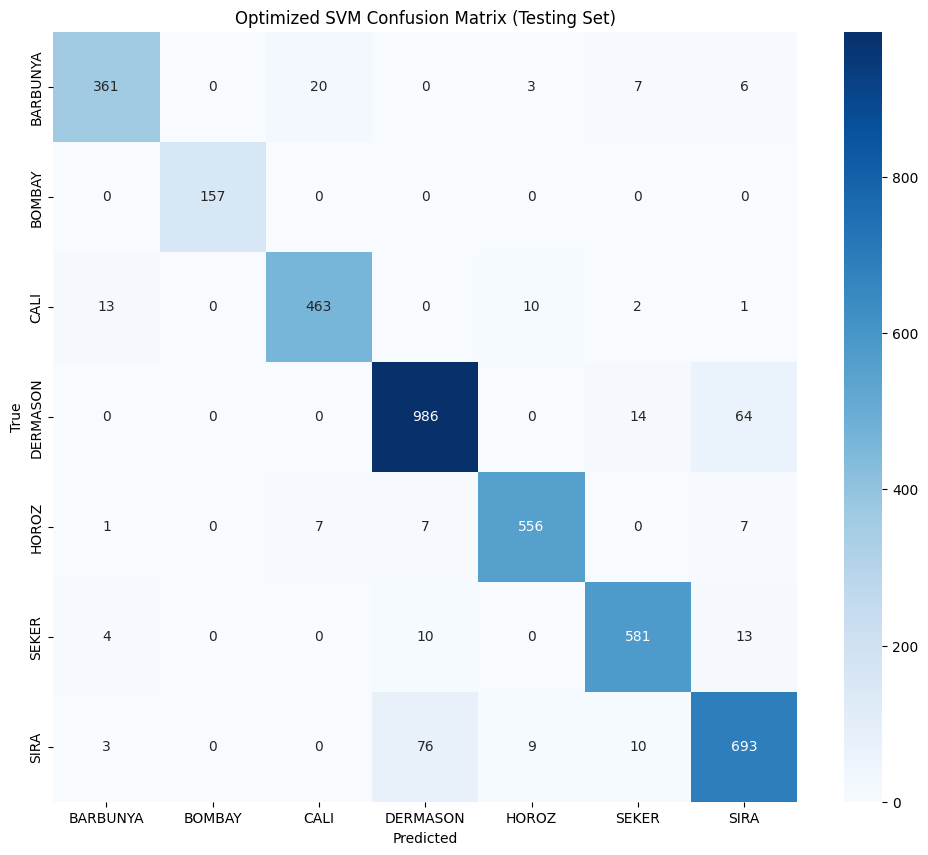


各数据集 ROC/AUC 曲线


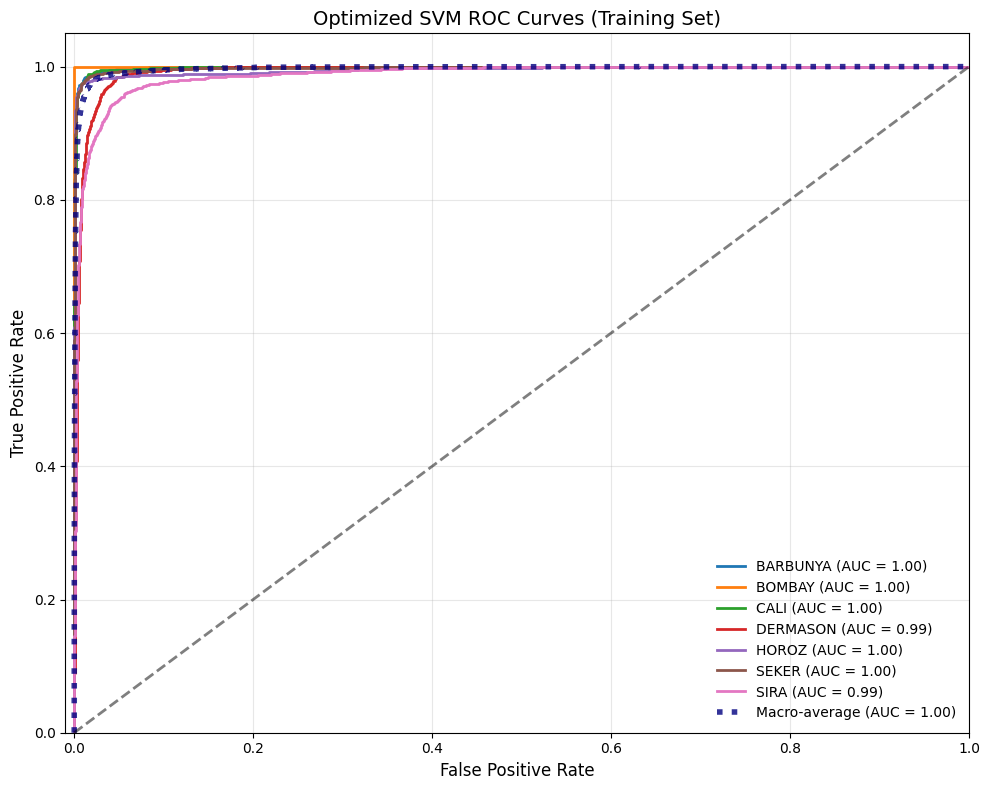


Training Set ROC AUC 汇总:
BARBUNYA        AUC = 0.9990
BOMBAY          AUC = 1.0000
CALI            AUC = 0.9985
DERMASON        AUC = 0.9928
HOROZ           AUC = 0.9956
SEKER           AUC = 0.9979
SIRA            AUC = 0.9874
Macro-average AUC = 0.9969


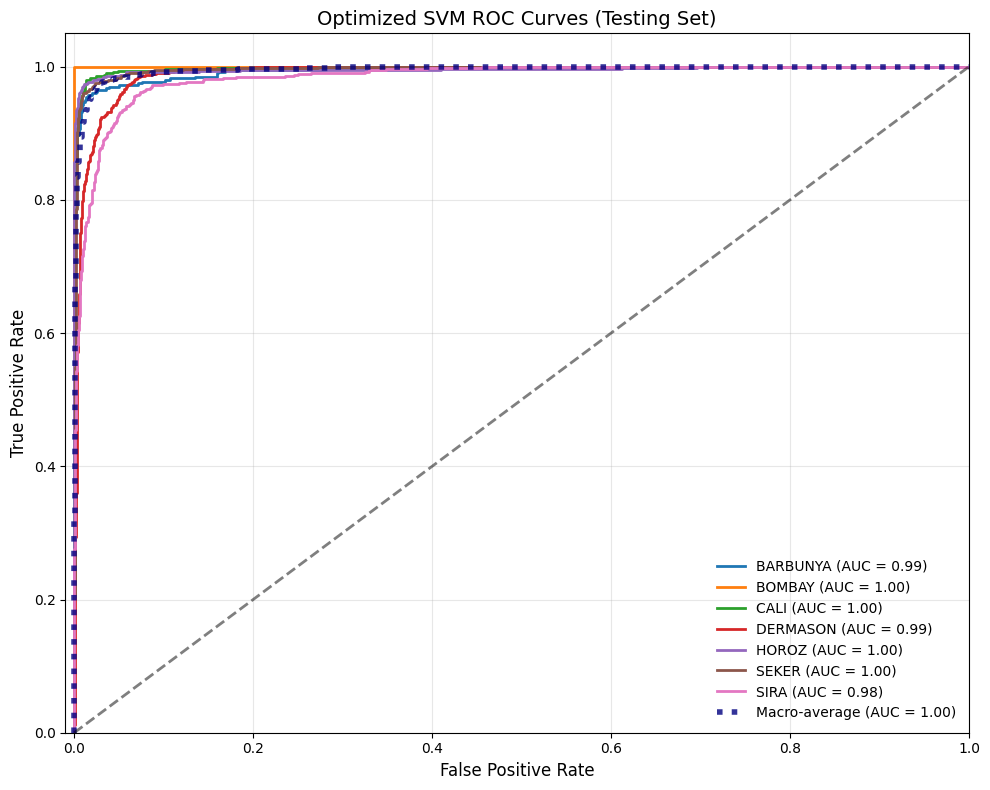


Testing Set ROC AUC 汇总:
BARBUNYA        AUC = 0.9940
BOMBAY          AUC = 1.0000
CALI            AUC = 0.9966
DERMASON        AUC = 0.9902
HOROZ           AUC = 0.9956
SEKER           AUC = 0.9963
SIRA            AUC = 0.9838
Macro-average AUC = 0.9950


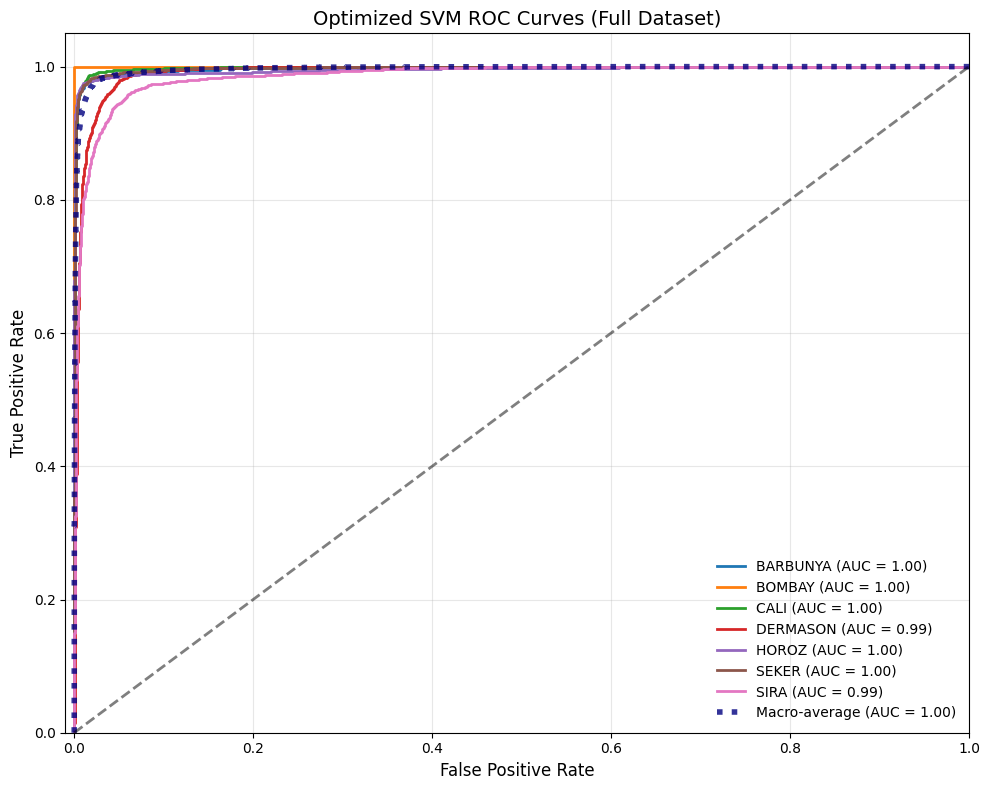


Full Dataset ROC AUC 汇总:
BARBUNYA        AUC = 0.9975
BOMBAY          AUC = 1.0000
CALI            AUC = 0.9979
DERMASON        AUC = 0.9920
HOROZ           AUC = 0.9956
SEKER           AUC = 0.9974
SIRA            AUC = 0.9864
Macro-average AUC = 0.9964

各数据集分类报告

Training Set 分类报告:
              precision    recall  f1-score   support

    BARBUNYA       0.97      0.96      0.96       925
      BOMBAY       1.00      1.00      1.00       365
        CALI       0.96      0.96      0.96      1141
    DERMASON       0.92      0.95      0.94      2482
       HOROZ       0.98      0.96      0.97      1350
       SEKER       0.97      0.96      0.97      1419
        SIRA       0.91      0.89      0.90      1845

    accuracy                           0.95      9527
   macro avg       0.96      0.95      0.96      9527
weighted avg       0.95      0.95      0.95      9527


Testing Set 分类报告 (见上方)

Full Dataset 分类报告:
              precision    recall  f1-score   support

    BARBUNYA      

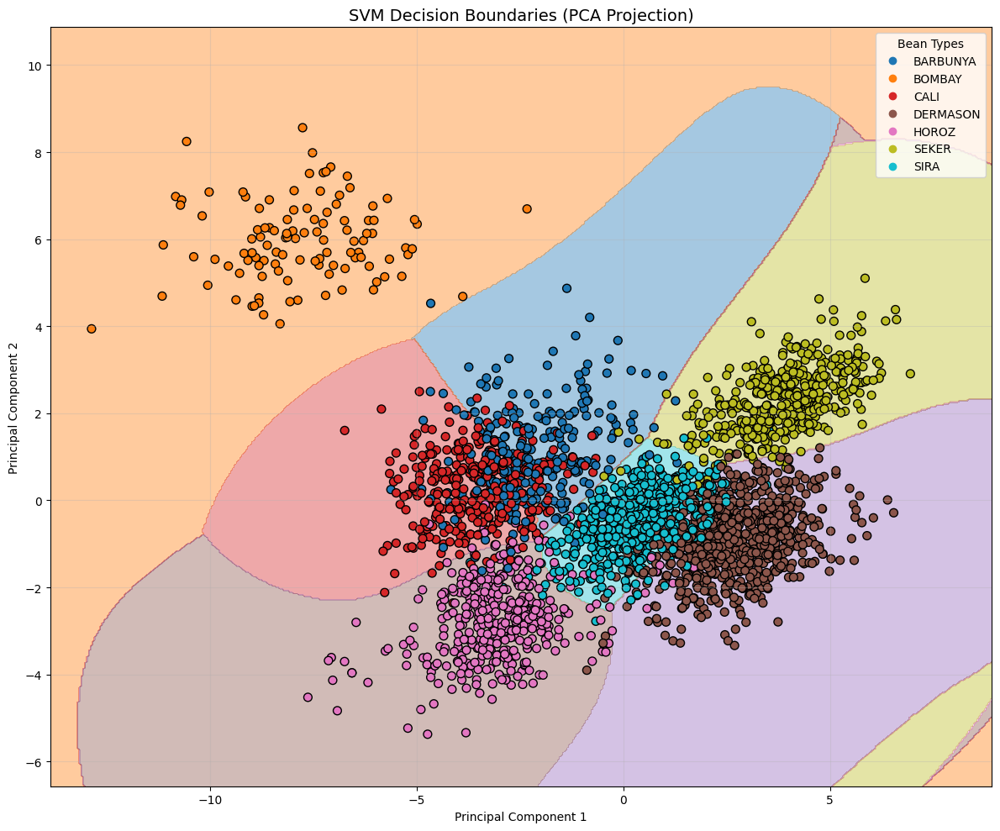

In [ ]:
import pandas as pd
import numpy as np
from sklearn.model_selection import train_test_split
from sklearn.svm import SVC
from sklearn.metrics import (
    accuracy_score,
    classification_report,
    confusion_matrix,
    roc_curve,
    auc
)
from sklearn.preprocessing import label_binarize, StandardScaler, LabelEncoder
import matplotlib.pyplot as plt
import seaborn as sns
from itertools import cycle
from sklearn.pipeline import Pipeline
from sklearn.decomposition import PCA
from sklearn.preprocessing import LabelEncoder


df = pd.read_excel('DryBeanDataset/Dry_Bean_Dataset.xlsx', engine='openpyxl')

if 'Class' not in df.columns:
    raise ValueError("数据中缺少Class列，请检查Excel文件结构")

df = df.dropna()

df['SF1_x_SF3'] = df['ShapeFactor1'] * df['ShapeFactor3']
df['SF2_squared'] = df['ShapeFactor2'] ** 2
df['SF4_log'] = np.log(df['ShapeFactor4'].abs() + 1e-6)

X = df.drop('Class', axis=1)
y = df['Class']

le = LabelEncoder()
y_encoded = le.fit_transform(y)


X_train, X_test, y_train_encoded, y_test_encoded = train_test_split(
    X, y_encoded,
    test_size=0.3,
    stratify=y_encoded,
    random_state=42
)

X_full = X
y_full_encoded = y_encoded


best_params = {
    'C': 10,
    'gamma': 0.1,
    'kernel': 'rbf',
    'class_weight': None,
    'probability': True,
    'random_state': 42
}


pipe = Pipeline([
    ('scaler', StandardScaler()),
    ('svm', SVC(**best_params))
])

pipe.fit(X_train, y_train_encoded)


y_pred = pipe.predict(X_test)
y_proba = pipe.predict_proba(X_test)


print("="*60)
print(f"testing dataset accuracy: {accuracy_score(y_test_encoded, y_pred):.2%}")
print("\ntesting dataset report:")
print(classification_report(y_test_encoded, y_pred, target_names=le.classes_))
print("="*60)


plt.figure(figsize=(12, 10))
cm = confusion_matrix(y_test_encoded, y_pred)
sns.heatmap(cm, annot=True, fmt='d',
            xticklabels=le.classes_,
            yticklabels=le.classes_,
            cmap='Blues')
plt.title('Optimized SVM Confusion Matrix (Testing Set)')
plt.xlabel('Predicted')
plt.ylabel('True')
plt.show()


def plot_multiclass_roc(model, X, y_true, le, title):
    y_proba = model.predict_proba(X)
    y_true_bin = label_binarize(y_true, classes=range(len(le.classes_)))
    n_classes = y_true_bin.shape[1]

    

    fpr = dict()
    tpr = dict()
    roc_auc = dict()
    for i in range(n_classes):
        fpr[i], tpr[i], _ = roc_curve(y_true_bin[:, i], y_proba[:, i])
        roc_auc[i] = auc(fpr[i], tpr[i])

    fpr["macro"], tpr["macro"], _ = roc_curve(y_true_bin.ravel(), y_proba.ravel())
    roc_auc["macro"] = auc(fpr["macro"], tpr["macro"])

    plt.figure(figsize=(10, 8))
    colors = cycle(['#1f77b4', '#ff7f0e', '#2ca02c', '#d62728', '#9467bd', '#8c564b', '#e377c2'])
    for i, color in zip(range(n_classes), colors):
        plt.plot(fpr[i], tpr[i], color=color, lw=2,
                 label=f'{le.classes_[i]} (AUC = {roc_auc[i]:.2f})')

    plt.plot(fpr["macro"], tpr["macro"],
             label=f'Macro-average (AUC = {roc_auc["macro"]:.2f})',
             color='navy', linestyle=':', linewidth=4,
             alpha=0.8)

    plt.plot([0, 1], [0, 1], 'k--', lw=2, alpha=0.5)
    plt.xlim([-0.01, 1.0])
    plt.ylim([0.0, 1.05])
    plt.xlabel('False Positive Rate', fontsize=12)
    plt.ylabel('True Positive Rate', fontsize=12)
    plt.title(f'Optimized SVM ROC Curves ({title})', fontsize=14)
    plt.legend(loc="lower right", frameon=False)
    plt.grid(True, alpha=0.3)
    plt.tight_layout()
    plt.show()
    print(f"\n{title} ROC AUC 汇总:")
    for i in range(n_classes):
        print(f'{le.classes_[i]:<15} AUC = {roc_auc[i]:.4f}')
    print(f'Macro-average AUC = {roc_auc["macro"]:.4f}')

print("\n" + "="*60)
print("ROC/AUC")
print("="*60)

y_train_proba = pipe.predict_proba(X_train)
plot_multiclass_roc(pipe, X_train, y_train_encoded, le, "Training Set")

plot_multiclass_roc(pipe, X_test, y_test_encoded, le, "Testing Set")

y_full_proba = pipe.predict_proba(X_full)
plot_multiclass_roc(pipe, X_full, y_full_encoded, le, "Full Dataset")

print("\n" + "="*60)
print("all reports")
print("="*60)


y_train_pred = pipe.predict(X_train)
print("\nTraining Set report:")
print(classification_report(y_train_encoded, y_train_pred, target_names=le.classes_))

print("\nTesting Set report(see above)")


y_full_pred = pipe.predict(X_full)
print("\nFull Dataset report:")
print(classification_report(y_full_encoded, y_full_pred, target_names=le.classes_))

print("\n" + "="*60)



#PCA
scaler = StandardScaler()
X_scaled = scaler.fit_transform(X_train)
pca = PCA(n_components=2)
X_pca = pca.fit_transform(X_scaled)

svm_pca = SVC(**best_params)
svm_pca.fit(X_pca, y_train_encoded)  # 使用数值标签


x_min, x_max = X_pca[:, 0].min()-1, X_pca[:, 0].max()+1
y_min, y_max = X_pca[:, 1].min()-1, X_pca[:, 1].max()+1
xx, yy = np.meshgrid(np.linspace(x_min, x_max, 500),
                     np.linspace(y_min, y_max, 500))

grid_pred = svm_pca.predict(np.c_[xx.ravel(), yy.ravel()])
grid_pred = grid_pred.reshape(xx.shape)

plt.figure(figsize=(12, 10))
plt.contourf(xx, yy, grid_pred, alpha=0.4, cmap=plt.cm.tab10)


np.random.seed(42)
sample_mask = np.random.rand(len(X_pca)) < 0.3
scatter = plt.scatter(
    X_pca[sample_mask, 0],
    X_pca[sample_mask, 1],
    c=y_train_encoded[sample_mask],  # 数值标签
    cmap=plt.cm.tab10,
    edgecolor='k',
    s=50
)


handles, _ = scatter.legend_elements()
plt.legend(handles, le.classes_, title="Bean Types")

plt.title("SVM Decision Boundaries (PCA Projection)", fontsize=14)
plt.xlabel("Principal Component 1")
plt.ylabel("Principal Component 2")
plt.grid(alpha=0.3)
plt.tight_layout()
plt.show()

xgboost

Splitting data into train/val/test sets...
Fitting 5 folds for each of 576 candidates, totalling 2880 fits
Best hyperparameters:
{'colsample_bytree': 1.0, 'gamma': 1, 'learning_rate': 0.2, 'max_depth': 8, 'n_estimators': 200, 'reg_alpha': 1, 'reg_lambda': 1, 'subsample': 0.8}
Train set accuracy: 96.89%


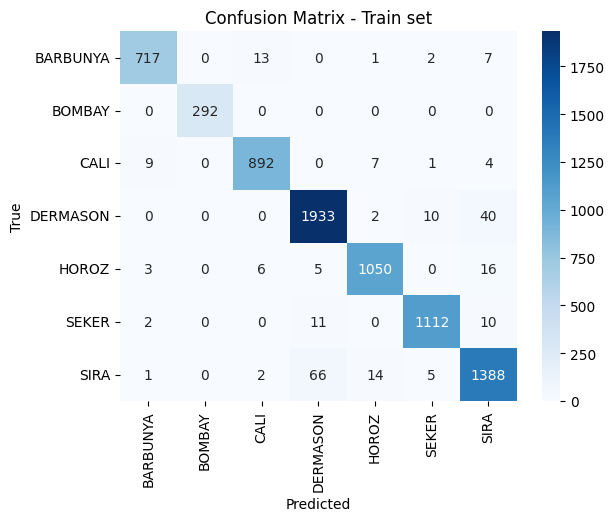

Classification report for train set:
              precision    recall  f1-score   support

    BARBUNYA       0.98      0.97      0.97       740
      BOMBAY       1.00      1.00      1.00       292
        CALI       0.98      0.98      0.98       913
    DERMASON       0.96      0.97      0.97      1985
       HOROZ       0.98      0.97      0.97      1080
       SEKER       0.98      0.98      0.98      1135
        SIRA       0.95      0.94      0.94      1476

    accuracy                           0.97      7621
   macro avg       0.97      0.97      0.97      7621
weighted avg       0.97      0.97      0.97      7621



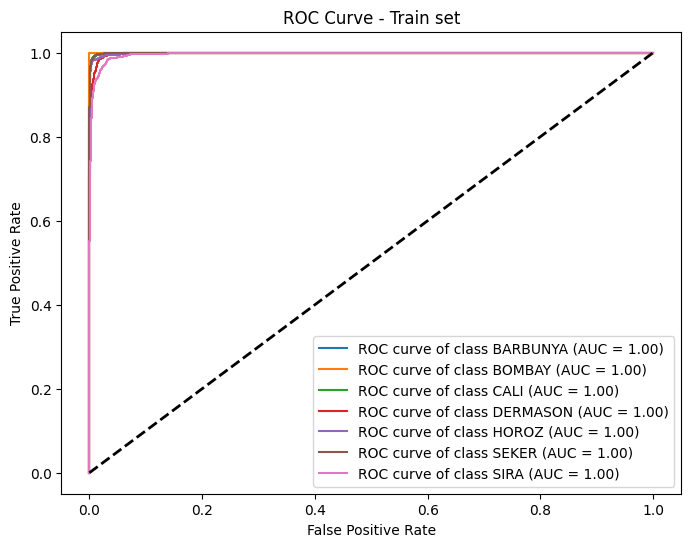

Average AUC (train set): 0.9990
Test set accuracy: 92.53%


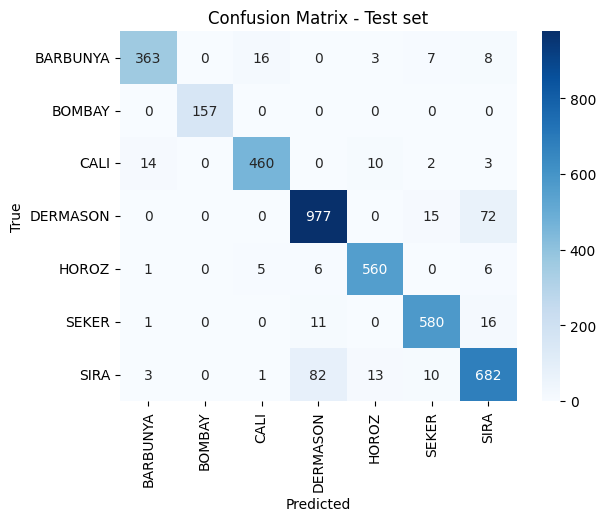

Classification report for test set:
              precision    recall  f1-score   support

    BARBUNYA       0.95      0.91      0.93       397
      BOMBAY       1.00      1.00      1.00       157
        CALI       0.95      0.94      0.95       489
    DERMASON       0.91      0.92      0.91      1064
       HOROZ       0.96      0.97      0.96       578
       SEKER       0.94      0.95      0.95       608
        SIRA       0.87      0.86      0.86       791

    accuracy                           0.93      4084
   macro avg       0.94      0.94      0.94      4084
weighted avg       0.93      0.93      0.93      4084



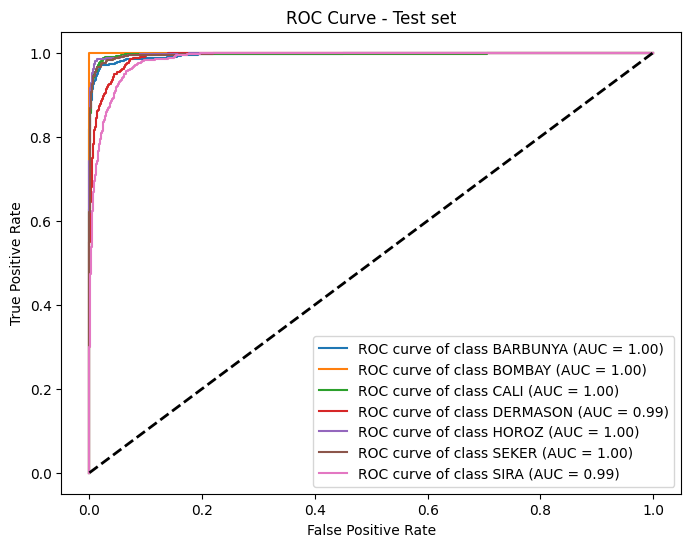

Average AUC (test set): 0.9951
Whole dataset accuracy: 95.02%


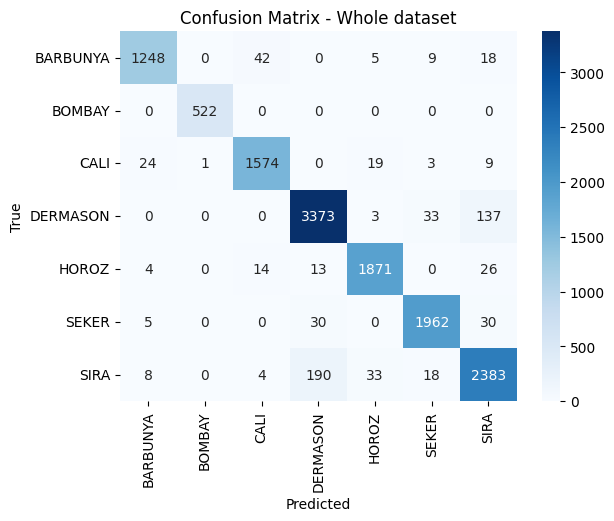

Classification report for whole dataset:
              precision    recall  f1-score   support

    BARBUNYA       0.97      0.94      0.96      1322
      BOMBAY       1.00      1.00      1.00       522
        CALI       0.96      0.97      0.96      1630
    DERMASON       0.94      0.95      0.94      3546
       HOROZ       0.97      0.97      0.97      1928
       SEKER       0.97      0.97      0.97      2027
        SIRA       0.92      0.90      0.91      2636

    accuracy                           0.95     13611
   macro avg       0.96      0.96      0.96     13611
weighted avg       0.95      0.95      0.95     13611



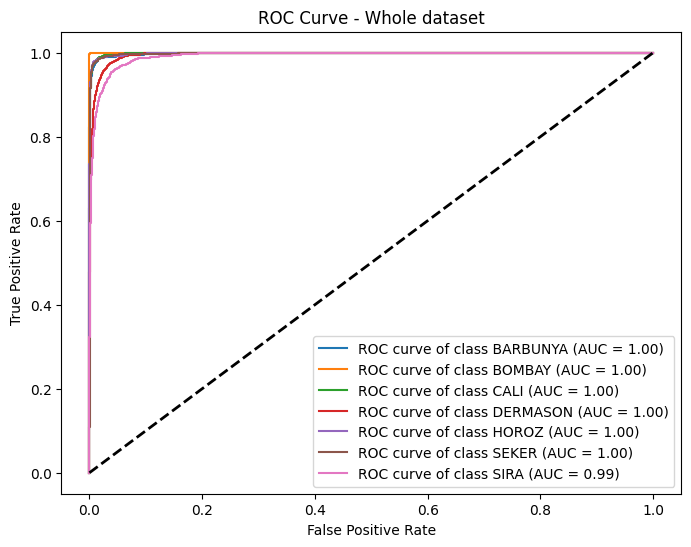

Average AUC (whole dataset): 0.9974


In [ ]:
from xgboost import XGBClassifier
from sklearn.model_selection import GridSearchCV, StratifiedKFold
from sklearn.metrics import accuracy_score
from sklearn.model_selection import train_test_split
import pandas as pd
import numpy as np
from sklearn.metrics import confusion_matrix, classification_report, roc_curve, auc
from sklearn.preprocessing import label_binarize
import seaborn as sns

data = pd.read_csv("Dry_Bean_Dataset.csv")
X = data.iloc[:, :-1]
y = data.iloc[:, -1]
classes = np.unique(y)
y_int = np.array([np.where(classes == label)[0][0] for label in y])

print("Splitting data into train/val/test sets...")
X_trainval, X_test, y_trainval, y_test = train_test_split(X, y_int, test_size=0.3, random_state=42, stratify=y_int)

X_train, X_val, y_train, y_val = train_test_split(X_trainval, y_trainval, test_size=0.2, random_state=42, stratify=y_trainval)

# parameter grid for common hyperparameters
param_grid = {
    'learning_rate': [0.05, 0.1, 0.2],
    'max_depth': [4, 6, 8],
    'n_estimators': [100, 200],
    'subsample': [0.8, 1.0],
    'colsample_bytree': [0.8, 1.0],
    'gamma': [0, 1],
    'reg_lambda': [1, 2],  
    'reg_alpha': [0, 1]   
}

xgb_clf = XGBClassifier(
    objective='multi:softmax',
    num_class=len(classes),
    n_jobs=-1
)

cv = StratifiedKFold(n_splits=5, shuffle=True, random_state=42)
grid = GridSearchCV(
    estimator=xgb_clf,
    param_grid=param_grid,
    scoring='accuracy',
    cv=cv,
    n_jobs=-1,
    verbose=1
)

grid.fit(X_train, y_train)

print("Best hyperparameters:")
print(grid.best_params_)


import matplotlib.pyplot as plt

# fit the best estimator on the full training set
final_model = grid.best_estimator_

y_encoded = y_int

datasets = [
    ("Train set", X_train, y_train),
    ("Test set", X_test, y_test),
    ("Whole dataset", X, y_encoded)
]

for name, X_set, y_set in datasets:
    y_pred = final_model.predict(X_set)
    accuracy = final_model.score(X_set, y_set) * 100
    print(f"{name} accuracy: {accuracy:.2f}%")
    
    # confusion matrix
    cm = confusion_matrix(y_set, y_pred)
    sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', xticklabels=classes, yticklabels=classes)
    plt.title(f"Confusion Matrix - {name}")
    plt.xlabel("Predicted")
    plt.ylabel("True")
    plt.show()
    
    print(f"Classification report for {name.lower()}:")
    print(classification_report(y_set, y_pred, target_names=classes))
    
    y_bin = label_binarize(y_set, classes=range(len(classes)))
    if hasattr(final_model, "predict_proba"):
        y_score = final_model.predict_proba(X_set)
    else:
        y_score = final_model.decision_function(X_set)
    
    fpr = dict()
    tpr = dict()
    roc_auc = dict()
    for i in range(len(classes)):
        fpr[i], tpr[i], _ = roc_curve(y_bin[:, i], y_score[:, i])
        roc_auc[i] = auc(fpr[i], tpr[i])
    
    fpr["micro"], tpr["micro"], _ = roc_curve(y_bin.ravel(), y_score.ravel())
    roc_auc["micro"] = auc(fpr["micro"], tpr["micro"])
    
    # plot ROC curve 
    plt.figure(figsize=(8, 6))
    for i in range(len(classes)):
        plt.plot(fpr[i], tpr[i], label=f'ROC curve of class {classes[i]} (AUC = {roc_auc[i]:0.2f})')
    plt.plot([0, 1], [0, 1], 'k--', lw=2)
    plt.xlabel('False Positive Rate')
    plt.ylabel('True Positive Rate')
    plt.title(f'ROC Curve - {name}')
    plt.legend(loc="lower right")
    plt.show()
    
    # print average AUC
    average_auc = np.mean([roc_auc[i] for i in range(len(classes))])
    print(f'Average AUC ({name.lower()}): {average_auc:.4f}')

/var/folders/qk/zgyqcw1j2d7_d2zbzrqgtfmw0000gn/T/ipykernel_70208/360963000.py:33: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.
  plt.contourf(xx, yy, Z, alpha=0.3, cmap=plt.cm.get_cmap('tab10', len(classes)))
/var/folders/qk/zgyqcw1j2d7_d2zbzrqgtfmw0000gn/T/ipykernel_70208/360963000.py:34: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.
  scatter = plt.scatter(X_pca[:, 0], X_pca[:, 1], c=y_int, cmap=plt.cm.get_cmap('tab10', len(classes)), edgecolor='k', s=20)


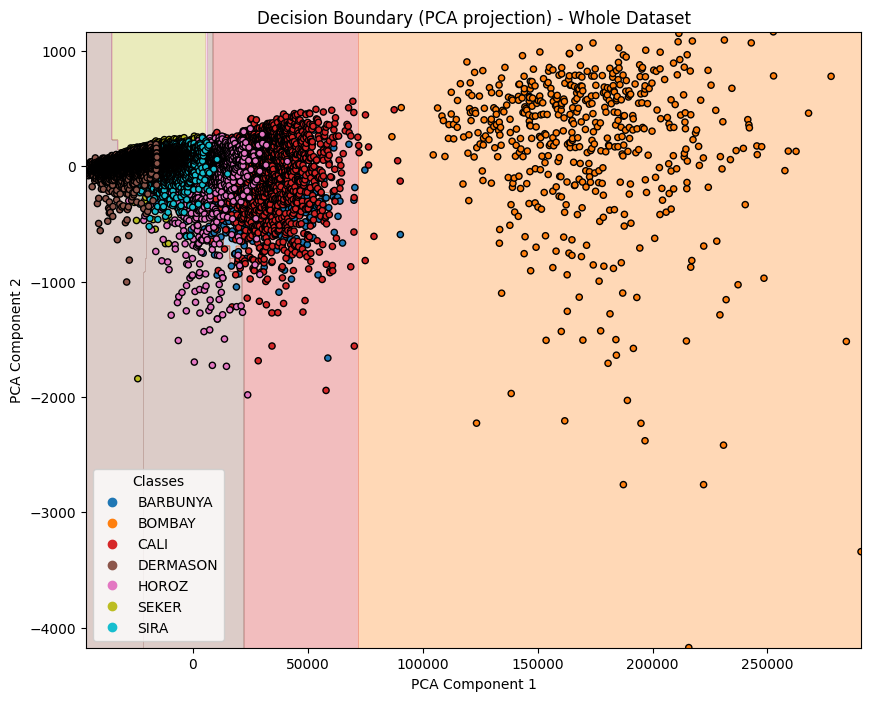

In [ ]:
from sklearn.decomposition import PCA
import numpy as np

#PCA
pca = PCA(n_components=2)
X_pca = pca.fit_transform(X)

model_vis = XGBClassifier(
    random_state=42,
    colsample_bytree=grid.best_params_["colsample_bytree"],
    gamma=grid.best_params_["gamma"],
    learning_rate=grid.best_params_["learning_rate"],   
    max_depth=grid.best_params_["max_depth"], 
    n_estimators=grid.best_params_["n_estimators"],
    reg_alpha=grid.best_params_["reg_alpha"],
    reg_lambda=grid.best_params_["reg_lambda"],
    subsample=grid.best_params_["subsample"]
)


model_vis.fit(X_pca, y_int)

x_min, x_max = X_pca[:, 0].min() - 1, X_pca[:, 0].max() + 1
y_min, y_max = X_pca[:, 1].min() - 1, X_pca[:, 1].max() + 1
xx, yy = np.meshgrid(np.linspace(x_min, x_max, 500),
                     np.linspace(y_min, y_max, 500))
Z = model_vis.predict(np.c_[xx.ravel(), yy.ravel()])
Z = Z.reshape(xx.shape)

plt.figure(figsize=(10, 8))
plt.contourf(xx, yy, Z, alpha=0.3, cmap=plt.cm.get_cmap('tab10', len(classes)))
scatter = plt.scatter(X_pca[:, 0], X_pca[:, 1], c=y_int, cmap=plt.cm.get_cmap('tab10', len(classes)), edgecolor='k', s=20)
plt.xlabel('PCA Component 1')
plt.ylabel('PCA Component 2')
plt.title('Decision Boundary (PCA projection) - Whole Dataset')

handles, _ = scatter.legend_elements(prop="colors")
plt.legend(handles, classes, title="Classes", loc="best")

plt.show()
